In [3]:
!module load libspatialindex
!module load arrow

In [1]:
import sys
sys.path.append("./notebooks")  # Adjust the path if model_evaluation.py is elsewhere
from utils.model_evaluation import evaluate_fusion_cnn
import geopandas as gpd

%load_ext autoreload
%autoreload 2

/home/alexisb1/species-dist/ENV/lib/python3.11/site-packages/pyproj/__init__.py:91: UserWarning: Valid PROJ data directory not found. Either set the path using the environmental variable PROJ_DATA (PROJ 9.1+) | PROJ_LIB (PROJ<9.1) or with `pyproj.datadir.set_data_dir`.
  warnings.warn(str(err))


In [2]:
from shapely.wkt import loads as wkt_loads
processed_species_original_locations = gpd.read_file("data/saved_df/processed_species_original_locations_point_data.csv")

processed_species_original_locations['geometry'] = processed_species_original_locations['geometry'].apply(wkt_loads)
processed_species_original_locations = gpd.GeoDataFrame(processed_species_original_locations, geometry='geometry', crs="EPSG:6624")
processed_species_original_locations = processed_species_original_locations.to_crs(epsg=4326)

In [3]:
from models.multi_species_fusion_cnn import create_species_configs
def calculate_species_presence_ratio(processed_species_original_locations, species_codes):
    """
    Calculate the ratio of presence for each species in the species_list column.

    Args:
        processed_species_original_locations (GeoDataFrame): DataFrame with a 'species_list' column.
        species_codes (list): List of species codes to check.

    Returns:
        dict: {species_code: presence_ratio}
    """
    total_rows = len(processed_species_original_locations)
    ratios = {}
    for species in species_codes:
        count = processed_species_original_locations['species_list'].apply(lambda x: species in x).sum()
        ratios[species] = count / total_rows
    return ratios


#convert the species_list column which is a list into a list. Now its interpreted as a full string
processed_species_original_locations['species_list'] = processed_species_original_locations['species_list'].apply(lambda x: eval(x) if isinstance(x, str) else x)
#extract all species code from species_list column into a flat list this column is a list of strings
all_species_codes = []
for species_list in processed_species_original_locations['species_list']:
    for species in species_list:
        if species not in all_species_codes:
            all_species_codes.append(species)
species_presence_ratios = calculate_species_presence_ratio(processed_species_original_locations, all_species_codes)

#sort species by presence ratio
sorted_species = sorted(species_presence_ratios.items(), key=lambda x: x[1], reverse=True)

#only keep species with presence ratio > 0.01
filtered_sorted_species = [item for item in sorted_species if item[1] > 0.05]

species_presence_ratios = calculate_species_presence_ratio(processed_species_original_locations, all_species_codes)
#sort species by presence ratio
sorted_species = sorted(species_presence_ratios.items(), key=lambda x: x[1], reverse=True)

#only keep species with presence ratio > 0.01
filtered_sorted_species = [item for item in sorted_species if item[1] > 0.05]

filtered_species_codes = [item[0] for item in filtered_sorted_species]

selected_species = filtered_sorted_species[0:15] + filtered_sorted_species[20:35] + filtered_sorted_species[50:65] + filtered_sorted_species[90:105]
# selected_species = filtered_sorted_species[50:65] + filtered_sorted_species[90:105]

species_names = [item[0] for item in selected_species]
prevalences = [item[1] for item in selected_species]

species_configs = create_species_configs(species_names, prevalences, loss_type="asymmetric", variant='balanced')

In [4]:
from utils.model_evaluation import compute_pos_weight, get_pred_100_band_names
from utils.model_preprocess import create_target_species_df_multiple, get_feature_importance_for_species
from utils.splitting import get_train_val_indices_blocked
from utils.dataset import create_dataset, get_balanced_eval_set_v2_parallel

target_species_arr = species_names

pred_100_band_names = get_pred_100_band_names()

target_df = create_target_species_df_multiple(target_species_arr, processed_species_original_locations)
display(target_df.head())
if target_df.empty:
    print(f"Warning: No data for {target_species_arr}")

print(f"Target DataFrame created with {len(target_df)} records for species: {target_species_arr}")

pos_weights = compute_pos_weight(target_df)
print(f"Computed pos_weight: {pos_weights}")

pred_100_indices = range(len(pred_100_band_names))

train_indices, val_indices, gdf_with_patches = get_train_val_indices_blocked(
    processed_species_original_locations, 
    cell_size=0.75,
    n_splits=0.2,
    n_lat_bands=6,
    random_state=43
)

train_processed_species = processed_species_original_locations.loc[train_indices]
val_processed_species = processed_species_original_locations.loc[val_indices]

train_reduced_set = get_balanced_eval_set_v2_parallel(train_processed_species, species_names)
val_reduced_set = get_balanced_eval_set_v2_parallel(val_processed_species, species_names)


val_ordered_aoi_sets = []
for item in val_reduced_set:
    # The AoI is the union of all presences and the filtered absences
    presence_set = set(item['presence_indices'])
    absence_set = set(item['absence_indices'])
    val_ordered_aoi_sets.append(presence_set.union(absence_set))
train_ordered_aoi_sets = []
for item in train_reduced_set:
    # The AoI is the union of all presences and the filtered absences
    presence_set = set(item['presence_indices'])
    absence_set = set(item['absence_indices'])
    train_ordered_aoi_sets.append(presence_set.union(absence_set))
    
#only keep 20% of indices
#train_indices = train_indices[:int(0.2*len(train_indices))]
#val_indices = val_indices[:int(0.2*len(val_indices))]

resize_ratio = 0.2

# del train_dataset
# del val_dataset
train_dataset = create_dataset(
    npy_files=[
        {"path": "../scratch/data/npy_data/sentinel2_patches.npy", 'name': 'sentinel2'},
        {"path": "../scratch/data/npy_data/pred100_patches.npy", 'name': 'pred_100'},
    ],  
    target_df=target_df,
    processed_species_original_locations=processed_species_original_locations,
    indices=train_indices,
    pred_100_indices=None,#pred_100_indices,
    use_transform=True,
    include_coords=True,
    resize_ratio=resize_ratio,
    add_point_infos=True,
    feature_importance_only_tabular=False
)
val_dataset = create_dataset(
    npy_files=[
        {"path": "../scratch/data/npy_data/sentinel2_patches.npy", 'name': 'sentinel2'},
        {"path": "../scratch/data/npy_data/pred100_patches.npy", 'name': 'pred_100'},
    ],      
    target_df=target_df,
    processed_species_original_locations=processed_species_original_locations,
    indices=val_indices,
    pred_100_indices=None,#pred_100_indices,
    include_coords=True,
    resize_ratio=resize_ratio,
    add_point_infos=True,
    feature_importance_only_tabular=False
)

,RES_S,SAB,DIS,PLS,CON,BOP,CLB,MAC,EPN,POS,...,PYR,OSC,PIB,PRV,MEL,COA,CAL,PRS,POP,MON
0,1,1,0,0,1,1,0,1,1,0,...,0,0,0,0,1,0,0,0,0,0
1,1,1,0,1,1,1,1,1,1,1,...,0,0,1,0,0,0,0,0,0,0
2,1,1,0,0,1,1,1,1,0,0,...,0,0,1,0,0,0,0,0,0,0
3,1,1,0,0,1,1,1,1,0,0,...,0,0,1,0,0,0,0,0,0,0
4,1,1,0,0,0,1,1,1,0,0,...,0,0,1,0,0,0,0,0,0,0


Target DataFrame created with 24732 records for species: ['RES_S', 'SAB', 'DIS', 'PLS', 'CON', 'BOP', 'CLB', 'MAC', 'EPN', 'POS', 'CLA_S', 'TRB', 'DRS', 'ARN', 'AME', 'FEU_S', 'CLR', 'CLS', 'ERE', 'VAA', 'KAA', 'SPS', 'EPB', 'LIB', 'SOA', 'LEG', 'ERR', 'SAL', 'COC', 'HYS', 'ERS', 'CLM', 'STR', 'NEM', 'AUR', 'RIG', 'LYL', 'BAT', 'CLT', 'ERP', 'DRD', 'DRP', 'ASM', 'SAP', 'ASA', 'RUC', 'MIN', 'COR', 'SMR', 'SPM', 'PYR', 'OSC', 'PIB', 'PRV', 'MEL', 'COA', 'CAL', 'PRS', 'POP', 'MON']
Computed pos_weight: [0.029170654571166754, 0.2324712214081664, 0.2570266836085098, 0.2610646542931567, 0.5118283513659075, 0.5224376731298723, 0.5998447506303125, 0.6669137965891575, 0.7212053726767894, 0.8686815262554827, 1.0439669421478974, 1.0527888446206402, 1.0682388359248467, 1.0877933479646396, 1.090440368522449, 1.2450980392145559, 1.3066592053709134, 1.3150800336971682, 1.3226897069859853, 1.3778482838175388, 1.6751757706850456, 1.7216903268386465, 1.731912073343939, 1.7993208828502554, 1.831368059528

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 60/60 [00:03<00:00, 15.73it/s]


Processed species locations shape in dataset: (20259, 69)
[Dataset Init] Loading: ../scratch/data/npy_data/sentinel2_patches.npy
[INFO] sentinel2_patches.npy: requires ~22.99 GB (available RAM: 1100.0 GB)
[INFO] Loading sentinel2_patches.npy fully into RAM.
[INFO] sentinel2_patches.npy:
       Original shape: (24732, 9, 333, 333)
       Selected: 20259/24732 (81.9%)
       Resize ratio: 0.20 → new size: (9, 66, 66)
       Est. size: 0.74 GB (full file: 22.99 GB)
       Available RAM: 1076.0 GB

[Dataset Init] Loading: ../scratch/data/npy_data/pred100_patches.npy
[INFO] pred100_patches.npy: requires ~15.43 GB (available RAM: 1096.4 GB)
[INFO] Loading pred100_patches.npy fully into RAM.
[INFO] pred100_patches.npy:
       Original shape: (24732, 67, 100, 100)
       Selected: 20259/24732 (81.9%)
       Resize ratio: 0.20 → new size: (67, 20, 20)
       Est. size: 0.51 GB (full file: 15.43 GB)
       Available RAM: 1081.6 GB

Extracted point infos shape: (20259, 67)
Extracted coordinates s

In [5]:
target_df

,ERS,CLM,STR,NEM,AUR,RIG,LYL,BAT,CLT,ERP,...,PYR,OSC,PIB,PRV,MEL,COA,CAL,PRS,POP,MON
0,0,0,0,1,1,1,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
1,0,0,0,1,1,0,0,1,0,0,...,0,0,1,0,0,0,0,0,0,0
2,0,0,0,0,1,0,1,0,0,0,...,0,0,1,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0,1,...,0,0,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24727,1,0,1,0,0,0,1,1,0,1,...,0,0,0,0,0,0,0,0,0,1
24728,1,0,1,0,0,0,1,0,0,1,...,0,0,0,0,0,1,0,1,0,1
24729,1,0,0,0,0,0,0,1,0,1,...,0,0,0,0,0,0,0,0,0,1
24730,1,0,1,0,0,0,1,0,0,1,...,0,0,0,0,0,1,0,0,1,1


In [68]:
import torch
import torch.nn as nn
import torch.optim as optim

from torch.utils.data import DataLoader

loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
batch = next(iter(loader))  # get one batch

print()
# Typically batch is like:
# batch = (inputs_list, labels)
inputs, labels = batch

#count the nb of positive labels
print(f"Positive labels in batch: {labels.sum().item()} out of {labels.numel()}")

# If the dataset returns a list/tuple of inputs (multi-source), use the first source for this tiny overfit test
if isinstance(inputs, (list, tuple)):
    inputs = inputs[0]

# Ensure tensors are float (BCEWithLogitsLoss expects float targets and inputs)
inputs = inputs.float()
labels = labels.float()

# ----------------------------
# Tiny model for overfit test
# ----------------------------
class TinyCNN(nn.Module):
    def __init__(self, in_channels, out_features=1):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, 32, 3, padding=1),
            nn.ReLU(),
            nn.Conv2d(32, 32, 3, padding=1),
            #nn.ReLU(),
            nn.LeakyReLU(0.1),
            nn.AdaptiveAvgPool2d(1)  # output (B, 32, 1, 1)
        )
        self.fc = nn.Linear(32, out_features)

    def forward(self, x):
        x = self.conv(x)
        x = x.view(x.size(0), -1)
        x = self.fc(x)
        return x  # logits for BCEWithLogitsLoss

model = TinyCNN(in_channels=inputs.shape[1], out_features=labels.shape[1])
for p in model.parameters():
    p.requires_grad = True  # ensure everything is trainable

# ----------------------------
# Optimizer + loss
# ----------------------------
optimizer = optim.Adam(model.parameters(), lr=1e-2)
criterion = nn.BCEWithLogitsLoss()

# ----------------------------
# Overfit loop
# ----------------------------
for epoch in range(500):
    optimizer.zero_grad()
    # Forward pass
    logits = model(inputs)  # for your model, might return 3 tensors: final, shared, specific
    # pick the final logits
    if isinstance(logits, tuple):
        final_logits = logits[0]
    else:
        final_logits = logits

    loss = criterion(final_logits, labels)
    loss.backward()
    optimizer.step()

    with torch.no_grad():
        preds = (torch.sigmoid(final_logits) > 0.5).float()
        f1 = 2 * (preds * labels).sum() / (preds.sum() + labels.sum() + 1e-8)
        print(f"Epoch {epoch+1:02d}: loss={loss.item():.4f}, F1={f1.item():.4f}")


Positive labels in batch: 35.0 out of 64
Epoch 01: loss=0.6896, F1=0.7071
Epoch 02: loss=0.6906, F1=0.7071
Epoch 03: loss=1.7173, F1=0.0000
Epoch 04: loss=0.7532, F1=0.0000
Epoch 05: loss=0.7045, F1=0.7071
Epoch 06: loss=0.7382, F1=0.7071
Epoch 07: loss=0.7095, F1=0.7071
Epoch 08: loss=0.6916, F1=0.7071
Epoch 09: loss=0.6891, F1=0.7071
Epoch 10: loss=0.6944, F1=0.3939
Epoch 11: loss=0.6961, F1=0.0000
Epoch 12: loss=0.6930, F1=0.7071
Epoch 13: loss=0.6895, F1=0.7071
Epoch 14: loss=0.6884, F1=0.7071
Epoch 15: loss=0.6901, F1=0.7071
Epoch 16: loss=0.6909, F1=0.7071
Epoch 17: loss=0.6900, F1=0.7071
Epoch 18: loss=0.6887, F1=0.7071
Epoch 19: loss=0.6879, F1=0.7071
Epoch 20: loss=0.6879, F1=0.7071
Epoch 21: loss=0.6881, F1=0.7071
Epoch 22: loss=0.6881, F1=0.7071
Epoch 23: loss=0.6877, F1=0.7071
Epoch 24: loss=0.6872, F1=0.7071
Epoch 25: loss=0.6868, F1=0.7071
Epoch 26: loss=0.6866, F1=0.7071
Epoch 27: loss=0.6865, F1=0.7071
Epoch 28: loss=0.6857, F1=0.7071
Epoch 29: loss=0.6840, F1=0.7071
E

In [5]:
from models.simple_mixture import HybridMultiSpeciesModel
input_shapes = (inputs.shape[1], inputs.shape[2], inputs.shape[3])  # C, H, W
num_species = labels.shape[1]
print(f"Input shapes: {input_shapes}, Num species: {num_species}")
model = HybridMultiSpeciesModel(
    input_shapes=input_shapes,
    num_species=num_species,
    shared_head_dim=(256, 128, 64),
    species_head_dims=(128, 64),
    dropout=0.0,
    use_gating=False
).to(device)

# ---- Loss & Optimizer ----
species_prevalences = [0.5]  # neutral weight for test
loss_fn = get_hybrid_loss_function(species_prevalences, device)
optimizer = optim.Adam(model.parameters(), lr=1e-3, weight_decay=0.0)

# ---- Train on same batch repeatedly ----
for epoch in range(1, 501):
    optimizer.zero_grad()
    outputs = model(inputs)
    loss = loss_fn(outputs, y)
    loss.backward()
    optimizer.step()

    with torch.no_grad():
        final_logits = outputs[0] if isinstance(outputs, tuple) else outputs
        probs = torch.sigmoid(final_logits)
        preds = (probs > 0.5).float()
        f1 = (2 * (preds * y).sum() / ((preds + y).sum() + 1e-8)).item()
    if epoch % 10 == 0 or epoch == 1:
        print(f"Epoch {epoch:03d}: loss={loss.item():.4f}, F1={f1:.4f}")

NameError: name 'inputs' is not defined

In [113]:
def flush_gpu():
    import torch, gc
    gc.collect()
    torch.cuda.empty_cache()
    for var in ['model', 'optimizer', 'criterion']:
        if var in globals():
            del globals()[var]
flush_gpu()

In [25]:
import torch

print("Cuda: ", torch.cuda.is_available())

Cuda:  True


In [5]:
from models.simple_mixture import create_simple_model_and_train


input_dim = train_dataset.effective_shapes
species_prevalences = prevalences
print(f"Train dataset size: {len(train_dataset)}, Val dataset size: {len(val_dataset)}")
print(f"Input dimensions: {input_dim}")



# model_mixture, mixture_results = create_simple_model_and_train(
#     train_dataset, 
#     val_dataset, 
#     input_dim, 
#     species_prevalences, 
#     species_names, 
#     "Shared + Independent", 
#     with_latent=True, 
#     loss_fn="species_specialist", 
#     use_shared_heads=True, 
#     use_independent_heads=True, 
#     use_gating=True, 
#     use_satelitte=True, 
#     use_climate=True,
#     val_reduced_set = ordered_aoi_sets
# )

# model_mixture_boosting, mixture_results_boosting = create_simple_model_and_train(
#     train_dataset, 
#     val_dataset, 
#     input_dim, 
#     species_prevalences, 
#     species_names, 
#     "Shared + Independent + boosting loss", 
#     with_latent=True, 
#     loss_fn="species_specialist_boosting", 
#     use_shared_heads=True, 
#     use_independent_heads=True, 
#     use_gating=True, 
#     use_satelitte=True, 
#     use_climate=True,
#     val_reduced_set = ordered_aoi_sets
# )

# model_mixture_residual, mixture_results_residual = create_simple_model_and_train(
#     train_dataset, 
#     val_dataset, 
#     input_dim, 
#     species_prevalences, 
#     species_names, 
#     "Shared + Independent + Residual", 
#     with_latent=True, 
#     loss_fn="species_specialist_residual", 
#     use_shared_heads=True, 
#     use_independent_heads=True, 
#     use_gating=True, 
#     use_satelitte=True, 
#     use_climate=True,
#     val_reduced_set = ordered_aoi_sets
# )


model_shared, shared_results = create_simple_model_and_train(
    train_dataset, 
    val_dataset, 
    input_dim, 
    species_prevalences, 
    species_names, 
    "Shared only", 
    with_latent=True, 
    loss_fn="dice_bce",
    use_shared_heads=True, 
    use_independent_heads=False, 
    #use_gating=True, 
    use_satelitte=True, 
    use_climate=True,
    val_reduced_set = val_ordered_aoi_sets,
    use_fourier_coords=False
)


Train dataset size: 20259, Val dataset size: 4473
Input dimensions: [{'shape': (9, 66, 66), 'source': 'sentinel2'}, {'shape': (67, 20, 20), 'source': 'pred_100'}, {'shape': (67,), 'source': 'point_infos'}, {'shape': (2,), 'source': 'coordinates'}]
Input shapes:
  Branch 0: sentinel2 with shape (9, 66, 66)
  Branch 1: pred_100 with shape (67, 20, 20)
  Branch 2: point_infos with shape (67,)
  Branch 3: coordinates with shape (2,)
>>> Dual-Path ResNet Initialized.
    - Trunk (Stem+L1+L2): Frozen
    - Branch A (Shared L3): Frozen
    - Branch B (Residual L3): Unfrozen (Trainable)
Shared Tower Feature Dim: 1216
Specialist Head Input Dim: 1278
>>> CONFIG: Standard Multi-Label Training
Setting up DataLoader... Training data has 20259 samples.
Validation data has 4473 samples. Validation and Early Stopping are ENABLED.
>>> DISABLED: Per-Species Selection (Shared Head Mode).
Starting training...


--------------------------------------------------------------------------------
Epoch 1/20
TRAIN | Loss: 0.6352
VAL   | Loss: 0.6444 | Global Max-F1: 0.6052
      | Common(Q1): 0.826 | Q2: 0.709 | Q3: 0.531 | Rare(Q4): 0.355
  -> New Best Global Score: 0.6052
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 2/20
TRAIN | Loss: 0.5818
VAL   | Loss: 0.6456 | Global Max-F1: 0.6101
      | Common(Q1): 0.829 | Q2: 0.713 | Q3: 0.538 | Rare(Q4): 0.361
  -> New Best Global Score: 0.6101
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 3/20
TRAIN | Loss: 0.5714
VAL   | Loss: 0.6272 | Global Max-F1: 0.6122
      | Common(Q1): 0.830 | Q2: 0.715 | Q3: 0.543 | Rare(Q4): 0.361
  -> New Best Global Score: 0.6122
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 4/20
TRAIN | Loss: 0.5666
VAL   | Loss: 0.6281 | Global Max-F1: 0.6132
      | Common(Q1): 0.831 | Q2: 0.715 | Q3: 0.543 | Rare(Q4): 0.363
  -> New Best Global Score: 0.6132
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 5/20
TRAIN | Loss: 0.5627
VAL   | Loss: 0.6244 | Global Max-F1: 0.6155
      | Common(Q1): 0.831 | Q2: 0.718 | Q3: 0.547 | Rare(Q4): 0.366
  -> New Best Global Score: 0.6155
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 6/20
TRAIN | Loss: 0.5603
VAL   | Loss: 0.6303 | Global Max-F1: 0.6131
      | Common(Q1): 0.828 | Q2: 0.709 | Q3: 0.545 | Rare(Q4): 0.370
  -> No improvement. Patience: 1/10
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 7/20
TRAIN | Loss: 0.5585
VAL   | Loss: 0.6421 | Global Max-F1: 0.6105
      | Common(Q1): 0.828 | Q2: 0.712 | Q3: 0.541 | Rare(Q4): 0.362
  -> No improvement. Patience: 2/10
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 8/20
TRAIN | Loss: 0.5565
VAL   | Loss: 0.6356 | Global Max-F1: 0.6132
      | Common(Q1): 0.830 | Q2: 0.717 | Q3: 0.542 | Rare(Q4): 0.364
  -> No improvement. Patience: 3/10
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 9/20
TRAIN | Loss: 0.5553
VAL   | Loss: 0.6238 | Global Max-F1: 0.6171
      | Common(Q1): 0.832 | Q2: 0.717 | Q3: 0.550 | Rare(Q4): 0.370
  -> New Best Global Score: 0.6171
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 10/20
TRAIN | Loss: 0.5541
VAL   | Loss: 0.6282 | Global Max-F1: 0.6146
      | Common(Q1): 0.830 | Q2: 0.714 | Q3: 0.546 | Rare(Q4): 0.368
  -> No improvement. Patience: 1/10
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 11/20
TRAIN | Loss: 0.5452
VAL   | Loss: 0.6129 | Global Max-F1: 0.6214
      | Common(Q1): 0.833 | Q2: 0.722 | Q3: 0.556 | Rare(Q4): 0.375
  -> New Best Global Score: 0.6214
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 12/20
TRAIN | Loss: 0.5415
VAL   | Loss: 0.6106 | Global Max-F1: 0.6237
      | Common(Q1): 0.833 | Q2: 0.725 | Q3: 0.557 | Rare(Q4): 0.381
  -> New Best Global Score: 0.6237
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 13/20
TRAIN | Loss: 0.5391
VAL   | Loss: 0.6100 | Global Max-F1: 0.6239
      | Common(Q1): 0.833 | Q2: 0.722 | Q3: 0.558 | Rare(Q4): 0.381
  -> New Best Global Score: 0.6239
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 14/20
TRAIN | Loss: 0.5385
VAL   | Loss: 0.6096 | Global Max-F1: 0.6241
      | Common(Q1): 0.833 | Q2: 0.724 | Q3: 0.558 | Rare(Q4): 0.381
  -> New Best Global Score: 0.6241
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 15/20
TRAIN | Loss: 0.5359
VAL   | Loss: 0.6096 | Global Max-F1: 0.6243
      | Common(Q1): 0.834 | Q2: 0.725 | Q3: 0.558 | Rare(Q4): 0.381
  -> New Best Global Score: 0.6243
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 16/20
TRAIN | Loss: 0.5364
VAL   | Loss: 0.6088 | Global Max-F1: 0.6245
      | Common(Q1): 0.834 | Q2: 0.724 | Q3: 0.559 | Rare(Q4): 0.380
  -> New Best Global Score: 0.6245
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 17/20
TRAIN | Loss: 0.5346
VAL   | Loss: 0.6090 | Global Max-F1: 0.6239
      | Common(Q1): 0.834 | Q2: 0.725 | Q3: 0.559 | Rare(Q4): 0.378
  -> No improvement. Patience: 1/10
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 18/20
TRAIN | Loss: 0.5332
VAL   | Loss: 0.6100 | Global Max-F1: 0.6241
      | Common(Q1): 0.834 | Q2: 0.726 | Q3: 0.558 | Rare(Q4): 0.379
  -> No improvement. Patience: 2/10
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 19/20
TRAIN | Loss: 0.5325
VAL   | Loss: 0.6090 | Global Max-F1: 0.6243
      | Common(Q1): 0.834 | Q2: 0.725 | Q3: 0.558 | Rare(Q4): 0.380
  -> No improvement. Patience: 3/10
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 20/20
TRAIN | Loss: 0.5325
VAL   | Loss: 0.6092 | Global Max-F1: 0.6250
      | Common(Q1): 0.834 | Q2: 0.725 | Q3: 0.558 | Rare(Q4): 0.383
  -> New Best Global Score: 0.6250
--------------------------------------------------------------------------------
Training finished.

STARTING FRANKENSTEIN ASSEMBLY
>>> Calculating Optimal Thresholds for Assembled Model...


>>> Generating Final Report with Optimal Thresholds...


In [9]:
species_prevalences

[0.9716561539705645,
 0.8113779718583212,
 0.7955280608119036,
 0.7929807536794437,
 0.6614507520621058,
 0.6568413391557496,
 0.6250606501698205,
 0.5999110464175966,
 0.5809881934336083,
 0.5351366650493288,
 0.48924470321850233,
 0.4871421639980592,
 0.4835031538088307,
 0.4789746077955685,
 0.47836810609736374,
 0.44541484716157204,
 0.43352741387675886,
 0.4319505094614265,
 0.43053533883228207,
 0.4205482775351771,
 0.373807213326864,
 0.3674187287724406,
 0.36604399158984313,
 0.3572295002426007,
 0.35318615558790234,
 0.35262008733624456,
 0.3522561863173217,
 0.3165938864628821,
 0.3110949377324923,
 0.3082241630276565,
 0.22711466925440724,
 0.22311175804625585,
 0.21939188096393336,
 0.2168041403849264,
 0.20855571728934175,
 0.20067119521267993,
 0.18106097363739285,
 0.1801714378133592,
 0.17814976548601003,
 0.1777454310205402,
 0.17531942422772118,
 0.17285298398835516,
 0.17163998059194566,
 0.16990134239042537,
 0.16294678958434416,
 0.08090732654051432,
 0.07694484877

In [19]:
train_reduced_set

[{'species': 'RES_S',
  'presence_indices': array([    0,     1,     2, ..., 24729, 24730, 24731]),
  'absence_indices': array([   38,   117,   118,   176,   188,   388,   977,   980,   981,
          1003,  1017,  1053,  1054,  1137,  1184,  1186,  1202,  1219,
          1220,  1223,  1239,  1240,  1344,  1355,  1357,  1358,  1416,
          1422,  1431,  1434,  1439,  1514,  1518,  1530,  1531,  1534,
          1542,  1543,  1546,  1556,  1557,  1558,  1563,  1564,  1566,
          1569,  1570,  1572,  1573,  1574,  1577,  1607,  1609,  1615,
          1616,  1617,  1629,  1633,  1634,  1643,  1649,  1653,  1655,
          1659,  1660,  1661,  1662,  1663,  1664,  1682,  1689,  1690,
          1715,  1724,  1738,  1745,  1821,  1823,  1825,  1826,  1827,
          1829,  1830,  1833,  1834,  1835,  1836,  1838,  1844,  1845,
          1850,  1851,  1852,  1855,  1856,  1864,  1867,  1874,  1881,
          1882,  1883,  1885,  1889,  1891,  1898,  1900,  1901,  1903,
          1904,  

In [11]:
from models.simple_mixture import create_simple_model_and_train_stage_2
import torch
#save model_shared
torch.save(model_shared.state_dict(), "simple_mixture_shared_only.pth")

model_args = {
    "use_latent": True,
    "use_shared_heads": True,
    "use_independent_heads": True,
    #"use_gating": True,
    "use_satelitte": True,
    "use_climate": True,
}

# model_mixture_residual_stage2_3, mixture_results_residual_stage2_3 = create_simple_model_and_train_stage_2(
#     train_dataset, 
#     val_dataset, 
#     input_dim, 
#     species_prevalences, 
#     species_names, 
#     "Shared + Independent + Residual - Stage 2- lr:0.1",   # model_name as string
#     model_args=model_args,           # pass the class itself
#     pretrained_shared_path="simple_mixture_shared_only.pth",
#     val_reduced_set = val_ordered_aoi_sets, 
#     #train_reduced_set = train_reduced_set,
#     loss_fn="species_specialist_residual",
#     loss_masking_strategy="None",
#     learning_rate=0.1,
#     residual_loss="high_signal"
# )

# model_mixture_residual_stage2_2, mixture_results_residual_stage2_2 = create_simple_model_and_train_stage_2(
#     train_dataset, 
#     val_dataset, 
#     input_dim, 
#     species_prevalences, 
#     species_names, 
#     "Shared + Independent + Residual - Stage 2- lr:0.1 - focal residual",   # model_name as string
#     model_args=model_args,           # pass the class itself
#     pretrained_shared_path="simple_mixture_shared_only.pth",
#     val_reduced_set = val_ordered_aoi_sets, 
#     #train_reduced_set = train_reduced_set,
#     loss_fn="species_specialist_residual",
#     loss_masking_strategy="None",
#     residual_loss="focal",
#     learning_rate=0.1
# )
# model_mixture_residual_stage2_1, mixture_results_residual_stage2_1 = create_simple_model_and_train_stage_2(
#     train_dataset, 
#     val_dataset, 
#     input_dim, 
#     species_prevalences, 
#     species_names, 
#     "Shared + Independent + Residual - Stage 2- lr:0.01 - focal residual",   # model_name as string
#     model_args=model_args,           # pass the class itself
#     pretrained_shared_path="simple_mixture_shared_only.pth",
#     val_reduced_set = val_ordered_aoi_sets, 
#     #train_reduced_set = train_reduced_set,
#     loss_fn="species_specialist_residual",
#     loss_masking_strategy="None",
#     residual_loss="focal",
#     learning_rate=0.01
# )
# model_mixture_residual_stage2_4, mixture_results_residual_stage2_4 = create_simple_model_and_train_stage_2(
#     train_dataset, 
#     val_dataset, 
#     input_dim, 
#     species_prevalences, 
#     species_names, 
#     "Shared + Independent + Residual - Stage 2- lr:0.001 - focal residual",   # model_name as string
#     model_args=model_args,           # pass the class itself
#     pretrained_shared_path="simple_mixture_shared_only.pth",
#     val_reduced_set = val_ordered_aoi_sets, 
#     #train_reduced_set = train_reduced_set,
#     loss_fn="species_specialist_residual",
#     loss_masking_strategy="None",
#     residual_loss="focal",
#     learning_rate=0.001
# )

# model_mixture_residual_stage2_4, mixture_results_residual_stage2_4 = create_simple_model_and_train_stage_2(
#     train_dataset, 
#     val_dataset, 
#     input_dim, 
#     species_prevalences, 
#     species_names, 
#     "Shared + Independent + Residual - Stage 2- lr:0.05 - masked loss",   # model_name as string
#     model_args=model_args,           # pass the class itself
#     pretrained_shared_path="simple_mixture_shared_only.pth",
#     val_reduced_set = val_ordered_aoi_sets, 
#     train_reduced_set = train_reduced_set,
#     loss_fn="species_specialist_residual",
#     loss_masking_strategy="aoi_masked",
#     learning_rate=0.05
# )

# model_mixture_residual_stage2_6, mixture_results_residual_stage2_6 = create_simple_model_and_train_stage_2(
#     train_dataset, 
#     val_dataset, 
#     input_dim, 
#     species_prevalences, 
#     species_names, 
#     "Shared + Independent + Residual - Stage 2- lr:0.01",   # model_name as string
#     model_args=model_args,           # pass the class itself
#     pretrained_shared_path="simple_mixture_shared_only.pth",
#     val_reduced_set = val_ordered_aoi_sets, 
#     #train_reduced_set = train_reduced_set,
#     loss_fn="species_specialist_residual",
#     loss_masking_strategy="None",
#     learning_rate=0.01
# )
# model_mixture_residual_stage2_7, mixture_results_residual_stage2_7 = create_simple_model_and_train_stage_2(
#     train_dataset, 
#     val_dataset, 
#     input_dim, 
#     species_prevalences, 
#     species_names, 
#     "Shared + Independent + Residual - Stage 2- lr:0.001 - masked loss",   # model_name as string
#     model_args=model_args,           # pass the class itself
#     pretrained_shared_path="simple_mixture_shared_only.pth",
#     val_reduced_set = val_ordered_aoi_sets, 
#     train_reduced_set = train_reduced_set,
#     loss_fn="species_specialist_residual",
#     loss_masking_strategy="aoi_masked",
#     learning_rate=0.01
# )

# model_mixture_residual_stage2_7, mixture_results_residual_stage2_7 = create_simple_model_and_train_stage_2(
#     train_dataset, 
#     val_dataset, 
#     input_dim, 
#     species_prevalences, 
#     species_names, 
#     "Shared + Independent + Residual - Stage 2- lr:0.0001 - f1 tresholding",   # model_name as string
#     model_args=model_args,           # pass the class itself
#     pretrained_shared_path="simple_mixture_shared_only.pth",
#     val_reduced_set = val_ordered_aoi_sets, 
#     #train_reduced_set = train_reduced_set,
#     loss_fn="species_specialist_residual",
#     loss_masking_strategy="None",
#     learning_rate=0.001
# )
# model_mixture_residual_stage2_8, mixture_results_residual_stage2_8 = create_simple_model_and_train_stage_2(
#     train_dataset, 
#     val_dataset, 
#     input_dim, 
#     species_prevalences, 
#     species_names, 
#     "Shared + Independent + Residual - Stage 2- lr:0.0001 - residual focal - f1 tresholding",   # model_name as string
#     model_args=model_args,           # pass the class itself
#     pretrained_shared_path="simple_mixture_shared_only.pth",
#     val_reduced_set = val_ordered_aoi_sets, 
#     train_reduced_set = train_reduced_set,
#     loss_fn="species_specialist_residual",
#     loss_masking_strategy="None",
#     learning_rate=0.001,
#     residual_loss="focal",
# )

# model_mixture_residual_stage2_1, mixture_results_residual_stage2_1 = create_simple_model_and_train_stage_2(
#     train_dataset, 
#     val_dataset, 
#     input_dim, 
#     species_prevalences, 
#     species_names, 
#     "Shared + Independent + Residual - Stage 2- lr:0.01 + anchor species",   # model_name as string
#     model_args=model_args,           # pass the class itself
#     pretrained_shared_path="simple_mixture_shared_only.pth",
#     val_reduced_set = val_ordered_aoi_sets, 
#     #train_reduced_set = train_reduced_set,
#     loss_fn="species_specialist_residual",
#     loss_masking_strategy="None",
#     learning_rate=0.01,
#     use_fourier_coords=False,
#     anchor_indices = [0, 15, 8, 2]
# )
# model_mixture_residual_stage2_2, mixture_results_residual_stage2_2 = create_simple_model_and_train_stage_2(
#     train_dataset, 
#     val_dataset, 
#     input_dim, 
#     species_prevalences, 
#     species_names, 
#     "Shared + Independent + Residual - Stage 2- lr:0.1 + anchor species",   # model_name as string
#     model_args=model_args,           # pass the class itself
#     pretrained_shared_path="simple_mixture_shared_only.pth",
#     val_reduced_set = val_ordered_aoi_sets, 
#     #train_reduced_set = train_reduced_set,
#     loss_fn="species_specialist_residual",
#     loss_masking_strategy="None",
#     learning_rate=0.1,
#     use_fourier_coords=False,
#     anchor_indices = [0, 15, 8, 2]
# )
model_mixture_residual_stage2_3, mixture_results_residual_stage2_3 = create_simple_model_and_train_stage_2(
    train_dataset, 
    val_dataset, 
    input_dim, 
    species_prevalences, 
    species_names, 
    "Shared + Independent + Residual - Stage 2- lr:0.01",   # model_name as string
    model_args=model_args,           # pass the class itself
    pretrained_shared_path="simple_mixture_shared_only.pth",
    val_reduced_set = val_ordered_aoi_sets, 
    #train_reduced_set = train_reduced_set,
    loss_fn="species_specialist_residual",
    loss_masking_strategy="None",
    learning_rate=0.1,
    use_fourier_coords=True
)
# model_mixture_residual_stage2_3, mixture_results_residual_stage2_3 = create_simple_model_and_train_stage_2(
#     train_dataset, 
#     val_dataset, 
#     input_dim, 
#     species_prevalences, 
#     species_names, 
#     "Shared + Independent + Residual - Stage 2- lr:0.1",   # model_name as string
#     model_args=model_args,           # pass the class itself
#     pretrained_shared_path="simple_mixture_shared_only.pth",
#     val_reduced_set = val_ordered_aoi_sets, 
#     #train_reduced_set = train_reduced_set,
#     loss_fn="species_specialist_residual",
#     loss_masking_strategy="None",
#     learning_rate=0.1,
#     use_fourier_coords=False
# )
model_mixture_residual_stage2_4, mixture_results_residual_stage2_4 = create_simple_model_and_train_stage_2(
    train_dataset, 
    val_dataset, 
    input_dim, 
    species_prevalences, 
    species_names, 
    "Shared + Independent + Residual - Stage 2- lr:0.01 - residual focal",   # model_name as string
    model_args=model_args,           # pass the class itself
    pretrained_shared_path="simple_mixture_shared_only.pth",
    val_reduced_set = val_ordered_aoi_sets, 
    train_reduced_set = train_reduced_set,
    loss_fn="species_specialist_residual",
    loss_masking_strategy="None",
    learning_rate=0.01,
    residual_loss="focal",
    use_fourier_coords=True
)
# model_mixture_residual_stage2_5, mixture_results_residual_stage2_5 = create_simple_model_and_train_stage_2(
#     train_dataset, 
#     val_dataset, 
#     input_dim, 
#     species_prevalences, 
#     species_names, 
#     "Shared + Independent + Residual - Stage 2- lr:0.1 - residual focal",   # model_name as string
#     model_args=model_args,           # pass the class itself
#     pretrained_shared_path="simple_mixture_shared_only.pth",
#     val_reduced_set = val_ordered_aoi_sets, 
#     train_reduced_set = train_reduced_set,
#     loss_fn="species_specialist_residual",
#     loss_masking_strategy="None",
#     learning_rate=0.1,
#     residual_loss="focal",
#     use_fourier_coords=False
# )
# model_mixture_residual_stage2_6, mixture_results_residual_stage2_6 = create_simple_model_and_train_stage_2(
#     train_dataset, 
#     val_dataset, 
#     input_dim, 
#     species_prevalences, 
#     species_names, 
#     "Shared + Independent + Residual - Stage 2- lr:0.01 - residual focal + fourrier coords",   # model_name as string
#     model_args=model_args,           # pass the class itself
#     pretrained_shared_path="simple_mixture_shared_only.pth",
#     val_reduced_set = val_ordered_aoi_sets, 
#     train_reduced_set = train_reduced_set,
#     loss_fn="species_specialist_residual",
#     loss_masking_strategy="None",
#     learning_rate=0.01,
#     residual_loss="focal",
#     use_fourier_coords=True
# )

# model_mixture_residual_stage2_7, mixture_results_residual_stage2_7 = create_simple_model_and_train_stage_2(
#     train_dataset, 
#     val_dataset, 
#     input_dim, 
#     species_prevalences, 
#     species_names, 
#     "Shared + Independent + Residual - Stage 2- lr:0.01 - residual focal + fourrier coords + anchor species",   # model_name as string
#     model_args=model_args,           # pass the class itself
#     pretrained_shared_path="simple_mixture_shared_only.pth",
#     val_reduced_set = val_ordered_aoi_sets, 
#     train_reduced_set = train_reduced_set,
#     loss_fn="species_specialist_residual",
#     loss_masking_strategy="None",
#     learning_rate=0.01,
#     residual_loss="focal",
#     use_fourier_coords=True
# )


>>> Dual-Path ResNet Initialized.
    - Trunk (Stem+L1+L2): Frozen
    - Branch A (Shared L3): Frozen
    - Branch B (Residual L3): Unfrozen (Trainable)
Shared Tower Feature Dim: 1216
Specialist Head Input Dim: 1406
Loading Shared Backbone from simple_mixture_shared_only.pth...
   -> Skipped loading 64 layers due to shape mismatch (Expected behavior for Specialist Heads).
Loading Stage 1 Backbone from simple_mixture_shared_only.pth...
Successfully loaded 144 layers into Dual-Path Backbone.
-> layer3_shared initialized from Stage 1.
-> layer3_residual initialized from Stage 1 (Ready to diverge).
--- Optimizer Builder (DUAL PATH SPECIALIST) ---
[TRAINABLE BACKBONE]: shared_sat_branch.layer3_residual.0.conv1.weight
[TRAINABLE BACKBONE]: shared_sat_branch.layer3_residual.0.bn1.weight
[TRAINABLE BACKBONE]: shared_sat_branch.layer3_residual.0.bn1.bias
[TRAINABLE BACKBONE]: shared_sat_branch.layer3_residual.0.conv2.weight
[TRAINABLE BACKBONE]: shared_sat_branch.layer3_residual.0.bn2.weight
[T

--------------------------------------------------------------------------------
Base model stats (Global Max-F1): 0.6250
--------------------------------------------------------------------------------
Setting training mode of HybridMultiSpeciesModel to stage2
Starting training...


--------------------------------------------------------------------------------
Epoch 1/50
TRAIN | Loss: 623.2261
VAL   | Loss: 271.3501 | Global Max-F1: 0.4463
      | Common(Q1): 0.562 | Q2: 0.566 | Q3: 0.393 | Rare(Q4): 0.265
      | Frankenstein: 1 species updated best Max-F1.
  -> New Best Global Score: 0.4463
  -> Patience Reset (Individual species improved).
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 2/50
TRAIN | Loss: 356.6094
VAL   | Loss: 656.5853 | Global Max-F1: 0.5066
      | Common(Q1): 0.647 | Q2: 0.637 | Q3: 0.486 | Rare(Q4): 0.256
      | Frankenstein: 0 species updated best Max-F1.
  -> New Best Global Score: 0.5066
  -> No improvement. Patience: 1/10
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 3/50
TRAIN | Loss: 434.3145
VAL   | Loss: 350.2686 | Global Max-F1: 0.4880
      | Common(Q1): 0.737 | Q2: 0.547 | Q3: 0.434 | Rare(Q4): 0.234
      | Frankenstein: 0 species updated best Max-F1.
  -> No improvement. Patience: 2/10
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 4/50
TRAIN | Loss: 458.8380
VAL   | Loss: 330.1809 | Global Max-F1: 0.5353
      | Common(Q1): 0.744 | Q2: 0.629 | Q3: 0.486 | Rare(Q4): 0.282
      | Frankenstein: 0 species updated best Max-F1.
  -> New Best Global Score: 0.5353
  -> No improvement. Patience: 3/10
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 5/50
TRAIN | Loss: 425.5264
VAL   | Loss: 377.5794 | Global Max-F1: 0.5469
      | Common(Q1): 0.757 | Q2: 0.693 | Q3: 0.469 | Rare(Q4): 0.269
      | Frankenstein: 0 species updated best Max-F1.
  -> New Best Global Score: 0.5469
  -> No improvement. Patience: 4/10
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 6/50
TRAIN | Loss: 501.4405
VAL   | Loss: 307.3846 | Global Max-F1: 0.4970
      | Common(Q1): 0.648 | Q2: 0.640 | Q3: 0.437 | Rare(Q4): 0.263
      | Frankenstein: 0 species updated best Max-F1.
  -> No improvement. Patience: 5/10
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 7/50
TRAIN | Loss: 496.9614
VAL   | Loss: 476.0825 | Global Max-F1: 0.5022
      | Common(Q1): 0.765 | Q2: 0.615 | Q3: 0.422 | Rare(Q4): 0.207
      | Frankenstein: 0 species updated best Max-F1.
  -> No improvement. Patience: 6/10
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 8/50
TRAIN | Loss: 528.8127
VAL   | Loss: 1051.7985 | Global Max-F1: 0.5623
      | Common(Q1): 0.765 | Q2: 0.687 | Q3: 0.524 | Rare(Q4): 0.273
      | Frankenstein: 1 species updated best Max-F1.
  -> New Best Global Score: 0.5623
  -> Patience Reset (Individual species improved).
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 9/50
TRAIN | Loss: 612.0308
VAL   | Loss: 689.7657 | Global Max-F1: 0.5487
      | Common(Q1): 0.770 | Q2: 0.703 | Q3: 0.508 | Rare(Q4): 0.214
      | Frankenstein: 1 species updated best Max-F1.
  -> Patience Reset (Individual species improved).
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 10/50
TRAIN | Loss: 601.6687
VAL   | Loss: 655.1743 | Global Max-F1: 0.5109
      | Common(Q1): 0.711 | Q2: 0.636 | Q3: 0.462 | Rare(Q4): 0.235
      | Frankenstein: 0 species updated best Max-F1.
  -> No improvement. Patience: 1/10
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 11/50
TRAIN | Loss: 268.8275
VAL   | Loss: 202.6193 | Global Max-F1: 0.5409
      | Common(Q1): 0.784 | Q2: 0.625 | Q3: 0.491 | Rare(Q4): 0.264
      | Frankenstein: 4 species updated best Max-F1.
  -> Patience Reset (Individual species improved).
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 12/50
TRAIN | Loss: 114.9442
VAL   | Loss: 108.8856 | Global Max-F1: 0.5818
      | Common(Q1): 0.795 | Q2: 0.710 | Q3: 0.537 | Rare(Q4): 0.285
      | Frankenstein: 3 species updated best Max-F1.
  -> New Best Global Score: 0.5818
  -> Patience Reset (Individual species improved).
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 13/50
TRAIN | Loss: 82.5090
VAL   | Loss: 136.0184 | Global Max-F1: 0.5579
      | Common(Q1): 0.790 | Q2: 0.709 | Q3: 0.495 | Rare(Q4): 0.238
      | Frankenstein: 1 species updated best Max-F1.
  -> Patience Reset (Individual species improved).
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 14/50
TRAIN | Loss: 60.6234
VAL   | Loss: 110.5949 | Global Max-F1: 0.5464
      | Common(Q1): 0.773 | Q2: 0.646 | Q3: 0.492 | Rare(Q4): 0.274
      | Frankenstein: 0 species updated best Max-F1.
  -> No improvement. Patience: 1/10
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 15/50
TRAIN | Loss: 63.7882
VAL   | Loss: 113.6873 | Global Max-F1: 0.5728
      | Common(Q1): 0.796 | Q2: 0.685 | Q3: 0.514 | Rare(Q4): 0.296
      | Frankenstein: 2 species updated best Max-F1.
  -> Patience Reset (Individual species improved).
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 16/50
TRAIN | Loss: 52.3417
VAL   | Loss: 59.7409 | Global Max-F1: 0.5655
      | Common(Q1): 0.782 | Q2: 0.704 | Q3: 0.509 | Rare(Q4): 0.267
      | Frankenstein: 1 species updated best Max-F1.
  -> Patience Reset (Individual species improved).
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 17/50
TRAIN | Loss: 49.1806
VAL   | Loss: 120.1214 | Global Max-F1: 0.5357
      | Common(Q1): 0.738 | Q2: 0.648 | Q3: 0.538 | Rare(Q4): 0.219
      | Frankenstein: 2 species updated best Max-F1.
  -> Patience Reset (Individual species improved).
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 18/50
TRAIN | Loss: 44.6677
VAL   | Loss: 49.1387 | Global Max-F1: 0.5337
      | Common(Q1): 0.754 | Q2: 0.620 | Q3: 0.506 | Rare(Q4): 0.255
      | Frankenstein: 1 species updated best Max-F1.
  -> Patience Reset (Individual species improved).
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 19/50
TRAIN | Loss: 38.6785
VAL   | Loss: 80.3711 | Global Max-F1: 0.5412
      | Common(Q1): 0.772 | Q2: 0.675 | Q3: 0.483 | Rare(Q4): 0.235
      | Frankenstein: 1 species updated best Max-F1.
  -> Patience Reset (Individual species improved).
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 20/50
TRAIN | Loss: 39.5073
VAL   | Loss: 64.5489 | Global Max-F1: 0.5707
      | Common(Q1): 0.798 | Q2: 0.705 | Q3: 0.514 | Rare(Q4): 0.266
      | Frankenstein: 0 species updated best Max-F1.
  -> No improvement. Patience: 1/10
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 21/50
TRAIN | Loss: 22.3110
VAL   | Loss: 29.6329 | Global Max-F1: 0.6064
      | Common(Q1): 0.825 | Q2: 0.725 | Q3: 0.557 | Rare(Q4): 0.318
      | Frankenstein: 18 species updated best Max-F1.
  -> New Best Global Score: 0.6064
  -> Patience Reset (Individual species improved).
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 22/50
TRAIN | Loss: 9.0269
VAL   | Loss: 10.7096 | Global Max-F1: 0.6011
      | Common(Q1): 0.824 | Q2: 0.724 | Q3: 0.555 | Rare(Q4): 0.302
      | Frankenstein: 4 species updated best Max-F1.
  -> Patience Reset (Individual species improved).
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 23/50
TRAIN | Loss: 6.5495
VAL   | Loss: 13.0823 | Global Max-F1: 0.5910
      | Common(Q1): 0.816 | Q2: 0.723 | Q3: 0.554 | Rare(Q4): 0.272
      | Frankenstein: 11 species updated best Max-F1.
  -> Patience Reset (Individual species improved).
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 24/50
TRAIN | Loss: 5.5364
VAL   | Loss: 8.7210 | Global Max-F1: 0.6045
      | Common(Q1): 0.817 | Q2: 0.724 | Q3: 0.557 | Rare(Q4): 0.320
      | Frankenstein: 11 species updated best Max-F1.
  -> Patience Reset (Individual species improved).
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 25/50
TRAIN | Loss: 4.9902
VAL   | Loss: 7.1374 | Global Max-F1: 0.6014
      | Common(Q1): 0.826 | Q2: 0.724 | Q3: 0.553 | Rare(Q4): 0.302
      | Frankenstein: 8 species updated best Max-F1.
  -> Patience Reset (Individual species improved).
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 26/50
TRAIN | Loss: 4.5437
VAL   | Loss: 7.1836 | Global Max-F1: 0.6007
      | Common(Q1): 0.817 | Q2: 0.725 | Q3: 0.557 | Rare(Q4): 0.305
      | Frankenstein: 6 species updated best Max-F1.
  -> Patience Reset (Individual species improved).
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 27/50
TRAIN | Loss: 3.9017
VAL   | Loss: 6.5400 | Global Max-F1: 0.6099
      | Common(Q1): 0.819 | Q2: 0.724 | Q3: 0.559 | Rare(Q4): 0.337
      | Frankenstein: 7 species updated best Max-F1.
  -> New Best Global Score: 0.6099
  -> Patience Reset (Individual species improved).
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 28/50
TRAIN | Loss: 3.9183
VAL   | Loss: 5.9818 | Global Max-F1: 0.6040
      | Common(Q1): 0.820 | Q2: 0.724 | Q3: 0.558 | Rare(Q4): 0.313
      | Frankenstein: 4 species updated best Max-F1.
  -> Patience Reset (Individual species improved).
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 29/50
TRAIN | Loss: 3.5820
VAL   | Loss: 4.7058 | Global Max-F1: 0.6090
      | Common(Q1): 0.822 | Q2: 0.726 | Q3: 0.559 | Rare(Q4): 0.330
      | Frankenstein: 5 species updated best Max-F1.
  -> Patience Reset (Individual species improved).
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 30/50
TRAIN | Loss: 3.3268
VAL   | Loss: 5.7666 | Global Max-F1: 0.6075
      | Common(Q1): 0.821 | Q2: 0.725 | Q3: 0.558 | Rare(Q4): 0.326
      | Frankenstein: 7 species updated best Max-F1.
  -> Patience Reset (Individual species improved).
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 31/50
TRAIN | Loss: 2.0890
VAL   | Loss: 2.4167 | Global Max-F1: 0.6174
      | Common(Q1): 0.829 | Q2: 0.725 | Q3: 0.558 | Rare(Q4): 0.358
      | Frankenstein: 4 species updated best Max-F1.
  -> New Best Global Score: 0.6174
  -> Patience Reset (Individual species improved).
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 32/50
TRAIN | Loss: 1.0285
VAL   | Loss: 1.2802 | Global Max-F1: 0.6185
      | Common(Q1): 0.817 | Q2: 0.726 | Q3: 0.558 | Rare(Q4): 0.373
      | Frankenstein: 2 species updated best Max-F1.
  -> New Best Global Score: 0.6185
  -> Patience Reset (Individual species improved).
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 33/50
TRAIN | Loss: 0.8192
VAL   | Loss: 1.2086 | Global Max-F1: 0.6195
      | Common(Q1): 0.820 | Q2: 0.725 | Q3: 0.558 | Rare(Q4): 0.375
      | Frankenstein: 1 species updated best Max-F1.
  -> New Best Global Score: 0.6195
  -> Patience Reset (Individual species improved).
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 34/50
TRAIN | Loss: 0.8047
VAL   | Loss: 1.1130 | Global Max-F1: 0.6226
      | Common(Q1): 0.831 | Q2: 0.725 | Q3: 0.559 | Rare(Q4): 0.376
      | Frankenstein: 2 species updated best Max-F1.
  -> New Best Global Score: 0.6226
  -> Patience Reset (Individual species improved).
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 35/50
TRAIN | Loss: 0.8084
VAL   | Loss: 1.1383 | Global Max-F1: 0.6202
      | Common(Q1): 0.826 | Q2: 0.725 | Q3: 0.558 | Rare(Q4): 0.372
      | Frankenstein: 1 species updated best Max-F1.
  -> Patience Reset (Individual species improved).
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 36/50
TRAIN | Loss: 0.7901
VAL   | Loss: 1.0258 | Global Max-F1: 0.6210
      | Common(Q1): 0.819 | Q2: 0.725 | Q3: 0.559 | Rare(Q4): 0.381
      | Frankenstein: 1 species updated best Max-F1.
  -> Patience Reset (Individual species improved).
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 37/50
TRAIN | Loss: 0.7740
VAL   | Loss: 1.0713 | Global Max-F1: 0.6224
      | Common(Q1): 0.828 | Q2: 0.725 | Q3: 0.559 | Rare(Q4): 0.378
      | Frankenstein: 0 species updated best Max-F1.
  -> No improvement. Patience: 1/10
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 38/50
TRAIN | Loss: 0.7898
VAL   | Loss: 1.1330 | Global Max-F1: 0.6164
      | Common(Q1): 0.821 | Q2: 0.726 | Q3: 0.558 | Rare(Q4): 0.361
      | Frankenstein: 0 species updated best Max-F1.
  -> No improvement. Patience: 2/10
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 39/50
TRAIN | Loss: 0.7812
VAL   | Loss: 1.0266 | Global Max-F1: 0.6218
      | Common(Q1): 0.830 | Q2: 0.725 | Q3: 0.559 | Rare(Q4): 0.374
      | Frankenstein: 2 species updated best Max-F1.
  -> Patience Reset (Individual species improved).
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 40/50
TRAIN | Loss: 0.7706
VAL   | Loss: 1.0136 | Global Max-F1: 0.6199
      | Common(Q1): 0.820 | Q2: 0.725 | Q3: 0.558 | Rare(Q4): 0.377
      | Frankenstein: 2 species updated best Max-F1.
  -> Patience Reset (Individual species improved).
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 41/50
TRAIN | Loss: 0.6913
VAL   | Loss: 0.8327 | Global Max-F1: 0.6235
      | Common(Q1): 0.827 | Q2: 0.725 | Q3: 0.558 | Rare(Q4): 0.383
      | Frankenstein: 1 species updated best Max-F1.
  -> New Best Global Score: 0.6235
  -> Patience Reset (Individual species improved).
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 42/50
TRAIN | Loss: 0.6324
VAL   | Loss: 0.7539 | Global Max-F1: 0.6231
      | Common(Q1): 0.826 | Q2: 0.725 | Q3: 0.559 | Rare(Q4): 0.383
      | Frankenstein: 1 species updated best Max-F1.
  -> Patience Reset (Individual species improved).
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 43/50
TRAIN | Loss: 0.6217
VAL   | Loss: 0.7320 | Global Max-F1: 0.6246
      | Common(Q1): 0.831 | Q2: 0.725 | Q3: 0.558 | Rare(Q4): 0.383
      | Frankenstein: 1 species updated best Max-F1.
  -> New Best Global Score: 0.6246
  -> Patience Reset (Individual species improved).
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 44/50
TRAIN | Loss: 0.6186
VAL   | Loss: 0.7388 | Global Max-F1: 0.6245
      | Common(Q1): 0.832 | Q2: 0.725 | Q3: 0.559 | Rare(Q4): 0.382
      | Frankenstein: 0 species updated best Max-F1.
  -> No improvement. Patience: 1/10
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 45/50
TRAIN | Loss: 0.6174
VAL   | Loss: 0.7277 | Global Max-F1: 0.6249
      | Common(Q1): 0.833 | Q2: 0.725 | Q3: 0.559 | Rare(Q4): 0.383
      | Frankenstein: 1 species updated best Max-F1.
  -> New Best Global Score: 0.6249
  -> Patience Reset (Individual species improved).
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 46/50
TRAIN | Loss: 0.6169
VAL   | Loss: 0.7361 | Global Max-F1: 0.6251
      | Common(Q1): 0.833 | Q2: 0.725 | Q3: 0.559 | Rare(Q4): 0.384
      | Frankenstein: 1 species updated best Max-F1.
  -> New Best Global Score: 0.6251
  -> Patience Reset (Individual species improved).
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 47/50
TRAIN | Loss: 0.6159
VAL   | Loss: 0.7412 | Global Max-F1: 0.6245
      | Common(Q1): 0.833 | Q2: 0.725 | Q3: 0.559 | Rare(Q4): 0.381
      | Frankenstein: 0 species updated best Max-F1.
  -> No improvement. Patience: 1/10
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 48/50
TRAIN | Loss: 0.6176
VAL   | Loss: 0.7255 | Global Max-F1: 0.6249
      | Common(Q1): 0.832 | Q2: 0.725 | Q3: 0.559 | Rare(Q4): 0.383
      | Frankenstein: 2 species updated best Max-F1.
  -> Patience Reset (Individual species improved).
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 49/50
TRAIN | Loss: 0.6160
VAL   | Loss: 0.7460 | Global Max-F1: 0.6249
      | Common(Q1): 0.833 | Q2: 0.725 | Q3: 0.559 | Rare(Q4): 0.382
      | Frankenstein: 1 species updated best Max-F1.
  -> Patience Reset (Individual species improved).
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 50/50
TRAIN | Loss: 0.6158
VAL   | Loss: 0.7320 | Global Max-F1: 0.6249
      | Common(Q1): 0.833 | Q2: 0.725 | Q3: 0.559 | Rare(Q4): 0.382
      | Frankenstein: 0 species updated best Max-F1.
  -> No improvement. Patience: 1/10
--------------------------------------------------------------------------------
Training finished.

STARTING FRANKENSTEIN ASSEMBLY
   -> Reverting Species 0 to Shared-Only (Zeroing Residual).
   -> Reverting Species 26 to Shared-Only (Zeroing Residual).
   -> Reverting Species 43 to Shared-Only (Zeroing Residual).
   -> Reverting Species 50 to Shared-Only (Zeroing Residual).
   -> Reverting Species 56 to Shared-Only (Zeroing Residual).
>>> Assembly Complete:
    - Improved Heads Loaded: 55
    - Reverted to Baseline:  5
    - Max Individual Gain:   +0.0448 (Species: COR)
    - Avg Gain (Improvers):  +0.0053
>>> Calculating Optimal Thresholds for Assembled Model...


>>> Generating Final Report with Optimal Thresholds...


>>> Dual-Path ResNet Initialized.
    - Trunk (Stem+L1+L2): Frozen
    - Branch A (Shared L3): Frozen
    - Branch B (Residual L3): Unfrozen (Trainable)
Shared Tower Feature Dim: 1216
Specialist Head Input Dim: 1406
Loading Shared Backbone from simple_mixture_shared_only.pth...
   -> Skipped loading 64 layers due to shape mismatch (Expected behavior for Specialist Heads).
Loading Stage 1 Backbone from simple_mixture_shared_only.pth...
Successfully loaded 144 layers into Dual-Path Backbone.
-> layer3_shared initialized from Stage 1.
-> layer3_residual initialized from Stage 1 (Ready to diverge).
--- Optimizer Builder (DUAL PATH SPECIALIST) ---
[TRAINABLE BACKBONE]: shared_sat_branch.layer3_residual.0.conv1.weight
[TRAINABLE BACKBONE]: shared_sat_branch.layer3_residual.0.bn1.weight
[TRAINABLE BACKBONE]: shared_sat_branch.layer3_residual.0.bn1.bias
[TRAINABLE BACKBONE]: shared_sat_branch.layer3_residual.0.conv2.weight
[TRAINABLE BACKBONE]: shared_sat_branch.layer3_residual.0.bn2.weight
[T

--------------------------------------------------------------------------------
Base model stats (Global Max-F1): 0.6250
--------------------------------------------------------------------------------
Setting training mode of HybridMultiSpeciesModel to stage2
Starting training...


--------------------------------------------------------------------------------
Epoch 1/50
TRAIN | Loss: 0.1812
VAL   | Loss: 0.1405 | Global Max-F1: 0.6131
      | Common(Q1): 0.831 | Q2: 0.715 | Q3: 0.546 | Rare(Q4): 0.360
      | Frankenstein: 7 species updated best Max-F1.
  -> New Best Global Score: 0.6131
  -> Patience Reset (Individual species improved).
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 2/50
TRAIN | Loss: 0.1498
VAL   | Loss: 0.1474 | Global Max-F1: 0.6190
      | Common(Q1): 0.832 | Q2: 0.720 | Q3: 0.553 | Rare(Q4): 0.371
      | Frankenstein: 10 species updated best Max-F1.
  -> New Best Global Score: 0.6190
  -> Patience Reset (Individual species improved).
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 3/50
TRAIN | Loss: 0.1496
VAL   | Loss: 0.1360 | Global Max-F1: 0.6180
      | Common(Q1): 0.832 | Q2: 0.718 | Q3: 0.551 | Rare(Q4): 0.371
      | Frankenstein: 4 species updated best Max-F1.
  -> Patience Reset (Individual species improved).
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 4/50
TRAIN | Loss: 0.1503
VAL   | Loss: 0.1428 | Global Max-F1: 0.6183
      | Common(Q1): 0.832 | Q2: 0.718 | Q3: 0.550 | Rare(Q4): 0.372
      | Frankenstein: 7 species updated best Max-F1.
  -> Patience Reset (Individual species improved).
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 5/50
TRAIN | Loss: 0.1511
VAL   | Loss: 0.1410 | Global Max-F1: 0.6205
      | Common(Q1): 0.831 | Q2: 0.721 | Q3: 0.551 | Rare(Q4): 0.379
      | Frankenstein: 2 species updated best Max-F1.
  -> New Best Global Score: 0.6205
  -> Patience Reset (Individual species improved).
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 6/50
TRAIN | Loss: 0.1502
VAL   | Loss: 0.1483 | Global Max-F1: 0.6195
      | Common(Q1): 0.833 | Q2: 0.721 | Q3: 0.552 | Rare(Q4): 0.373
      | Frankenstein: 5 species updated best Max-F1.
  -> Patience Reset (Individual species improved).
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 7/50
TRAIN | Loss: 0.1589
VAL   | Loss: 0.1525 | Global Max-F1: 0.6204
      | Common(Q1): 0.833 | Q2: 0.721 | Q3: 0.553 | Rare(Q4): 0.374
      | Frankenstein: 4 species updated best Max-F1.
  -> Patience Reset (Individual species improved).
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 8/50
TRAIN | Loss: 0.1635
VAL   | Loss: 0.1694 | Global Max-F1: 0.6194
      | Common(Q1): 0.832 | Q2: 0.722 | Q3: 0.553 | Rare(Q4): 0.371
      | Frankenstein: 8 species updated best Max-F1.
  -> Patience Reset (Individual species improved).
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 9/50
TRAIN | Loss: 0.1679
VAL   | Loss: 0.1553 | Global Max-F1: 0.6209
      | Common(Q1): 0.831 | Q2: 0.722 | Q3: 0.552 | Rare(Q4): 0.378
      | Frankenstein: 7 species updated best Max-F1.
  -> New Best Global Score: 0.6209
  -> Patience Reset (Individual species improved).
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 10/50
TRAIN | Loss: 0.1821
VAL   | Loss: 0.1707 | Global Max-F1: 0.6220
      | Common(Q1): 0.829 | Q2: 0.723 | Q3: 0.554 | Rare(Q4): 0.382
      | Frankenstein: 5 species updated best Max-F1.
  -> New Best Global Score: 0.6220
  -> Patience Reset (Individual species improved).
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 11/50
TRAIN | Loss: 0.1207
VAL   | Loss: 0.1191 | Global Max-F1: 0.6213
      | Common(Q1): 0.832 | Q2: 0.721 | Q3: 0.554 | Rare(Q4): 0.377
      | Frankenstein: 0 species updated best Max-F1.
  -> No improvement. Patience: 1/10
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 12/50
TRAIN | Loss: 0.0901
VAL   | Loss: 0.1138 | Global Max-F1: 0.6209
      | Common(Q1): 0.833 | Q2: 0.723 | Q3: 0.553 | Rare(Q4): 0.375
      | Frankenstein: 3 species updated best Max-F1.
  -> Patience Reset (Individual species improved).
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 13/50
TRAIN | Loss: 0.0823
VAL   | Loss: 0.1074 | Global Max-F1: 0.6206
      | Common(Q1): 0.833 | Q2: 0.722 | Q3: 0.553 | Rare(Q4): 0.375
      | Frankenstein: 2 species updated best Max-F1.
  -> Patience Reset (Individual species improved).
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 14/50
TRAIN | Loss: 0.0774
VAL   | Loss: 0.1045 | Global Max-F1: 0.6208
      | Common(Q1): 0.833 | Q2: 0.722 | Q3: 0.552 | Rare(Q4): 0.377
      | Frankenstein: 2 species updated best Max-F1.
  -> Patience Reset (Individual species improved).
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 15/50
TRAIN | Loss: 0.0750
VAL   | Loss: 0.1021 | Global Max-F1: 0.6208
      | Common(Q1): 0.833 | Q2: 0.722 | Q3: 0.552 | Rare(Q4): 0.376
      | Frankenstein: 2 species updated best Max-F1.
  -> Patience Reset (Individual species improved).
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 16/50
TRAIN | Loss: 0.0727
VAL   | Loss: 0.1011 | Global Max-F1: 0.6204
      | Common(Q1): 0.833 | Q2: 0.722 | Q3: 0.552 | Rare(Q4): 0.374
      | Frankenstein: 2 species updated best Max-F1.
  -> Patience Reset (Individual species improved).
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 17/50
TRAIN | Loss: 0.0705
VAL   | Loss: 0.0981 | Global Max-F1: 0.6196
      | Common(Q1): 0.833 | Q2: 0.722 | Q3: 0.551 | Rare(Q4): 0.373
      | Frankenstein: 1 species updated best Max-F1.
  -> Patience Reset (Individual species improved).
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 18/50
TRAIN | Loss: 0.0696
VAL   | Loss: 0.0961 | Global Max-F1: 0.6200
      | Common(Q1): 0.833 | Q2: 0.723 | Q3: 0.551 | Rare(Q4): 0.373
      | Frankenstein: 2 species updated best Max-F1.
  -> Patience Reset (Individual species improved).
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 19/50
TRAIN | Loss: 0.0679
VAL   | Loss: 0.0953 | Global Max-F1: 0.6193
      | Common(Q1): 0.833 | Q2: 0.722 | Q3: 0.551 | Rare(Q4): 0.372
      | Frankenstein: 0 species updated best Max-F1.
  -> No improvement. Patience: 1/10
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 20/50
TRAIN | Loss: 0.0665
VAL   | Loss: 0.0968 | Global Max-F1: 0.6196
      | Common(Q1): 0.833 | Q2: 0.722 | Q3: 0.551 | Rare(Q4): 0.372
      | Frankenstein: 0 species updated best Max-F1.
  -> No improvement. Patience: 2/10
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 21/50
TRAIN | Loss: 0.0625
VAL   | Loss: 0.0923 | Global Max-F1: 0.6193
      | Common(Q1): 0.833 | Q2: 0.721 | Q3: 0.551 | Rare(Q4): 0.372
      | Frankenstein: 1 species updated best Max-F1.
  -> Patience Reset (Individual species improved).
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 22/50
TRAIN | Loss: 0.0616
VAL   | Loss: 0.0915 | Global Max-F1: 0.6193
      | Common(Q1): 0.833 | Q2: 0.722 | Q3: 0.550 | Rare(Q4): 0.372
      | Frankenstein: 0 species updated best Max-F1.
  -> No improvement. Patience: 1/10
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 23/50
TRAIN | Loss: 0.0608
VAL   | Loss: 0.0914 | Global Max-F1: 0.6193
      | Common(Q1): 0.833 | Q2: 0.722 | Q3: 0.551 | Rare(Q4): 0.372
      | Frankenstein: 0 species updated best Max-F1.
  -> No improvement. Patience: 2/10
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 24/50
TRAIN | Loss: 0.0604
VAL   | Loss: 0.0913 | Global Max-F1: 0.6194
      | Common(Q1): 0.833 | Q2: 0.722 | Q3: 0.551 | Rare(Q4): 0.372
      | Frankenstein: 0 species updated best Max-F1.
  -> No improvement. Patience: 3/10
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 25/50
TRAIN | Loss: 0.0594
VAL   | Loss: 0.0902 | Global Max-F1: 0.6189
      | Common(Q1): 0.833 | Q2: 0.722 | Q3: 0.550 | Rare(Q4): 0.370
      | Frankenstein: 0 species updated best Max-F1.
  -> No improvement. Patience: 4/10
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 26/50
TRAIN | Loss: 0.0595
VAL   | Loss: 0.0904 | Global Max-F1: 0.6193
      | Common(Q1): 0.833 | Q2: 0.722 | Q3: 0.551 | Rare(Q4): 0.371
      | Frankenstein: 0 species updated best Max-F1.
  -> No improvement. Patience: 5/10
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 27/50
TRAIN | Loss: 0.0593
VAL   | Loss: 0.0902 | Global Max-F1: 0.6193
      | Common(Q1): 0.833 | Q2: 0.722 | Q3: 0.551 | Rare(Q4): 0.371
      | Frankenstein: 0 species updated best Max-F1.
  -> No improvement. Patience: 6/10
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 28/50
TRAIN | Loss: 0.0590
VAL   | Loss: 0.0897 | Global Max-F1: 0.6191
      | Common(Q1): 0.833 | Q2: 0.721 | Q3: 0.551 | Rare(Q4): 0.371
      | Frankenstein: 2 species updated best Max-F1.
  -> Patience Reset (Individual species improved).
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 29/50
TRAIN | Loss: 0.0587
VAL   | Loss: 0.0901 | Global Max-F1: 0.6195
      | Common(Q1): 0.833 | Q2: 0.722 | Q3: 0.551 | Rare(Q4): 0.372
      | Frankenstein: 0 species updated best Max-F1.
  -> No improvement. Patience: 1/10
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 30/50
TRAIN | Loss: 0.0587
VAL   | Loss: 0.0894 | Global Max-F1: 0.6188
      | Common(Q1): 0.833 | Q2: 0.722 | Q3: 0.550 | Rare(Q4): 0.370
      | Frankenstein: 1 species updated best Max-F1.
  -> Patience Reset (Individual species improved).
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 31/50
TRAIN | Loss: 0.0580
VAL   | Loss: 0.0894 | Global Max-F1: 0.6189
      | Common(Q1): 0.833 | Q2: 0.722 | Q3: 0.551 | Rare(Q4): 0.370
      | Frankenstein: 0 species updated best Max-F1.
  -> No improvement. Patience: 1/10
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 32/50
TRAIN | Loss: 0.0582
VAL   | Loss: 0.0895 | Global Max-F1: 0.6191
      | Common(Q1): 0.833 | Q2: 0.722 | Q3: 0.551 | Rare(Q4): 0.370
      | Frankenstein: 1 species updated best Max-F1.
  -> Patience Reset (Individual species improved).
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 33/50
TRAIN | Loss: 0.0583
VAL   | Loss: 0.0896 | Global Max-F1: 0.6192
      | Common(Q1): 0.833 | Q2: 0.722 | Q3: 0.551 | Rare(Q4): 0.371
      | Frankenstein: 1 species updated best Max-F1.
  -> Patience Reset (Individual species improved).
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 34/50
TRAIN | Loss: 0.0582
VAL   | Loss: 0.0895 | Global Max-F1: 0.6191
      | Common(Q1): 0.833 | Q2: 0.722 | Q3: 0.551 | Rare(Q4): 0.371
      | Frankenstein: 0 species updated best Max-F1.
  -> No improvement. Patience: 1/10
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 35/50
TRAIN | Loss: 0.0584
VAL   | Loss: 0.0892 | Global Max-F1: 0.6191
      | Common(Q1): 0.833 | Q2: 0.722 | Q3: 0.551 | Rare(Q4): 0.370
      | Frankenstein: 0 species updated best Max-F1.
  -> No improvement. Patience: 2/10
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 36/50
TRAIN | Loss: 0.0582
VAL   | Loss: 0.0894 | Global Max-F1: 0.6191
      | Common(Q1): 0.833 | Q2: 0.722 | Q3: 0.551 | Rare(Q4): 0.370
      | Frankenstein: 0 species updated best Max-F1.
  -> No improvement. Patience: 3/10
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 37/50
TRAIN | Loss: 0.0580
VAL   | Loss: 0.0892 | Global Max-F1: 0.6190
      | Common(Q1): 0.833 | Q2: 0.722 | Q3: 0.550 | Rare(Q4): 0.371
      | Frankenstein: 0 species updated best Max-F1.
  -> No improvement. Patience: 4/10
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 38/50
TRAIN | Loss: 0.0576
VAL   | Loss: 0.0888 | Global Max-F1: 0.6189
      | Common(Q1): 0.833 | Q2: 0.722 | Q3: 0.550 | Rare(Q4): 0.370
      | Frankenstein: 0 species updated best Max-F1.
  -> No improvement. Patience: 5/10
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 39/50
TRAIN | Loss: 0.0580
VAL   | Loss: 0.0893 | Global Max-F1: 0.6191
      | Common(Q1): 0.833 | Q2: 0.722 | Q3: 0.551 | Rare(Q4): 0.370
      | Frankenstein: 0 species updated best Max-F1.
  -> No improvement. Patience: 6/10
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 40/50
TRAIN | Loss: 0.0577
VAL   | Loss: 0.0890 | Global Max-F1: 0.6191
      | Common(Q1): 0.833 | Q2: 0.722 | Q3: 0.551 | Rare(Q4): 0.371
      | Frankenstein: 0 species updated best Max-F1.
  -> No improvement. Patience: 7/10
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 41/50
TRAIN | Loss: 0.0581
VAL   | Loss: 0.0892 | Global Max-F1: 0.6191
      | Common(Q1): 0.833 | Q2: 0.722 | Q3: 0.551 | Rare(Q4): 0.371
      | Frankenstein: 0 species updated best Max-F1.
  -> No improvement. Patience: 8/10
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 42/50
TRAIN | Loss: 0.0580
VAL   | Loss: 0.0889 | Global Max-F1: 0.6189
      | Common(Q1): 0.833 | Q2: 0.722 | Q3: 0.551 | Rare(Q4): 0.370
      | Frankenstein: 1 species updated best Max-F1.
  -> Patience Reset (Individual species improved).
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 43/50
TRAIN | Loss: 0.0579
VAL   | Loss: 0.0892 | Global Max-F1: 0.6191
      | Common(Q1): 0.833 | Q2: 0.722 | Q3: 0.550 | Rare(Q4): 0.371
      | Frankenstein: 0 species updated best Max-F1.
  -> No improvement. Patience: 1/10
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 44/50
TRAIN | Loss: 0.0579
VAL   | Loss: 0.0890 | Global Max-F1: 0.6192
      | Common(Q1): 0.833 | Q2: 0.722 | Q3: 0.551 | Rare(Q4): 0.371
      | Frankenstein: 1 species updated best Max-F1.
  -> Patience Reset (Individual species improved).
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 45/50
TRAIN | Loss: 0.0580
VAL   | Loss: 0.0889 | Global Max-F1: 0.6193
      | Common(Q1): 0.833 | Q2: 0.722 | Q3: 0.551 | Rare(Q4): 0.371
      | Frankenstein: 1 species updated best Max-F1.
  -> Patience Reset (Individual species improved).
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 46/50
TRAIN | Loss: 0.0581
VAL   | Loss: 0.0895 | Global Max-F1: 0.6193
      | Common(Q1): 0.833 | Q2: 0.722 | Q3: 0.551 | Rare(Q4): 0.371
      | Frankenstein: 0 species updated best Max-F1.
  -> No improvement. Patience: 1/10
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 47/50
TRAIN | Loss: 0.0577
VAL   | Loss: 0.0889 | Global Max-F1: 0.6190
      | Common(Q1): 0.833 | Q2: 0.722 | Q3: 0.551 | Rare(Q4): 0.370
      | Frankenstein: 0 species updated best Max-F1.
  -> No improvement. Patience: 2/10
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 48/50
TRAIN | Loss: 0.0579
VAL   | Loss: 0.0889 | Global Max-F1: 0.6190
      | Common(Q1): 0.833 | Q2: 0.722 | Q3: 0.551 | Rare(Q4): 0.371
      | Frankenstein: 0 species updated best Max-F1.
  -> No improvement. Patience: 3/10
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 49/50
TRAIN | Loss: 0.0574
VAL   | Loss: 0.0890 | Global Max-F1: 0.6188
      | Common(Q1): 0.833 | Q2: 0.722 | Q3: 0.551 | Rare(Q4): 0.370
      | Frankenstein: 0 species updated best Max-F1.
  -> No improvement. Patience: 4/10
--------------------------------------------------------------------------------


--------------------------------------------------------------------------------
Epoch 50/50
TRAIN | Loss: 0.0576
VAL   | Loss: 0.0890 | Global Max-F1: 0.6190
      | Common(Q1): 0.833 | Q2: 0.722 | Q3: 0.551 | Rare(Q4): 0.370
      | Frankenstein: 0 species updated best Max-F1.
  -> No improvement. Patience: 5/10
--------------------------------------------------------------------------------
Training finished.

STARTING FRANKENSTEIN ASSEMBLY
   -> Reverting Species 0 to Shared-Only (Zeroing Residual).
   -> Reverting Species 5 to Shared-Only (Zeroing Residual).
   -> Reverting Species 7 to Shared-Only (Zeroing Residual).
   -> Reverting Species 10 to Shared-Only (Zeroing Residual).
   -> Reverting Species 11 to Shared-Only (Zeroing Residual).
   -> Reverting Species 12 to Shared-Only (Zeroing Residual).
   -> Reverting Species 16 to Shared-Only (Zeroing Residual).
   -> Reverting Species 18 to Shared-Only (Zeroing Residual).
   -> Reverting Species 21 to Shared-Only (Zeroing Residual

>>> Generating Final Report with Optimal Thresholds...


In [27]:
def check_anchor_gradients(model):
    print("\n--- Checking Anchor Gradients ---")
    
    # 1. Find the first layer of a Rare Species Head (e.g., Species #5)
    # We assume species 5 is NOT an anchor.
    target_species_idx = 5 
    head = model.species_heads_mlps[target_species_idx][0] # First Linear Layer
    
    # 2. Inspect the Weight Matrix
    # Shape: [Hidden_Dim, Input_Dim]
    # Input_Dim = Shared(320) + Coords(2) + Fourier(128) + Anchors(4)
    weights = head.weight
    grads = head.weight.grad
    
    if grads is None:
        print("No gradients yet.")
        return

    # 3. Slice the gradients corresponding to the Anchors
    # The anchors are appended LAST.
    num_anchors = len(model.anchor_indices)
    
    # Slice the last N columns
    anchor_grads = grads[:, -num_anchors:]
    shared_grads = grads[:, :-num_anchors]
    
    print(f"Avg Gradient on Shared Feats: {shared_grads.abs().mean():.8f}")
    print(f"Avg Gradient on Anchor Feats: {anchor_grads.abs().mean():.8f}")
    
    ratio = anchor_grads.abs().mean() / (shared_grads.abs().mean() + 1e-9)
    print(f"Ratio (Anchor / Shared): {ratio:.4f}")
    
    if ratio < 0.01:
        print("⚠️ WARNING: The model is ignoring the Anchors!")
        
check_anchor_gradients(model_mixture_residual_stage2_1)


--- Checking Anchor Gradients ---
Avg Gradient on Shared Feats: 0.00000120
Avg Gradient on Anchor Feats: 0.00000119
Ratio (Anchor / Shared): 0.9945


In [19]:
model = model_mixture_residual_stage2_1
model.training_mode = "stage2"
model.train()

final, shared, specific, latent_res, dbg = model(batch["inputs"], batch["coordinates"])

print("shared logits magnitude:", dbg["shared_logit_magnitude"].mean().item())
print("specific logits magnitude:", dbg["specific_logit_magnitude"].mean().item())

NameError: name 'batch' is not defined

In [38]:
mixture_results_residual_stage2_5['config'][0]['name'] = "Shared + Independent + Residual - Stage 2- lr:0.01 - residual focal - f1 tresholding"
#"Shared + Independent + Residual - Stage 2- lr:0.01 - residual focal - f1 tresholding"

/tmp/ipykernel_771109/1947247493.py:86: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby(['presence_group','model'])[metrics]


Metrics found: ['precision_Full', 'recall_Full', 'f1_Full', 'accuracy_Full', 'specificity_Full', 'threshold_Full', 'precision_Reduced', 'recall_Reduced', 'f1_Reduced', 'accuracy_Reduced', 'specificity_Reduced']


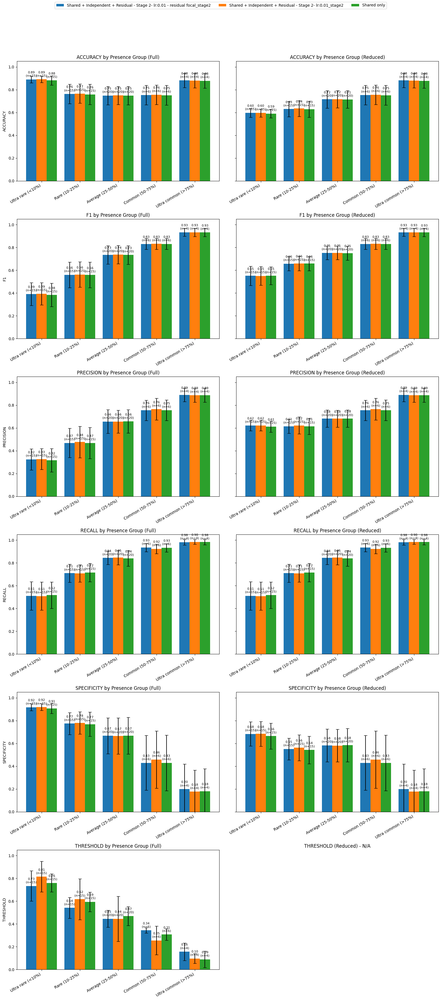

In [12]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

def build_combined_df(results, filtered_sorted_species):
    """
    Collect all per-species metrics into a single WIDE dataframe 
    with adjacent columns for Full and Reduced metrics.
    """
    presence_ratio_dict = dict(filtered_sorted_species)
    species_dfs = []

    n_items = len(results['final_val_metrics'])
    for i in range(n_items):
        model_name = results['config'][i].get('name', f"model_{i}")
        final_metrics = results['final_val_metrics'][i]

        df_full = None
        df_reduced = None

        # 1. Extract Full Metrics
        if 'per_species_metrics' in final_metrics:
            df_full = pd.DataFrame(final_metrics['per_species_metrics']).T
            df_full.index.name = 'species'
            df_full = df_full.reset_index()
            # --- RENAME columns to add _Full suffix ---
            df_full.columns = [f"{col}_Full" if col != 'species' else col for col in df_full.columns]
            
        # 2. Extract Reduced Metrics
        if 'per_species_reduced_metrics' in final_metrics:
            df_reduced = pd.DataFrame(final_metrics['per_species_reduced_metrics']).T
            df_reduced.index.name = 'species'
            df_reduced = df_reduced.reset_index()
            # --- RENAME columns to add _Reduced suffix ---
            df_reduced.columns = [f"{col}_Reduced" if col != 'species' else col for col in df_reduced.columns]
            
            # Drop the 'support' column if it exists, as it's not a metric
            if 'support_Reduced' in df_reduced.columns:
                df_reduced = df_reduced.drop(columns=['support_Reduced'])

        # --- 3. MERGE Full and Reduced DataFrames ---
        df_model = None
        if df_full is not None and df_reduced is not None:
            # Merge horizontally on the 'species' key
            df_model = pd.merge(df_full, df_reduced, on='species', how='outer')
        elif df_full is not None:
            df_model = df_full
        elif df_reduced is not None:
            df_model = df_reduced
        else:
            # No data for this model, skip
            continue
            
        df_model['model'] = model_name
        df_model['presence_ratio'] = df_model['species'].map(presence_ratio_dict)
        species_dfs.append(df_model)
            
    if not species_dfs:
        print("Warning: No per-species metrics found. Returning empty DataFrame.")
        return pd.DataFrame()

    combined = pd.concat(species_dfs, ignore_index=True)
    combined = combined.dropna(subset=['presence_ratio'])
    combined['presence_ratio'] = combined['presence_ratio'].astype(float)
    return combined

def add_presence_groups(df):
    labels = [
        "Ultra rare (<10%)", "Rare (10-25%)", 
        "Average (25-50%)", "Common (50-75%)", "Ultra common (>75%)"
    ]
    bins = [0.0, 0.1, 0.25, 0.5, 0.75, 1.0]
    df['presence_group'] = pd.cut(df['presence_ratio'], bins=bins, labels=labels, include_lowest=True)
    df['presence_group'] = pd.Categorical(df['presence_group'], categories=labels, ordered=True)
    return df, labels

def summarize_metrics(df, presence_labels):
    # --- MODIFIED: Find all columns that are not ID/grouping columns ---
    # This will now find 'f1_Full', 'f1_Reduced', 'recall_Full', etc.
    metrics = [c for c in df.columns if c not in [
        'species','model','presence_ratio','presence_group'
    ]]
    
    # The groupby is now simpler (no 'metric_type')
    agg = (df
           .groupby(['presence_group','model'])[metrics]
           .agg(['mean','std','count'])
           .reset_index())
    return agg, metrics

def plot_grouped_bars(agg, presence_labels, metrics):
    """
    Plots Full and Reduced metrics side-by-side for direct comparison,
    with one row per base metric.
    """
    
    # 1. Infer base metrics (e.g., 'f1', 'recall', 'precision')
    base_metrics = sorted(list(set([
        m.replace('_Full', '').replace('_Reduced', '') for m in metrics
    ])))
    n_metrics = len(base_metrics)
    
    if n_metrics == 0:
        print("No base metrics found to plot.")
        return

    # 2. Setup subplots: n_metrics rows, 2 columns (Full, Reduced)
    #    'sharey='row'' is key: it gives Full/Reduced the same Y-axis.
    fig, axes = plt.subplots(n_metrics, 2, figsize=(16, 6 * n_metrics), sharey='row')
    
    # Handle case of 1 metric (axes is not 2D, make it 2D)
    if n_metrics == 1:
        axes = axes.reshape(1, -1)

    handles, labels = None, None

    # 3. Loop through BASE metrics (e.g., 'f1', then 'recall')
    for row_idx, base_metric in enumerate(base_metrics):
        metric_full = f"{base_metric}_Full"
        metric_reduced = f"{base_metric}_Reduced"
        
        # --- Plot 1: FULL metrics (Left column) ---
        ax_full = axes[row_idx, 0]
        
        # Check if this metric exists in the aggregated dataframe
        if (metric_full, 'mean') in agg.columns:
            plot_df = pd.DataFrame({
                'presence_group': agg.reset_index()['presence_group'],
                'model': agg.reset_index()['model'],
                'mean': agg[(metric_full, 'mean')],
                'std': agg[(metric_full, 'std')],
                'count': agg[(metric_full, 'count')]
            })
            
            models = plot_df['model'].unique()
            x = np.arange(len(presence_labels))
            width = 0.8 / len(models)

            for i, model in enumerate(models):
                sub = plot_df[plot_df['model'] == model].set_index('presence_group').reindex(presence_labels)
                bars = ax_full.bar(x + i * width, sub['mean'], width, yerr=sub['std'],
                              capsize=4, label=model)
                for j, (m, c) in enumerate(zip(sub['mean'], sub['count'])):
                    if not np.isnan(m):
                        ax_full.text(x[j] + i * width, m + 0.02, f"{m:.2f}\n(n={int(c)})",
                                ha='center', va='bottom', fontsize=8)

            ax_full.set_xticks(x + (len(models)-1) * width / 2)
            ax_full.set_xticklabels(presence_labels, rotation=30, ha='right')
            ax_full.set_ylim(0, 1.05)
            ax_full.set_ylabel(base_metric.upper()) # Y-label only on the left
            ax_full.set_title(f"{base_metric.upper()} by Presence Group (Full)") 

            # Get legend handles just once
            if handles is None:
                handles, labels = ax_full.get_legend_handles_labels()
        else:
            # Handle if data is missing (e.g., only Reduced exists)
            ax_full.set_title(f"{base_metric.upper()} (Full) - N/A")
            ax_full.axis("off") 

        # --- Plot 2: REDUCED metrics (Right column) ---
        ax_reduced = axes[row_idx, 1]
        
        if (metric_reduced, 'mean') in agg.columns:
            plot_df = pd.DataFrame({
                'presence_group': agg.reset_index()['presence_group'],
                'model': agg.reset_index()['model'],
                'mean': agg[(metric_reduced, 'mean')],
                'std': agg[(metric_reduced, 'std')],
                'count': agg[(metric_reduced, 'count')]
            })
            
            models = plot_df['model'].unique()
            x = np.arange(len(presence_labels))
            width = 0.8 / len(models)

            for i, model in enumerate(models):
                sub = plot_df[plot_df['model'] == model].set_index('presence_group').reindex(presence_labels)
                bars = ax_reduced.bar(x + i * width, sub['mean'], width, yerr=sub['std'],
                              capsize=4, label=model)
                for j, (m, c) in enumerate(zip(sub['mean'], sub['count'])):
                    if not np.isnan(m):
                        ax_reduced.text(x[j] + i * width, m + 0.02, f"{m:.2f}\n(n={int(c)})",
                                ha='center', va='bottom', fontsize=8)

            ax_reduced.set_xticks(x + (len(models)-1) * width / 2)
            ax_reduced.set_xticklabels(presence_labels, rotation=30, ha='right')
            ax_reduced.set_title(f"{base_metric.upper()} by Presence Group (Reduced)") 

            if handles is None:
                handles, labels = ax_reduced.get_legend_handles_labels()
        else:
            ax_reduced.set_title(f"{base_metric.upper()} (Reduced) - N/A")
            ax_reduced.axis("off")

    # 4. Add one shared legend at the top
    if handles:
        fig.legend(handles, labels, loc="upper center", ncol=len(handles), fontsize=10)

    plt.tight_layout(rect=[0, 0, 1, 0.95]) # Make space for legend
    plt.show()
# # mix simple_mixture_results, simple_mixture_shared_results, simple_mixture_ind_results
mixed_results = {
    'final_val_metrics': shared_results['final_val_metrics'] +
                            # mixture_results_residual_stage2_1['final_val_metrics']+
                            #mixture_results_residual_stage2_2['final_val_metrics']+
                            mixture_results_residual_stage2_3['final_val_metrics']+
                            mixture_results_residual_stage2_4['final_val_metrics'],
                            #mixture_results_residual_stage2_5['final_val_metrics']+
                            #mixture_results_residual_stage2_6['final_val_metrics']+
                            # mixture_results_residual_stage2_7['final_val_metrics'],
    'config': shared_results['config'] +
                # mixture_results_residual_stage2_1['config']+
                #mixture_results_residual_stage2_2['config']+
                mixture_results_residual_stage2_3['config']+
                mixture_results_residual_stage2_4['config'],
                #mixture_results_residual_stage2_5['config']+
                #mixture_results_residual_stage2_6['config']+
                # mixture_results_residual_stage2_7['config'],
}


#combined = build_combined_df(mixture_results, filtered_sorted_species)
combined = build_combined_df(mixed_results, filtered_sorted_species)

#drop columns that contains 'support' in their name
combined = combined[[col for col in combined.columns if 'support' not in col]]

combined, presence_labels = add_presence_groups(combined)
agg, metrics = summarize_metrics(combined, presence_labels)

print("Metrics found:", metrics)

plot_grouped_bars(agg, presence_labels, metrics)


In [34]:
def find_anchor_species(results_df, species_names_list, model_name='Shared only', top_k=5, min_f1=0.85):
    """
    Identifies the best 'Anchor' species from the results DataFrame.
    """
    # 1. Filter for the Shared Model results only
    df = results_df[results_df['model'] == model_name].copy()
    
    # 2. Calculate Anchor Score
    # We value F1 highly, but we weight it by how often the species appears.
    # Score = F1^2 * Prevalence (Squaring F1 prioritizes reliability over pure frequency)
    df['anchor_score'] = (df['f1_Full'] ** 2) * df['presence_ratio']
    
    # 3. Filter candidates
    # Must be reliable (F1 > threshold)
    candidates = df[df['f1_Full'] >= min_f1].sort_values('anchor_score', ascending=False)
    
    # 4. Select Top K
    top_anchors = candidates.head(top_k)
    
    print(f"--- Top {top_k} Anchor Candidates (from '{model_name}') ---")
    print(f"{'Index':<6} | {'Species':<10} | {'F1':<6} | {'Prev':<6} | {'Score':<6}")
    print("-" * 50)
    
    anchor_indices = []
    
    # Map names back to integer indices
    # (Assumes species_names_list is the exact list used by the model)
    name_to_idx = {name: i for i, name in enumerate(species_names_list)}
    
    for _, row in top_anchors.iterrows():
        sp_name = row['species']
        if sp_name in name_to_idx:
            idx = name_to_idx[sp_name]
            anchor_indices.append(idx)
            print(f"{idx:<6} | {sp_name:<10} | {row['f1_Full']:.3f} | {row['presence_ratio']:.3f} | {row['anchor_score']:.3f}")
        else:
            print(f"WARNING: Species '{sp_name}' not found in species_names_list!")
            
    return anchor_indices

# --- USAGE ---
# Ensure 'combined' is your dataframe containing results for all models, including 'Shared only'
anchor_indices = find_anchor_species(
    combined, 
    species_names, 
    model_name='Shared only',  # Make sure this matches your baseline string exactly
    top_k=20
)

print("\nCopy-Paste these indices into your model config:")
print(f"anchor_indices = {anchor_indices}")

--- Top 20 Anchor Candidates (from 'Shared only') ---
Index  | Species    | F1     | Prev   | Score 
--------------------------------------------------
0      | RES_S      | 0.985 | 0.972 | 0.943
1      | SAB        | 0.930 | 0.811 | 0.702
3      | PLS        | 0.909 | 0.793 | 0.655
2      | DIS        | 0.907 | 0.796 | 0.655
4      | CON        | 0.864 | 0.661 | 0.494
5      | BOP        | 0.850 | 0.657 | 0.475
8      | EPN        | 0.878 | 0.581 | 0.448
15     | FEU_S      | 0.907 | 0.445 | 0.366

Copy-Paste these indices into your model config:
anchor_indices = [0, 1, 3, 2, 4, 5, 8, 15]


In [38]:
#sort by f1_Full for the 'Shared only' model
combined_sorted = combined.sort_values(by='f1_Full', ascending=False)
print(combined_sorted[combined_sorted['model']=='Shared only'][['species', 'f1_Full', 'presence_ratio']].head(20))

   species   f1_Full  presence_ratio
47   RES_S  0.985247        0.971656
50     SAB  0.930415        0.811378
41     PLS  0.909091        0.792981
18     DIS  0.907426        0.795528
28   FEU_S  0.906549        0.445415
23     EPN  0.878181        0.580988
16     CON  0.864412        0.661451
6      BOP  0.850064        0.656841
9      CLB  0.844573        0.625061
34     MAC  0.829994        0.599911
27     ERS  0.823214        0.227115
26     ERR  0.813839        0.352256
21     DRS  0.802131        0.483503
24     ERE  0.797237        0.430535
8    CLA_S  0.796868        0.489245
1      ARN  0.795146        0.478975
31     LEG  0.793591        0.352620
12     CLS  0.785510        0.431951
58     TRB  0.771263        0.487142
59     VAA  0.757848        0.420548


In [42]:
# compute mean/std/count only on numeric columns to avoid errors from object-typed columns
numeric_cols = combined.select_dtypes(include=['number']).columns

# Group by model and presence_group
group_mean = combined.groupby(['model','presence_group'])[numeric_cols].mean()
group_std = combined.groupby(['model','presence_group'])[numeric_cols].std()
group_count = combined.groupby(['model','presence_group'])[numeric_cols].count()

# Merge into one dataframe for easier inspection
combined_grouped_model_stats = pd.concat(
    [group_mean],
    axis=1
).reset_index()

pd.set_option('display.max_colwidth', None)
display(combined_grouped_model_stats)

/tmp/ipykernel_3946168/174816911.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  group_mean = combined.groupby(['model','presence_group'])[numeric_cols].mean()
/tmp/ipykernel_3946168/174816911.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  group_std = combined.groupby(['model','presence_group'])[numeric_cols].std()
/tmp/ipykernel_3946168/174816911.py:7: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  group_count =

,model,presence_group,precision_Full,recall_Full,f1_Full,accuracy_Full,specificity_Full,threshold_Full,precision_Reduced,recall_Reduced,f1_Reduced,accuracy_Reduced,specificity_Reduced,presence_ratio
0,Shared + Independent + Residual - Stage 2- lr:0.01 + anchor species_stage2,Ultra rare (<10%),0.327395,0.514551,0.393205,0.888144,0.914872,0.596020,0.617537,0.514551,0.551138,0.593545,0.672538,0.069152
1,Shared + Independent + Residual - Stage 2- lr:0.01 + anchor species_stage2,Rare (10-25%),0.499060,0.642349,0.522957,0.772040,0.800686,0.546525,0.641100,0.642349,0.613435,0.627371,0.612392,0.191029
2,Shared + Independent + Residual - Stage 2- lr:0.01 + anchor species_stage2,Average (25-50%),0.660777,0.854846,0.742140,0.754661,0.670313,0.363889,0.686743,0.854846,0.759445,0.722909,0.585201,0.401884
3,Shared + Independent + Residual - Stage 2- lr:0.01 + anchor species_stage2,Common (50-75%),0.761514,0.933781,0.835190,0.760228,0.450643,0.140337,0.761514,0.933781,0.835190,0.760228,0.450643,0.609898
4,Shared + Independent + Residual - Stage 2- lr:0.01 + anchor species_stage2,Ultra common (>75%),0.896870,0.974126,0.933063,0.882517,0.238814,0.227778,0.896870,0.974126,0.933063,0.882517,0.238814,0.842886
5,Shared + Independent + Residual - Stage 2- lr:0.01 + fourrier coords + anchor species_stage2,Ultra rare (<10%),0.335860,0.513612,0.399210,0.890215,0.917572,0.762983,0.622697,0.513612,0.554655,0.597688,0.681763,0.069152
6,Shared + Independent + Residual - Stage 2- lr:0.01 + fourrier coords + anchor species_stage2,Rare (10-25%),0.470456,0.692635,0.553006,0.766227,0.783304,0.471953,0.620098,0.692635,0.651101,0.631678,0.570720,0.191029
7,Shared + Independent + Residual - Stage 2- lr:0.01 + fourrier coords + anchor species_stage2,Average (25-50%),0.659112,0.859309,0.742259,0.753242,0.665929,0.356960,0.684825,0.859309,0.759863,0.721898,0.578668,0.401884
8,Shared + Independent + Residual - Stage 2- lr:0.01 + fourrier coords + anchor species_stage2,Common (50-75%),0.764329,0.931610,0.835998,0.762203,0.462538,0.151886,0.764329,0.931610,0.835998,0.762203,0.462538,0.609898
9,Shared + Independent + Residual - Stage 2- lr:0.01 + fourrier coords + anchor species_stage2,Ultra common (>75%),0.898222,0.970539,0.931924,0.880058,0.309868,0.047121,0.898222,0.970539,0.931924,0.880058,0.309868,0.842886


In [ ]:
def find_optimal_thresholds_per_species(model, val_loader, device):
    model.eval()
    all_preds, all_labels = [], []
    
    # Gather raw logits
    with torch.no_grad():
        for batch in tqdm(val_loader, desc="Gathering Logits"):
            inputs, labels = batch[0], batch[1]
            coords = batch[3] if len(batch) == 4 else None
            inputs = [x.to(device) for x in inputs] if isinstance(inputs, list) else [inputs.to(device)]
            if coords: coords = coords.to(device).float()
            
            outputs = model(inputs, coords)
            all_preds.append(outputs[0].cpu()) # Final Logits
            all_labels.append(labels.cpu())
            
    all_preds = torch.cat(all_preds)
    all_labels = torch.cat(all_labels)
    
    num_species = all_preds.shape[1]
    best_thresholds = []
    best_f1s = []
    
    # Grid search for best threshold per species
    threshold_range = torch.arange(0.1, 0.95, 0.05)
    
    print("\n--- Optimizing Thresholds ---")
    for i in range(num_species):
        y_true = all_labels[:, i].numpy()
        y_logits = all_preds[:, i].numpy()
        
        best_f1 = 0.0
        best_thresh = 0.5
        
        for t in threshold_range:
            y_pred = (torch.sigmoid(torch.tensor(y_logits)) > t).numpy()
            score = f1_score(y_true, y_pred, zero_division=0)
            if score > best_f1:
                best_f1 = score
                best_thresh = t.item()
                
        best_thresholds.append(best_thresh)
        best_f1s.append(best_f1)
    
    return np.array(best_thresholds), np.array(best_f1s)

# RUN IT
from torch.utils.data import DataLoader
import numpy as np
import tqdm
val_loader = DataLoader(val_dataset, batch_size=128, shuffle=False)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
thresholds, optimized_f1s = find_optimal_thresholds_per_species(model_mixture_residual_stage2, val_loader, device)

# Compare Q4 (Rare) Performance
# (Assuming you have indices for Q4 species)
# avg_rare_f1 = np.mean(optimized_f1s[Q4_INDICES])
# print(f"Optimized Rare F1: {avg_rare_f1}")

TypeError: 'module' object is not callable

In [38]:
def debug_specialist_gradients(model, learning_rate=0.001, threshold=1e-5):
    print("\n--- SPECIALIST GRADIENT DIAGNOSTIC ---")
    total_norm = 0.0
    nonzero_gradients = 0
    param_count = 0
    
    # Only look at species_heads_mlps (since shared is likely frozen)
    for name, param in model.species_heads_mlps.named_parameters():
        if param.grad is not None:
            grad_norm = param.grad.norm().item()
            weight_norm = param.data.norm().item()
            total_norm += grad_norm
            nonzero_gradients += 1
            param_count += 1
            
            # Check the Update Ratio (How much will this weight change?)
            # Update ≈ lr * grad
            update_magnitude = learning_rate * grad_norm
            ratio = update_magnitude / (weight_norm + 1e-8)
            
            # Print only if it looks suspicious (Too small or Too big)
            #if "0.0.weight" in name or "2.weight" in name: # Look at first and last layers
            layer_type = "Output" if "2.weight" in name else "Input"
            print(f"[{layer_type} Layer] {name}:")
            print(f"   -> Grad Norm: {grad_norm:.6f}")
            print(f"   -> Weight Norm: {weight_norm:.6f}")
            print(f"   -> Update Ratio: {ratio:.6%}") # Should be ~0.1% to 1.0% usually
            
            if grad_norm < threshold:
                print(f"   [WARNING] Gradient is effectively ZERO (Vanishing Gradient).")
    
    if nonzero_gradients == 0:
        print("[CRITICAL] No gradients found in Specialist Heads! Check requires_grad=True.")
    else:
        print(f"Avg Gradient Norm across heads: {total_norm / param_count:.6f}")
    print("--------------------------------------\n")
    
debug_specialist_gradients(model_mixture_residual_stage2_loss_masking)

NameError: name 'model_mixture_residual_stage2_loss_masking' is not defined

/tmp/ipykernel_771109/166292770.py:41: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  ax = sns.barplot(


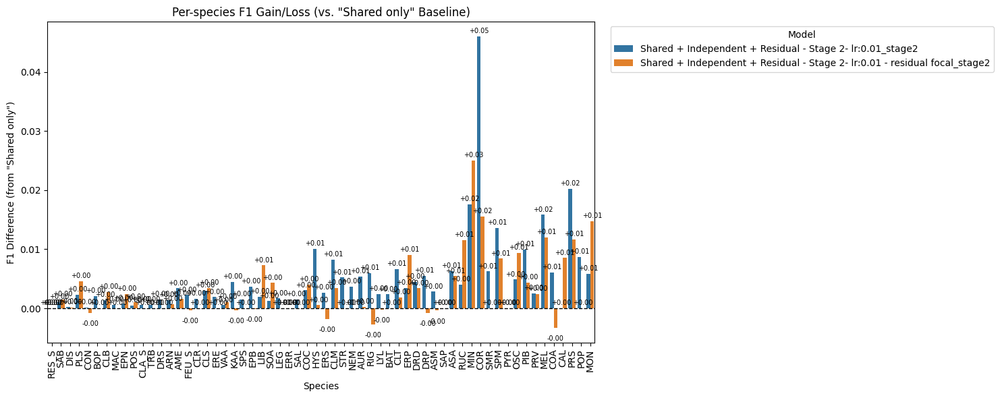

In [13]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# --- 1. Data Preparation ---

# Define the baseline model name (your 'Shared only' model)
BASELINE_MODEL = 'Shared only' 
metric = 'f1_Full'  # Metric to compare
# Isolate the baseline F1 scores (one F1 score per species)
baseline_scores = combined[combined['model'] == BASELINE_MODEL][['species', metric]]
baseline_scores = baseline_scores.rename(columns={metric: 'f1_baseline'})

# Merge the baseline score back onto every row, matching by species
plot_df = combined.merge(baseline_scores, on='species', how='left')

# Calculate the F1 difference
plot_df['f1_difference'] = plot_df[metric] - plot_df['f1_baseline']

# Filter out the baseline model itself, as its difference is always 0
plot_df = plot_df[plot_df['model'] != BASELINE_MODEL]

# --- 2. Plotting ---

# Choose species order (prefer selected species_names if available)
if 'species_names' in globals():
    species_order = [s for s in species_names if s in plot_df['species'].unique()]
else:
    species_order = list(plot_df['species'].unique())

# Get model order (now excluding the baseline)
models = plot_df['model'].unique().tolist()

# Autosize figure based on number of species
fig_w = max(12, int(len(species_order) * 0.25))
fig_h = 6
plt.figure(figsize=(fig_w, fig_h))

# Create the barplot using the new 'f1_difference' column
ax = sns.barplot(
    data=plot_df,
    x='species',
    y='f1_difference', # <-- Key change: Plot the difference
    hue='model',
    order=species_order,
    hue_order=models,
    ci=None,
    estimator=np.mean,
    dodge=True,
    palette='tab10'
)

# --- 3. Formatting ---

# Add a horizontal line at y=0 to represent the baseline
ax.axhline(0, color='black', linestyle='--', linewidth=1.0)

ax.set_xlabel('Species')
ax.set_ylabel('F1 Difference (from "Shared only")') # <-- New label
ax.set_title('Per-species F1 Gain/Loss (vs. "Shared only" Baseline)') # <-- New title
plt.xticks(rotation=90)

# Annotate bars with their value (mean f1 difference)
for p in ax.patches:
    height = p.get_height()
    if np.isnan(height):
        continue
    
    # Adjust annotation position for positive (above) and negative (below) bars
    va_align = 'bottom' if height >= 0 else 'top'
    text_offset = (0, 2) if height >= 0 else (0, -8)

    ax.annotate(f"{height:+.2f}", # <-- Format to include sign (+/-)
                (p.get_x() + p.get_width() / 2., height),
                ha='center', 
                va=va_align, 
                fontsize=7, 
                rotation=0, 
                xytext=text_offset,
                textcoords='offset points')

# Move legend outside to keep plot area clean
plt.legend(title='Model', bbox_to_anchor=(1.02, 1), loc='upper left')
plt.tight_layout()
plt.show()

In [14]:
def compute_species_improvements_sorted(df, baseline_model='Shared only'):
    """
    Computes per-species F1 improvement AND degradation over a baseline model.
    """
    # 1. Isolate baseline F1 per species
    baseline_scores = (
        df[df['model'] == baseline_model][['species', 'f1_Full']]
        .rename(columns={'f1_Full': 'f1_baseline'})
    )

    # 2. Merge baseline back to all other models
    merged_df = df.merge(baseline_scores, on='species', how='left')

    # 3. Compute F1 difference
    merged_df['f1_difference'] = merged_df['f1_Full'] - merged_df['f1_baseline']

    # 4. Flag improvements and degradations
    # We use a small epsilon to avoid counting floating point noise as change
    epsilon = 1e-6
    merged_df['improved'] = merged_df['f1_difference'] > epsilon
    merged_df['degraded'] = merged_df['f1_difference'] < -epsilon

    # 5. Filter out baseline model itself
    improvements_df = merged_df[merged_df['model'] != baseline_model].copy()

    # 6. Sort by F1 improvement descending
    improvements_df = improvements_df.sort_values(
        by='f1_difference', ascending=False
    ).reset_index(drop=True)

    # 7. Count species that improved in *any* model
    num_improved = improvements_df.groupby('species')['improved'].any().sum()

    # --- 8. Per-model improvement/loss summary ---
    # We aggregate both flags
    per_model_summary = improvements_df.groupby('model').agg(
    num_species_improved=('improved', 'sum'),
    num_species_degraded=('degraded', 'sum'),
    num_species_evaluated=('species', 'count'),
    mean_f1_gain=('f1_difference', 'mean')
    )

    per_model_summary['pct_improved'] = (
        per_model_summary['num_species_improved'] /
        per_model_summary['num_species_evaluated']
    ) * 100

    per_model_summary['pct_degraded'] = (
        per_model_summary['num_species_degraded'] /
        per_model_summary['num_species_evaluated']
    ) * 100

    # NEW: maximum per-species gain per model
    per_model_summary['max_f1_gain'] = (
        improvements_df.groupby('model')['f1_difference'].max()
    )

    return improvements_df, num_improved, per_model_summary

improvements_df, num_improved_species, per_model_summary = (
    compute_species_improvements_sorted(combined, baseline_model='Shared only')
)

print(f"Total species improved over baseline in ANY model: {num_improved_species}")

print("\nTop 20 species improvements:")
print(improvements_df[['species', 'model', 'f1_difference', 'improved']].head(20))

print("\n--- Per Model Summary ---")
print(per_model_summary)


Total species improved over baseline in ANY model: 56

Top 20 species improvements:
   species                                              model  f1_difference  \
0      COR  Shared + Independent + Residual - Stage 2- lr:...       0.046024   
1      MIN  Shared + Independent + Residual - Stage 2- lr:...       0.025004   
2      PRS  Shared + Independent + Residual - Stage 2- lr:...       0.020206   
3      MIN  Shared + Independent + Residual - Stage 2- lr:...       0.017611   
4      MEL  Shared + Independent + Residual - Stage 2- lr:...       0.015822   
5      COR  Shared + Independent + Residual - Stage 2- lr:...       0.015585   
6      MON  Shared + Independent + Residual - Stage 2- lr:...       0.014712   
7      SPM  Shared + Independent + Residual - Stage 2- lr:...       0.013623   
8      MEL  Shared + Independent + Residual - Stage 2- lr:...       0.011973   
9      PRS  Shared + Independent + Residual - Stage 2- lr:...       0.011690   
10     RUC  Shared + Independent + R

In [15]:
per_model_summary

,num_species_improved,num_species_degraded,num_species_evaluated,mean_f1_gain,pct_improved,pct_degraded,max_f1_gain
model,,,,,,,
Shared + Independent + Residual - Stage 2- lr:0.01 - residual focal_stage2,31,10,60,0.002856,51.666667,16.666667,0.025004
Shared + Independent + Residual - Stage 2- lr:0.01_stage2,55,0,60,0.004688,91.666667,0.000000,0.046024


In [11]:
# Look at the degraded species specifically
degraded_df = improvements_df[improvements_df['f1_difference'] < 0].sort_values('f1_difference')

print("--- Worst Degradations ---")
print(degraded_df[['species', 'model', 'f1_difference']].head(10))

--- Worst Degradations ---
    species                                              model  f1_difference
179     STR  Shared + Independent + Residual - Stage 2- lr:...      -0.011105
178     RUC  Shared + Independent + Residual - Stage 2- lr:...      -0.008242
177     CAL  Shared + Independent + Residual - Stage 2- lr:...      -0.007679
176     POP  Shared + Independent + Residual - Stage 2- lr:...      -0.006391
175     SPM  Shared + Independent + Residual - Stage 2- lr:...      -0.005025
174     SPM  Shared + Independent + Residual - Stage 2- lr:...      -0.005017
173     PRV  Shared + Independent + Residual - Stage 2- lr:...      -0.004049
172     SPS  Shared + Independent + Residual - Stage 2- lr:...      -0.003146
171     CLR  Shared + Independent + Residual - Stage 2- lr:...      -0.002789
170     POP  Shared + Independent + Residual - Stage 2- lr:...      -0.002662


### Investigating species interaction intra-model

  0%|                                                                                                     | 0/18 [00:00<?, ?it/s]

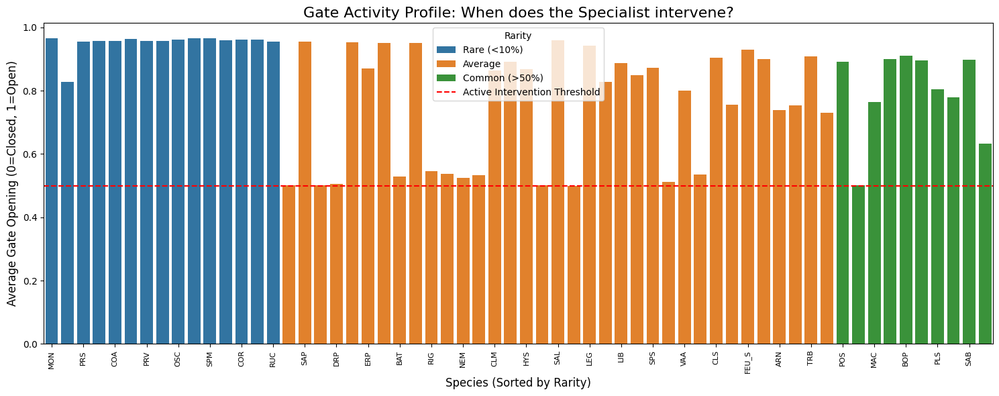

--- Top 5 Most 'Active' Specialists (Gate Open) ---
   Species  Gate_Value  Prevalence
59     MON    0.965271    0.060327
50     PYR    0.965163    0.070516
49     SPM    0.964549    0.072618
54     MEL    0.963506    0.067120
51     OSC    0.962104    0.069950

--- Top 5 Most 'Passive' Specialists (Gate Closed) ---
   Species  Gate_Value  Prevalence
26     ERR    0.500014    0.352256
44     ASA    0.500442    0.162947
8      EPN    0.500739    0.580988
28     COC    0.500931    0.311095
42     ASM    0.501498    0.171640


In [17]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm

def analyze_gate_behavior(model, dataloader, species_names, species_prevalences, device):
    model.eval()
    
    # Store all gate values: List of lists [Num_Species] -> [All_Batch_Values]
    all_gates = [[] for _ in range(model.num_species)]
    
    print("Collecting gate activations...")
    
    with torch.no_grad():
        for batch in tqdm(dataloader, leave=False):
            # --- Standard Unpacking (Matches your logic) ---
            inputs, labels = batch[0], batch[1]
            coords = batch[3] if len(batch) == 4 else None
            
            # Move to device
            if isinstance(inputs, (list, tuple)):
                inputs = [x.to(device) for x in inputs]
            else:
                inputs = [inputs.to(device)]
            if coords is not None:
                coords = coords.to(device).float()
                
            # Forward pass
            _, _, _, _, debug_info = model(inputs, coordinates=coords)
            
            # debug_info["independent_head_gates"] is a list of tensors [Batch_Size, 1]
            # One item per species
            batch_gates = debug_info["independent_head_gates"]
            
            for i, gate_tensor in enumerate(batch_gates):
                # gate_tensor shape: (B, 1) -> flatten to (B,)
                all_gates[i].extend(gate_tensor.cpu().numpy().flatten())

    # Calculate Mean Gate Value per Species
    mean_gate_values = np.array([np.mean(g) for g in all_gates])
    
    return mean_gate_values

def plot_gate_profile(mean_gates, species_names, species_prevalences):
    """
    Plots the average gate opening sorted by species rarity.
    """
    # 1. Organize Data
    data = []
    for name, prev, gate in zip(species_names, species_prevalences, mean_gates):
        data.append({
            "Species": name,
            "Prevalence": prev,
            "Gate_Value": gate,
            "Rarity_Group": "Rare (<10%)" if prev < 0.1 else "Common (>50%)" if prev > 0.5 else "Average"
        })
    
    # 2. Sort by Prevalence (Rarest on the Left)
    df = pd.DataFrame(data)
    df = df.sort_values("Prevalence")
    
    # 3. Plot
    plt.figure(figsize=(15, 6))
    
    # Bar plot of Gate Values
    sns.barplot(data=df, x="Species", y="Gate_Value", hue="Rarity_Group", dodge=False)
    
    plt.title("Gate Activity Profile: When does the Specialist intervene?", fontsize=16)
    plt.ylabel("Average Gate Opening (0=Closed, 1=Open)", fontsize=12)
    plt.xlabel("Species (Sorted by Rarity)", fontsize=12)
    
    # Add threshold line
    plt.axhline(0.5, color='red', linestyle='--', label="Active Intervention Threshold")
    
    # Clean up X-axis labels if too many species
    if len(df) > 20:
        plt.xticks(rotation=90, fontsize=8)
        # Only show every Nth label if massive
        locs, labels = plt.xticks()
        plt.xticks(locs[::2], [l.get_text() for l in labels[::2]])
    else:
        plt.xticks(rotation=45)
        
    plt.legend(title="Rarity")
    plt.tight_layout()
    plt.show()
    
    # 4. Print Highlights
    print("--- Top 5 Most 'Active' Specialists (Gate Open) ---")
    print(df.sort_values("Gate_Value", ascending=False).head(5)[["Species", "Gate_Value", "Prevalence"]])
    
    print("\n--- Top 5 Most 'Passive' Specialists (Gate Closed) ---")
    print(df.sort_values("Gate_Value", ascending=True).head(5)[["Species", "Gate_Value", "Prevalence"]])

# --- RUN IT ---
from torch.utils.data import DataLoader

val_loader = DataLoader(val_dataset, batch_size=256, shuffle=False)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
mean_gates = analyze_gate_behavior(model_mixture_residual_stage2_v2_extra_features, val_loader, species_names, species_prevalences, device)
plot_gate_profile(mean_gates, species_names, species_prevalences)

In [107]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import torch

def collect_logit_diagnostics(model, dataloader, device, num_batches=20):
    """
    Runs a partial evaluation to collect raw logits from both heads.
    Uses the user's specific batch unpacking logic.
    """
    model.eval()
    
    all_shared = []
    all_specific = []
    all_targets = []
    
    print(f"Collecting logits from {num_batches} batches...")
    
    with torch.no_grad():
        for i, batch in enumerate(dataloader):
            if i >= num_batches: break
            
            # --- YOUR EXACT UNPACKING LOGIC ---
            # 1. Standard Unpack
            inputs = batch[0]
            labels = batch[1]
            coords = None
            
            # 2. Check length for Coords
            if len(batch) == 3:
                # (inputs, labels, indices) -> No coords
                pass 
            elif len(batch) == 4:
                # (inputs, labels, indices, coords)
                coords = batch[3]
            else:
                # Fallback for safety
                print(f"Warning: Batch length {len(batch)} unexpected. Skipping.")
                continue

            # --- Move to device ---
            if isinstance(inputs, (list, tuple)):
                inputs = [x.to(device) for x in inputs]
            else:
                inputs = [inputs.to(device)]
                
            labels = labels.to(device).float()
            
            if coords is not None:
                coords = coords.to(device).float()
            
            # --- Forward pass ---
            # We don't need alpha or indices for this diagnostic
            try:
                # The model returns: final, shared, specific, latent, debug
                outputs = model(inputs, coordinates=coords)
                shared_logits = outputs[1]
                specific_logits = outputs[2]
                
                all_shared.append(shared_logits.cpu().numpy())
                all_specific.append(specific_logits.cpu().numpy())
                all_targets.append(labels.cpu().numpy())
                
            except RuntimeError as e:
                print(f"[CRITICAL ERROR] Model Forward Pass Failed.")
                print(f"Input shapes: {[x.shape for x in inputs]}")
                if coords is not None: print(f"Coords shape: {coords.shape}")
                raise e
            
    # Concatenate
    shared_np = np.concatenate(all_shared, axis=0)     # (N_samples, N_species)
    specific_np = np.concatenate(all_specific, axis=0) # (N_samples, N_species)
    targets_np = np.concatenate(all_targets, axis=0)   # (N_samples, N_species)
    
    return shared_np, specific_np, targets_np

def plot_head_interaction(shared_logits, specific_logits, targets, species_indices, species_names):
    """
    Plots interaction charts for selected species.
    """
    sns.set_style("whitegrid")
    
    for idx, name in zip(species_indices, species_names):
        # Extract data for this specific species
        sh = shared_logits[:, idx]
        sp = specific_logits[:, idx]
        tg = targets[:, idx]
        
        # Filter for presence (Positive samples) and absence (Negative samples)
        pos_mask = (tg == 1)
        neg_mask = (tg == 0)
        
        fig, axes = plt.subplots(1, 2, figsize=(16, 6))
        fig.suptitle(f"Head Analysis: {name}", fontsize=16, fontweight='bold')
        
        # --- PLOT 1: SCATTER (Interaction) ---
        # X-axis: Shared Model Confidence
        # Y-axis: Specialist Correction
        if neg_mask.sum() > 0:
            sns.scatterplot(x=sh[neg_mask], y=sp[neg_mask], ax=axes[0], color='blue', alpha=0.1, label='Absence', s=10)
        if pos_mask.sum() > 0:
            sns.scatterplot(x=sh[pos_mask], y=sp[pos_mask], ax=axes[0], color='red', alpha=0.6, label='Presence', s=30)
        
        axes[0].set_xlabel("Shared Logit (Base Prediction)")
        axes[0].set_ylabel("Specialist Logit (Correction)")
        axes[0].axhline(0, color='black', linestyle='--') # Zero correction line
        axes[0].axvline(0, color='black', linestyle='--') # 50% prob line
        axes[0].legend()
        axes[0].set_title("Correlation: Does Specialist fix the Shared mistakes?")
        
        # --- PLOT 2: DISTRIBUTION ---
        sns.histplot(sp, ax=axes[1], kde=True, color='purple')
        axes[1].set_xlabel("Specialist Logit Value")
        axes[1].set_title("Activity Level: Is the Specialist doing anything?")
        axes[1].axvline(0, color='black', linestyle='--')
        
        plt.tight_layout()
        plt.show()

        # --- STATS ---
        avg_correction_on_pos = sp[pos_mask].mean() if pos_mask.sum() > 0 else 0
        avg_sh_on_pos = sh[pos_mask].mean() if pos_mask.sum() > 0 else 0
        print(f"--- Stats for {name} ---")
        print(f"Avg Shared Logit on Presence: {avg_sh_on_pos:.4f} (Should be positive)")
        print(f"Avg Specialist Correction on Presence: {avg_correction_on_pos:.4f}")
        print("-" * 30)

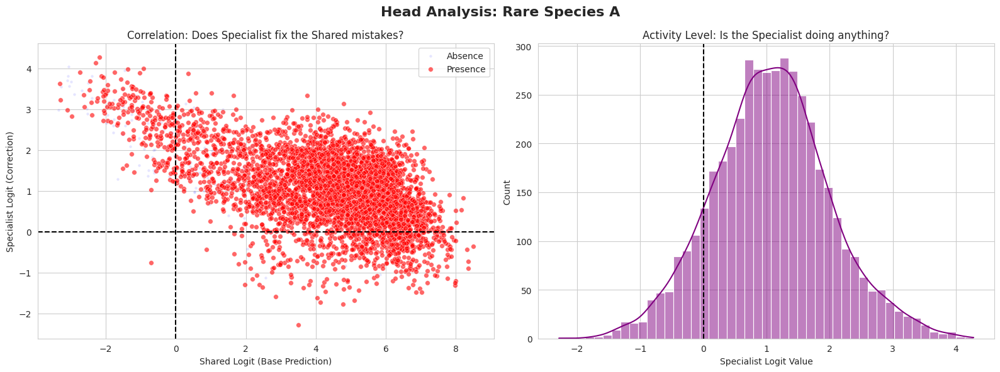

--- Stats for Rare Species A ---
Avg Shared Logit on Presence: 4.3336 (Should be positive)
Avg Specialist Correction on Presence: 1.0472
------------------------------


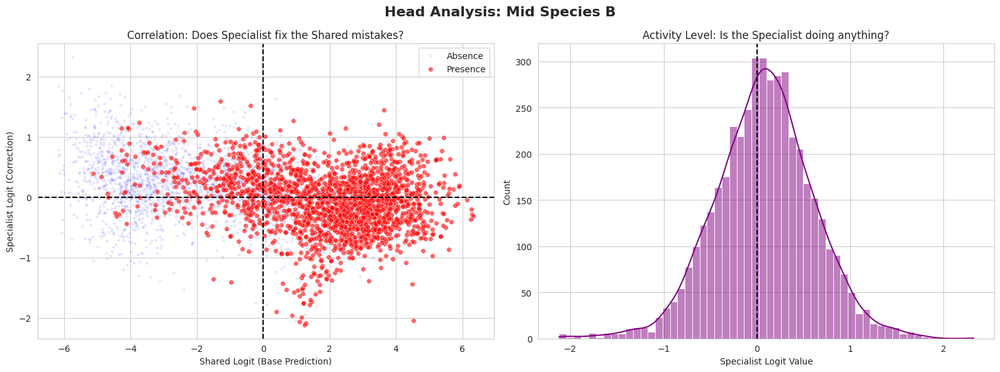

--- Stats for Mid Species B ---
Avg Shared Logit on Presence: 1.8836 (Should be positive)
Avg Specialist Correction on Presence: -0.0561
------------------------------


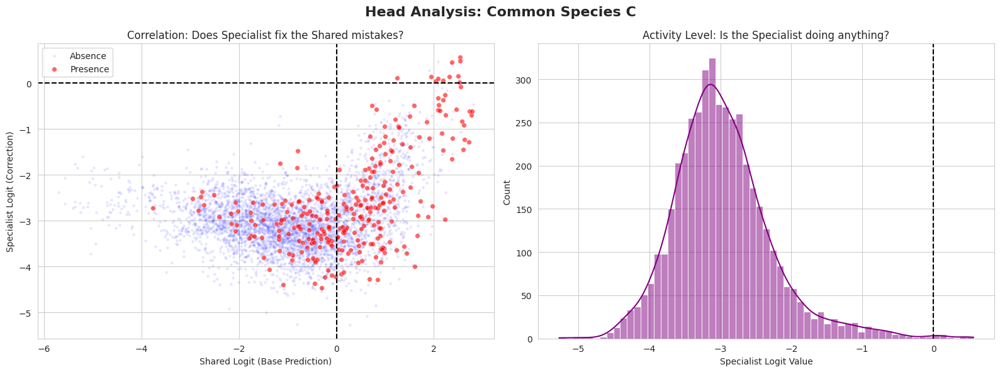

--- Stats for Common Species C ---
Avg Shared Logit on Presence: 0.2940 (Should be positive)
Avg Specialist Correction on Presence: -2.5719
------------------------------


In [113]:
val_loader = DataLoader(val_dataset, batch_size=256, shuffle=False)
shared_data, specific_data, target_data = collect_logit_diagnostics(
    model_mixture_residual_stage2_v2_extra_features, val_loader, device=device, num_batches=50
)

# 2. Visualize a few species
# 0 = Rare, 10 = Average, 50 = Common (Adjust indices as needed)
species_to_inspect = [0, 10, 50] 
species_names_debug = ["Rare Species A", "Mid Species B", "Common Species C"]

plot_head_interaction(
    shared_data, 
    specific_data, 
    target_data, 
    species_to_inspect, 
    species_names_debug
)

--- Generating Plots ---


/home/alexisb1/species-dist/ENV/lib/python3.11/site-packages/seaborn/matrix.py:202: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(calc_data)
/home/alexisb1/species-dist/ENV/lib/python3.11/site-packages/seaborn/matrix.py:207: RuntimeWarning: All-NaN slice encountered
  vmax = np.nanmax(calc_data)


Saved plot to Species-Specific_Modality_Gates.png


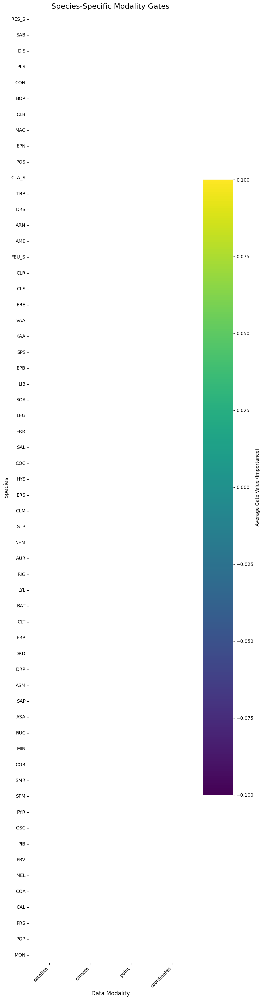

AttributeError: 'NoneType' object has no attribute 'numpy'

<Figure size 1000x500 with 0 Axes>

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import torch
import sys

# --- MODIFIED Visualization Functions ---
# These now accept the processed data, not the live model/debug_info

def visualize_species_gates_from_file(gate_matrix_tensor, species_names, feature_names, title):
    """
    Visualizes the average gate weights from a saved matrix.
    """
    # 1. Convert to Pandas DataFrame
    df_gates = pd.DataFrame(
        gate_matrix_tensor.numpy(),
        index=species_names,
        columns=feature_names
    )
    
    # 2. Plot
    plt.figure(figsize=(max(8, len(feature_names) * 1.5), max(8, len(species_names) * 0.5)))
    sns.heatmap(
        df_gates, 
        annot=True, 
        fmt=".2f", 
        cmap="viridis",
        linewidths=.5,
        cbar_kws={'label': 'Average Gate Value (Importance)'}
    )
    plt.title(title, fontsize=16)
    plt.xlabel("Data Modality", fontsize=12)
    plt.ylabel("Species", fontsize=12)
    plt.xticks(rotation=45, ha="right")
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.savefig(title.replace(" ", "_") + ".png")
    print(f"Saved plot to {title.replace(' ', '_') + '.png'}")
    plt.show()

def visualize_interaction_matrix_from_file(matrix_tensor, species_names, title):
    """
    Visualizes the (S, S) weight matrix from a saved tensor.
    """
    # 1. Convert to Pandas DataFrame
    df_matrix = pd.DataFrame(
        matrix_tensor.numpy(),
        index=species_names,    # Rows = Output Species
        columns=species_names   # Cols = Input Species
    )
    
    # 2. Plot
    plt.figure(figsize=(max(10, len(species_names) * 0.6), max(10, len(species_names) * 0.6)))
    sns.heatmap(
        df_matrix, 
        annot=True, 
        fmt=".2f", 
        cmap="coolwarm",
        center=0,
        linewidths=.5,
        cbar_kws={'label': 'Interaction Weight'}
    )
    plt.title(title, fontsize=16)
    plt.xlabel("Input Species (Influence on others)", fontsize=12)
    plt.ylabel("Output Species (Influenced by others)", fontsize=12)
    plt.xticks(rotation=90)
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.savefig(title.replace(" ", "_") + ".png")
    print(f"Saved plot to {title.replace(' ', '_') + '.png'}")
    plt.show()



# Check if a filename is provided as an argument
FILE_PATH = "./best_model_debug_data.pt"
data = torch.load(FILE_PATH)

# Unpack the data
avg_shared_gates = data["avg_shared_gates"]
avg_independent_gates = data["avg_independent_gates"]
interaction_matrix = data["interaction_matrix"]
species_names = data["species_names"]
feature_names = data["feature_names"]

print("--- Generating Plots ---")

# Plot 1: Independent Species Gates
visualize_species_gates_from_file(
    avg_independent_gates,
    species_names,
    feature_names,
    title="Species-Specific Modality Gates"
)

# Plot 2: Shared Head Gates (a bit different, it's 1D)
# We can plot this as a simple bar chart
plt.figure(figsize=(10, 5))
s_gates_df = pd.Series(avg_shared_gates.numpy(), index=feature_names)
s_gates_df.plot(kind='bar', color='skyblue')
plt.title("Shared Head - Average Modality Gates", fontsize=16)
plt.ylabel("Average Gate Value (Importance)")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.savefig("Shared_Head_Gates.png")
print("Saved plot to Shared_Head_Gates.png")
plt.show()

# Plot 3: Interaction Matrix
visualize_interaction_matrix_from_file(
    interaction_matrix,
    species_names,
    title="Species Interaction Matrix (Shared Head)"
)

print("--- Visualization complete ---")

In [40]:
import numpy as np
import torch
import scipy.stats
import matplotlib.pyplot as plt
import seaborn as sns

def compare_interaction_matrices(model, data_corr_matrix, species_names):
    """
    Compares the model's learned interaction matrix with the data's
    co-occurrence correlation matrix.
    
    Args:
        model (nn.Module): Your HybridMultiSpeciesModel.
        data_corr_matrix (np.ndarray): The (S, S) matrix you computed with np.corrcoef.
        species_names (list): List of species names for plotting.
    """
    
    # 1. Get the Learned Matrix from the model
    if not hasattr(model, 'shared_interaction_layer') or model.shared_interaction_layer is None:
        print("Error: Model does not have 'shared_interaction_layer'.")
        return

    learned_matrix = model.shared_interaction_layer.weight.data.detach().cpu().numpy()
    
    if learned_matrix.shape != data_corr_matrix.shape:
        print(f"Error: Matrix shapes do not match! Model={learned_matrix.shape}, Data={data_corr_matrix.shape}")
        return
        
    num_species = learned_matrix.shape[0]

    # 2. Create a mask to ignore the diagonal in both matrices
    mask = ~np.eye(num_species, dtype=bool)

    # 3. Flatten both matrices and apply the mask
    learned_vec = learned_matrix[mask]
    data_vec = data_corr_matrix[mask]

    # 4. Calculate the correlation between the two vectors
    try:
        corr, p_value = scipy.stats.pearsonr(learned_vec, data_vec)
        print("\n--- Matrix Correlation Analysis ---")
        print(f"Pearson Correlation (off-diagonal): {corr:.4f}")
        print(f"P-value: {p_value:.4f}")
        
        if p_value < 0.05:
            print("Result: This is a statistically significant correlation!")
        else:
            print("Result: This correlation is not statistically significant.")

    except Exception as e:
        print(f"Error calculating correlation: {e}")
        return

    # 5. Visualize both matrices side-by-side for an "eyeball" test
    
    fig, axes = plt.subplots(1, 2, figsize=(24, 10))
    
    # Plot 1: Learned Matrix
    sns.heatmap(
        learned_matrix, 
        annot=True, 
        fmt=".2f", 
        cmap="coolwarm", 
        center=0,
        ax=axes[0],
        xticklabels=species_names,
        yticklabels=species_names
    )
    axes[0].set_title("Learned Interaction Matrix (Model Weights)", fontsize=16)
    axes[0].set_xlabel("Input Species", fontsize=12)
    axes[0].set_ylabel("Output Species (Corrected)", fontsize=12)

    # Plot 2: Data Correlation Matrix
    sns.heatmap(
        data_corr_matrix, 
        annot=True, 
        fmt=".2f", 
        cmap="coolwarm", 
        center=0,
        ax=axes[1],
        xticklabels=species_names,
        yticklabels=species_names
    )
    axes[1].set_title("Data Co-occurrence Matrix (Correlation)", fontsize=16)
    axes[1].set_xlabel("Species", fontsize=12)
    axes[1].set_ylabel("Species", fontsize=12)
    
    fig.suptitle(f"Matrix Pattern Correlation: {corr:.4f}", fontsize=20)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig("matrix_comparison.png")
    plt.show()

Processing 24732 sites for 60 species...
Calculating correlation matrix...

--- Data Correlation Matrix Stats ---
Mean absolute off-diagonal correlation: 0.145
Max positive correlation: 0.894
Max negative correlation: -0.657



/home/alexisb1/species-dist/ENV/lib/python3.11/site-packages/sklearn/preprocessing/_label.py:909: UserWarning: unknown class(es) ['ACM', 'ACP', 'ACR', 'ACS', 'ADP', 'AGG', 'AGS', 'AJR', 'ALR', 'ALS', 'ALT', 'AMA', 'AMB', 'AMF', 'AMS', 'AMT', 'ANA', 'ANC', 'ANG', 'ANM', 'ANR', 'ANS', 'ANV', 'APA', 'APM', 'AQV', 'ARA', 'ARH', 'ARI', 'ARL', 'ARM', 'ARR', 'ARS', 'ARU', 'ASC', 'ASI', 'ASJ', 'ASL', 'ASN', 'ASP', 'ASS', 'ASU', 'ATA', 'ATF', 'ATP', 'ATT', 'AUC', 'AUP', 'BEG', 'BEM', 'BEP', 'BET', 'BIC', 'BIF', 'BIN', 'BIR', 'BIS', 'BOG', 'BOJ', 'BOO', 'BOV', 'BRR', 'BRS', 'CAB', 'CAC', 'CAD', 'CAF', 'CAM', 'CAO', 'CAP', 'CAR', 'CAS', 'CAT', 'CAV', 'CAX', 'CEO', 'CES', 'CET', 'CEU', 'CEV', 'CHA', 'CHB', 'CHE', 'CHG', 'CHH', 'CHL', 'CHM', 'CHO', 'CHP', 'CHR', 'CHS', 'CHU', 'CIA', 'CIB', 'CII', 'CIL', 'CIM', 'CIS', 'CIV', 'CLA', 'CLC', 'CLD', 'CLV', 'COG', 'COL', 'COM', 'COP', 'COS', 'COU', 'COY', 'CRA', 'CRC', 'CRS', 'CYA', 'CYB', 'CYC', 'CYR', 'DAC', 'DAR', 'DEC', 'DED', 'DEG', 'DEL', 'DEP', 'D

Saved plot to 'data_correlation_matrix.png'


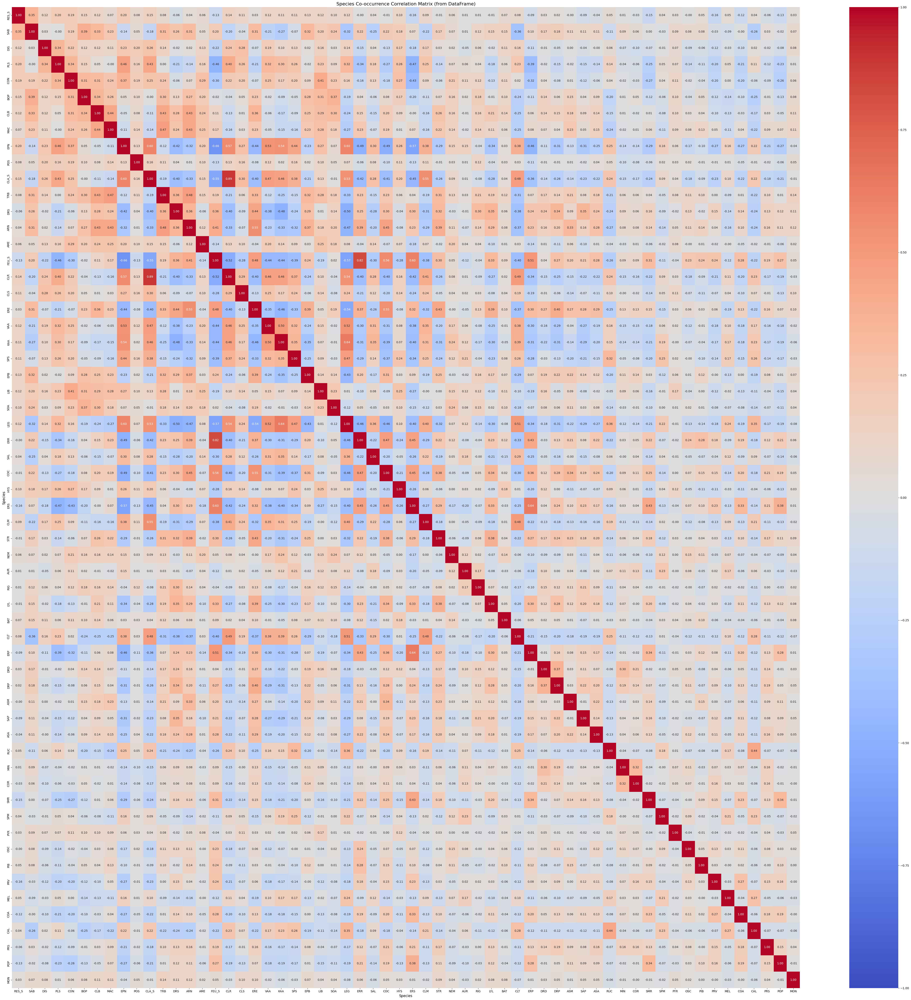

In [46]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import MultiLabelBinarizer

def calculate_correlation_from_df(df, species_names_list, species_list_col='species_list'):
    """
    Calculates a species co-occurrence correlation matrix from a DataFrame
    that has a column containing lists of species.
    
    Args:
        df (pd.DataFrame): The DataFrame with your observation data.
        species_names_list (list): The master list of all species names,
                                     ensuring the matrix columns are in the
                                     correct order.
        species_list_col (str): The name of the column containing the lists.
        
    Returns:
        np.ndarray: An (S, S) correlation matrix, or None on error.
    """
    
    # 1. Validate inputs
    if species_list_col not in df.columns:
        print(f"Error: Column '{species_list_col}' not found in DataFrame.")
        return None
        
    if not species_names_list:
        print("Error: 'species_names_list' cannot be empty.")
        return None
        
    print(f"Processing {len(df)} sites for {len(species_names_list)} species...")

    # 2. Use MultiLabelBinarizer to create the presence/absence matrix
    # We pass `classes=species_names_list` to fix the column order
    # and ensure it only includes the species we care about.
    mlb = MultiLabelBinarizer(classes=species_names_list)
    
    # Fit and transform the data. This creates an (N_sites, S_species) binary matrix.
    presence_matrix = mlb.fit_transform(df[species_list_col])
    
    # 3. Calculate the correlation matrix
    # We must transpose the matrix. np.corrcoef expects variables as rows.
    # (N, S) -> (S, N)
    print("Calculating correlation matrix...")
    corr_matrix = np.corrcoef(presence_matrix.T)
    
    # 4. Print summary stats (like your previous snippet)
    corr_matrix_stats = corr_matrix.copy()
    np.fill_diagonal(corr_matrix_stats, 0) # Ignore diagonal for stats
    print("\n--- Data Correlation Matrix Stats ---")
    print(f"Mean absolute off-diagonal correlation: {np.abs(corr_matrix_stats).mean():.3f}")
    print(f"Max positive correlation: {corr_matrix_stats.max():.3f}")
    print(f"Max negative correlation: {corr_matrix_stats.min():.3f}\n")

    # 5. Visualize
    plt.figure(figsize=(max(12, len(species_names_list) * 0.8), max(10, len(species_names_list) * 0.8)))
    sns.heatmap(
        corr_matrix, 
        annot=True, 
        fmt=".2f", 
        cmap="coolwarm", 
        center=0, 
        vmin=-1, 
        vmax=1,
        xticklabels=species_names_list,
        yticklabels=species_names_list
    )
    plt.title("Species Co-occurrence Correlation Matrix (from DataFrame)", fontsize=16)
    plt.xlabel("Species", fontsize=12)
    plt.ylabel("Species", fontsize=12)
    plt.tight_layout()
    plt.savefig("data_correlation_matrix.png")
    print("Saved plot to 'data_correlation_matrix.png'")
    plt.show()

    return corr_matrix

interaction_matrix_from_data = calculate_correlation_from_df(
    processed_species_original_locations,
    species_names,
    species_list_col='species_list'
)


--- Matrix Correlation Analysis ---
Pearson Correlation (off-diagonal): 0.6052
P-value: 0.0000
Result: This is a statistically significant correlation!


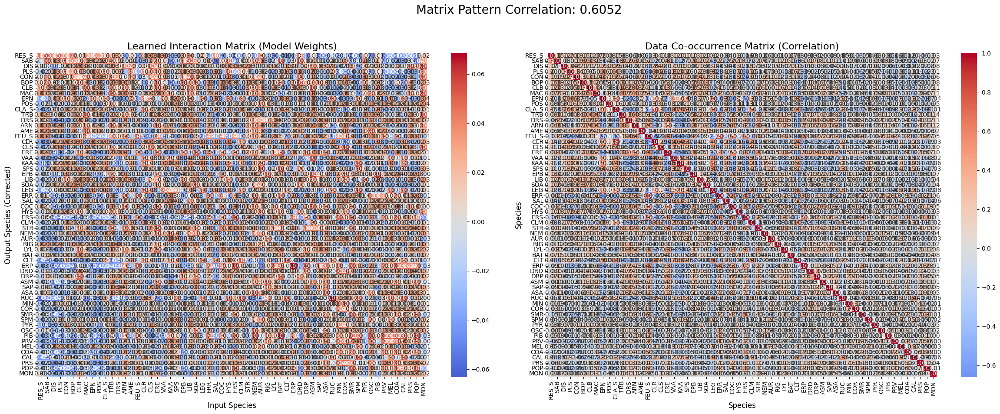

In [47]:
compare_interaction_matrices(model_shared, interaction_matrix_from_data, species_names)

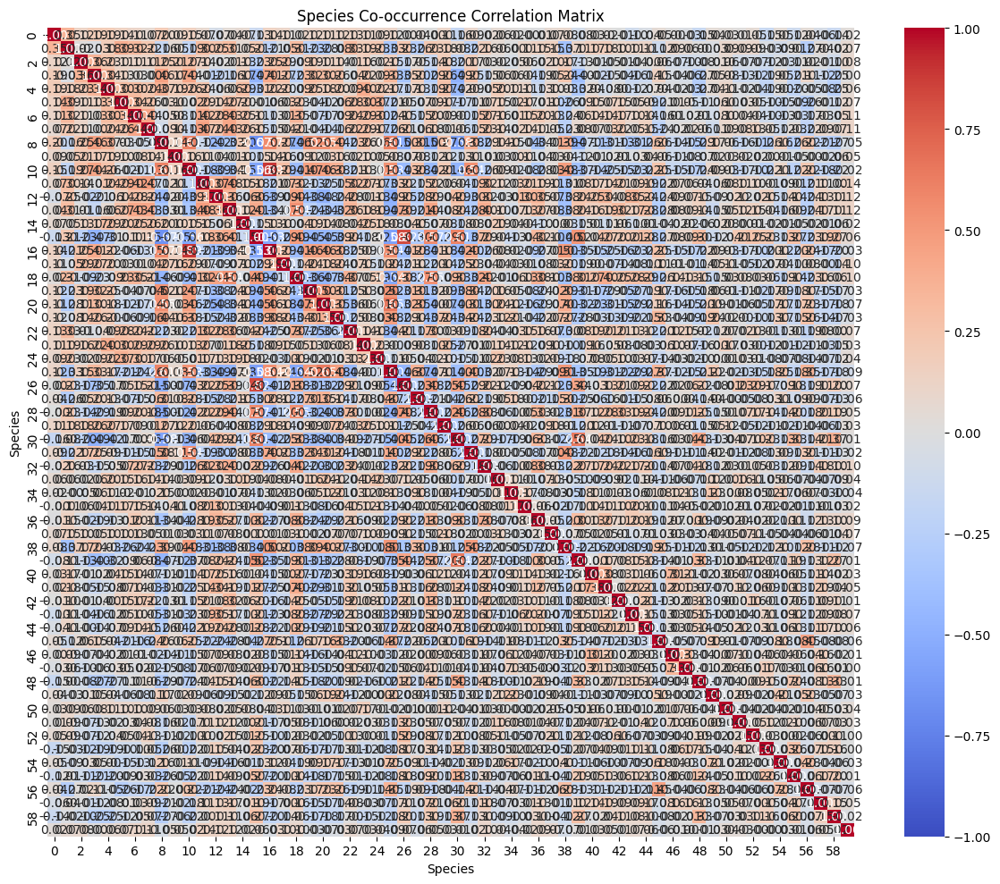

Mean absolute off-diagonal correlation: 0.145
Max positive correlation: 0.893
Max negative correlation: -0.669


In [34]:
def analyze_species_correlations(dataloader, model, device):
    """Check if species co-occur in ways that suggest interactions"""
    all_labels = []
    
    with torch.no_grad():
        for batch in dataloader:
            labels = batch[1]
            all_labels.append(labels.cpu())
    
    all_labels = torch.cat(all_labels, dim=0).numpy()  # (N, num_species)
    
    # Compute correlation matrix
    corr_matrix = np.corrcoef(all_labels.T)  # (S, S)
    
    # Visualize
    plt.figure(figsize=(12, 10))
    sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", 
                center=0, vmin=-1, vmax=1)
    plt.title("Species Co-occurrence Correlation Matrix")
    plt.xlabel("Species")
    plt.ylabel("Species")
    plt.tight_layout()
    plt.savefig("species_correlations.png")
    plt.show()
    
    # Print summary
    np.fill_diagonal(corr_matrix, 0)  # Ignore diagonal
    print(f"Mean absolute off-diagonal correlation: {np.abs(corr_matrix).mean():.3f}")
    print(f"Max positive correlation: {corr_matrix.max():.3f}")
    print(f"Max negative correlation: {corr_matrix.min():.3f}")
    
    return corr_matrix

# Run this on your training data
from torch.utils.data import DataLoader
import numpy as np

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
train_loader = DataLoader(train_dataset, batch_size=64, shuffle=False)
corr_matrix = analyze_species_correlations(train_loader, model_shared, device)

### Logit analysis

In [16]:
import torch
import torch.nn.functional as F

def create_bce_analysis_loss(species_prevalences, device, 
                             pos_weight_cap=50.0, eps=1e-8,
                             invert_prevalences=False):
    """
    Creates a BCE loss function that returns per-sample, per-species losses.
    """
    
    # --- 1. Pre-calculate pos_weights for BCE ---
    avg_prev = sum(species_prevalences) / len(species_prevalences)
    if avg_prev > 0.7 and not invert_prevalences:
        invert_prevalences = True
    
    if invert_prevalences:
        species_prevalences = [1.0 - p for p in species_prevalences]
    
    pos_weights = []
    for prev in species_prevalences:
        w = (1.0 - prev) / max(prev, eps)
        pos_weights.append(min(w, pos_weight_cap))
        
    pos_weight_tensor = torch.tensor(pos_weights, device=device)
    
    # --- 2. Define the inner loss function ---
    def loss_fn(logits, targets):
        # This is the key: reduction='none' returns a tensor of the
        # same shape as logits/targets: [Batch_Size, num_species]
        bce_loss = F.binary_cross_entropy_with_logits(
            logits, 
            targets, 
            pos_weight=pos_weight_tensor,
            reduction='none'
        )
        return bce_loss
    
    print(f"✓ Created BCE analysis loss function. Pos weights range: [{min(pos_weights):.2f}, {max(pos_weights):.2f}]")
    return loss_fn


from tqdm.notebook import tqdm

@torch.no_grad()  # We don't need to calculate gradients, so this makes it fast
def analyze_hard_samples(model, dataloader, species_prevalences, device):
    """
    Runs inference on a dataloader and returns the per-sample, per-species
    losses, probabilities, labels, and coordinates.
    """
    model.eval()
    
    # 1. Create our special loss function
    analysis_loss_fn = create_bce_analysis_loss(
        species_prevalences, 
        device,
        pos_weight_cap=50.0 # Make sure this matches your training!
    )
    
    all_losses = []
    all_probs = []
    all_labels = []
    all_coords = []

    pbar = tqdm(dataloader, desc="Analyzing hard samples")
    for batch in pbar:
        # 2. Unpack batch (with coordinates)
        inputs, labels = batch[0], batch[1]
        coords = None
        if len(batch) == 3:
            coords = batch[2]
        else:
            raise ValueError("Dataloader is not returning coordinates. Please set include_coords=True.")

        # 3. Move to device
        if isinstance(inputs, (list, tuple)):
            inputs = [x.to(device) for x in inputs]
        else:
            inputs = [inputs.to(device)]
        labels = labels.to(device).float()
        coords = coords.to(device).float()

        # 4. Get model outputs
        # This assumes your forward pass returns 5 items (and logits are first)
        final_logits, _, _, _, _ = model(inputs, coordinates=coords) 

        # 5. Calculate and store per-sample data
        probs = torch.sigmoid(final_logits)
        loss = analysis_loss_fn(final_logits, labels) # Shape: [B, num_species]

        all_losses.append(loss.cpu())
        all_probs.append(probs.cpu())
        all_labels.append(labels.cpu())
        all_coords.append(coords.cpu())
    
    # 6. Concatenate all batches into big tensors
    results = {
        'losses': torch.cat(all_losses, dim=0),
        'probabilities': torch.cat(all_probs, dim=0),
        'labels': torch.cat(all_labels, dim=0),
        'coordinates': torch.cat(all_coords, dim=0)
    }
    
    print("✓ Analysis complete.")
    return results

In [22]:
#get an item from val_dataset to check if it has coordinates
item = val_dataset[0]
print(f"Item from val_dataset has {len(item)} elements.")
print(f"Coordinates: {item[2]}")  # Assuming coordinates are the third element

Item from val_dataset has 3 elements.
Coordinates: tensor([-0.6054, -0.8786])


In [7]:
quebec_gdf = gpd.read_file('../scratch/data/boundaries/lpr_000b16a_e/lpr_000b16a_e.shp')
quebec_gdf = quebec_gdf[quebec_gdf['PRENAME'] == 'Quebec']
quebec_gdf = quebec_gdf.to_crs(epsg=4326)
print("Crs: ", quebec_gdf.crs)

Crs:  EPSG:4326


In [67]:
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from tqdm import tqdm


def analyze_gating_behavior(model, dataloader, device, feature_names=None, save_path=None, max_batches=None):
    """
    Analyze and visualize average gating weights across the dataset.

    Compatible with both dict-based and tuple-based datasets.
    """
    model.eval()
    all_gates = []
    species_names = list(range(model.num_species))

    with torch.no_grad():
        for i, batch in enumerate(tqdm(dataloader, desc="Collecting gating weights")):
            # --- Handle different dataloader output formats ---
            if isinstance(batch, dict):
                inputs = batch.get("inputs") or batch.get("x") or list(batch.values())[0]
            elif isinstance(batch, (list, tuple)):
                inputs = batch[0]  # assume first element are the inputs
            else:
                raise TypeError(f"Unexpected batch type: {type(batch)}")

            # Move inputs to device
            if isinstance(inputs, (list, tuple)):
                inputs = [x.to(device) for x in inputs]
            else:
                inputs = inputs.to(device)

            # --- Extract features and gating weights ---
            if hasattr(model, "extract_features"):
                combined_features, gates, _ = model.extract_features(inputs)
            elif hasattr(model, "get_gates"):
                gates = model.get_gates(inputs)
            else:
                raise AttributeError("Model has no method to access gates (expected extract_features or get_gates).")

            if gates is None:
                print("No gating found in this model.")
                return

            # --- Aggregate ---
            if isinstance(gates, list):  # per-species gating
                for sp_idx, g in enumerate(gates):
                    g = g.mean(0).detach().cpu().numpy()
                    if len(all_gates) <= sp_idx:
                        all_gates.append(g)
                    else:
                        all_gates[sp_idx] += g
            else:  # shared gating
                g = gates.mean(0).detach().cpu().numpy()
                if len(all_gates) == 0:
                    all_gates.append(g)
                else:
                    all_gates[0] += g

            if max_batches and i >= max_batches:
                break

    all_gates = np.stack(all_gates)
    all_gates /= np.max(all_gates, axis=1, keepdims=True) + 1e-6

    # --- Plot ---
    plt.figure(figsize=(10, 6))
    sns.heatmap(
        all_gates,
        cmap="viridis",
        annot=True,
        fmt=".2f",
        xticklabels=feature_names or [f"Feature {i}" for i in range(all_gates.shape[1])],
        yticklabels=[f"Species {i}" for i in species_names],
    )
    plt.title("Average Gating Weights per Species and Feature Source")
    plt.xlabel("Feature Source")
    plt.ylabel("Species")
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=200)
    plt.show()

    return all_gates

def analyze_model_health(model, dataloader, device, num_batches=3):
    """
    Evaluate model health indicators over a few batches.

    Handles dataloaders that yield dicts, tuples/lists or plain tensors.
    """
    model.eval()
    all_shared, all_specific, all_logits = [], [], []

    with torch.no_grad():
        for i, batch in enumerate(dataloader):
            # --- Handle different dataloader output formats ---
            if isinstance(batch, dict):
                inputs = batch.get("inputs") or batch.get("x") or list(batch.values())[0]
            elif isinstance(batch, (list, tuple)):
                inputs = batch[0]
            else:
                inputs = batch

            # Move inputs to device
            if isinstance(inputs, (list, tuple)):
                inputs = [x.to(device) for x in inputs]
            else:
                inputs = inputs.to(device)

            outputs = model(inputs)
            if isinstance(outputs, tuple):
                final_logits, shared_logits, specific_logits, latent = outputs
            else:
                final_logits = outputs
                shared_logits = specific_logits = None

            all_logits.append(final_logits.cpu())
            if shared_logits is not None: all_shared.append(shared_logits.cpu())
            if specific_logits is not None: all_specific.append(specific_logits.cpu())
            if i >= num_batches - 1:
                break

    logits = torch.cat(all_logits)
    entropy = -(F.softmax(logits, dim=1) * F.log_softmax(logits, dim=1)).sum(1).mean().item()

    print("=== Model Health Summary ===")
    print(f"Avg logit magnitude: {logits.abs().mean():.4f}")
    print(f"Avg logit entropy:   {entropy:.4f}")
    if all_shared and all_specific:
        print(f"Shared vs Specific mean norm: {torch.cat(all_shared).norm():.3f} / {torch.cat(all_specific).norm():.3f}")

    # Plot histogram of logits
    plt.figure(figsize=(6, 3))
    plt.hist(logits.flatten().numpy(), bins=50, alpha=0.7)
    plt.title("Logit Distribution")
    plt.xlabel("Value")
    plt.ylabel("Count")
    plt.show()

    if all_shared and all_specific:
        plt.figure(figsize=(5,3))
        shared_norms = torch.cat(all_shared).norm(dim=1)
        specific_norms = torch.cat(all_specific).norm(dim=1)
        plt.scatter(shared_norms, specific_norms, alpha=0.5)
        plt.xlabel("Shared Norm")
        plt.ylabel("Specific Norm")
        plt.title("Shared vs Specific Head Strength")
        plt.show()
        plt.show()

from torch.utils.data import DataLoader

val_dataloader = DataLoader(val_dataset, batch_size=64, shuffle=False)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
#analyze_gating_behavior(model_mixture, val_dataloader, device, feature_names=["Satellite"], max_batches=10)

analyze_model_health(model_mixture_residual_stage2_v2_aoi_loss, val_dataloader, device, num_batches=5)

RuntimeError: mat1 and mat2 shapes cannot be multiplied (64x256 and 320x526)

In [68]:
from torch.utils.data import DataLoader
import torch

val_loader = DataLoader(val_dataset, batch_size=64, shuffle=False)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


avg_shared_vec, avg_specific_vec = model_mixture_residual_stage2_v2_aoi_loss.get_average_logit_magnitudes(val_loader, device)

# --- (Recommended) Display with Pandas ---
if avg_shared_vec is not None and avg_specific_vec is not None:
    import pandas as pd
    
    magnitude_df = pd.DataFrame({
        "SharedHead_Mag": avg_shared_vec,
        "SpecificHead_Mag": avg_specific_vec
    }, index=species_names) # Use your list of species names

    # Add a ratio column to see which one is dominant
    magnitude_df["Specific_to_Shared_Ratio"] = \
        magnitude_df["SpecificHead_Mag"] / (magnitude_df["SharedHead_Mag"] + 1e-6)

    print("--- Per-Species Fusion Debug Report ---")
    
    # Sort to see the species where the specific head is most active
    print(magnitude_df.sort_values(by="Specific_to_Shared_Ratio", ascending=False))

#now plot the results
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 6))
plt.bar(magnitude_df.index, magnitude_df["SharedHead_Mag"], label="Shared Head Magnitude")
plt.bar(magnitude_df.index, magnitude_df["SpecificHead_Mag"], bottom=magnitude_df["SharedHead_Mag"], label="Specific Head Magnitude")
plt.xticks(rotation=90)
plt.ylabel("Average Logit Magnitude")
plt.title("Per-Species Head Logit Magnitudes")
plt.legend()
plt.show()

RuntimeError: mat1 and mat2 shapes cannot be multiplied (64x256 and 320x526)

Generated 3 new plots: 'top_20_specialists_plot.png', 'bottom_20_generalists_plot.png', and 'head_magnitude_scatterplot.png'


<Figure size 1200x1000 with 0 Axes>

<Figure size 1200x1000 with 0 Axes>

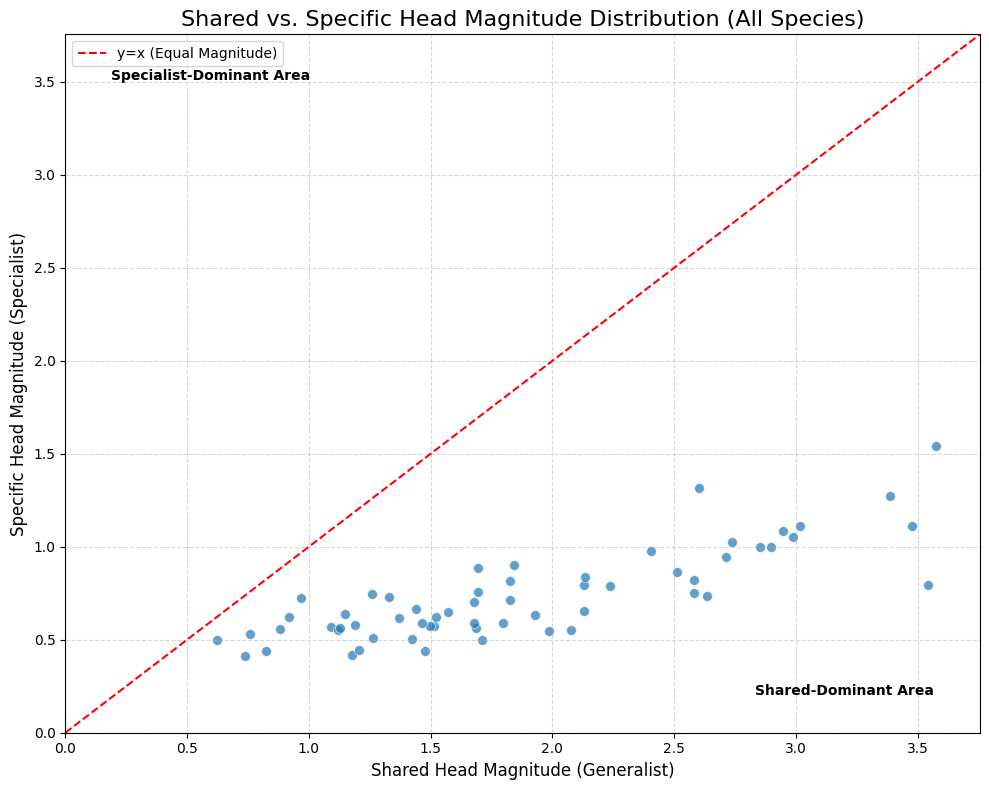

In [10]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# --- Re-create the DataFrame ---
# (Assuming avg_shared_vec, avg_specific_vec, and species_names are in memory)
magnitude_df = pd.DataFrame({
    "SharedHead_Mag": avg_shared_vec,
    "SpecificHead_Mag": avg_specific_vec
}, index=species_names)

magnitude_df["Specific_to_Shared_Ratio"] = \
    magnitude_df["SpecificHead_Mag"] / (magnitude_df["SharedHead_Mag"] + 1e-6)

# Sort the DataFrame by the ratio
magnitude_df_sorted = magnitude_df.sort_values(by="Specific_to_Shared_Ratio", ascending=False)

# --- Plot 1: Top 20 "Specialist" Species ---
# (Where the specific head is most dominant)

# Get top 20 and melt for seaborn
top_n = 20
df_top = magnitude_df_sorted.head(top_n)
df_top_melted = df_top.reset_index().rename(columns={'index':'Species'}).melt(
    id_vars='Species', 
    value_vars=['SharedHead_Mag', 'SpecificHead_Mag'], 
    var_name='Head Type', 
    value_name='Magnitude'
)

plt.figure(figsize=(12, 10))
sns.barplot(
    data=df_top_melted,
    y='Species',
    x='Magnitude',
    hue='Head Type',
    order=df_top.index,  # This preserves the sorted order
    palette={'SharedHead_Mag': 'skyblue', 'SpecificHead_Mag': 'salmon'}
)
plt.title(f'Top {top_n} "Specialist" Species (Specific Head is Dominant)', fontsize=16)
plt.xlabel('Average Logit Magnitude', fontsize=12)
plt.ylabel('Species', fontsize=12)
plt.legend(title="Head Type")
plt.tight_layout()
plt.savefig("top_20_specialists_plot.png")
plt.clf() # Clear the figure for the next plot

# --- Plot 2: Bottom 20 "Generalist" Species ---
# (Where the shared head is most dominant)

# Get bottom 20 and melt for seaborn
df_bottom = magnitude_df_sorted.tail(top_n)
df_bottom_melted = df_bottom.reset_index().rename(columns={'index':'Species'}).melt(
    id_vars='Species', 
    value_vars=['SharedHead_Mag', 'SpecificHead_Mag'], 
    var_name='Head Type', 
    value_name='Magnitude'
)

plt.figure(figsize=(12, 10))
sns.barplot(
    data=df_bottom_melted,
    y='Species',
    x='Magnitude',
    hue='Head Type',
    order=df_bottom.index,  # This preserves the sorted order
    palette={'SharedHead_Mag': 'skyblue', 'SpecificHead_Mag': 'salmon'}
)
plt.title(f'Bottom {top_n} "Generalist" Species (Shared Head is Dominant)', fontsize=16)
plt.xlabel('Average Logit Magnitude', fontsize=12)
plt.ylabel('Species', fontsize=12)
plt.legend(title="Head Type")
plt.tight_layout()
plt.savefig("bottom_20_generalists_plot.png")
plt.clf() # Clear the figure for the next plot


# --- Plot 3: Scatter Plot of All Species ---
# (Shows the whole distribution)

plt.figure(figsize=(10, 8))
sns.scatterplot(
    data=magnitude_df,
    x='SharedHead_Mag',
    y='SpecificHead_Mag',
    alpha=0.7,
    s=50  # Adjust size of dots
)

# Add a y=x line to show which head is dominant
lim_min = 0
lim_max = max(magnitude_df['SharedHead_Mag'].max(), magnitude_df['SpecificHead_Mag'].max()) * 1.05
plt.plot([lim_min, lim_max], [lim_min, lim_max], color='red', linestyle='--', label='y=x (Equal Magnitude)')

plt.xlim(lim_min, lim_max)
plt.ylim(lim_min, lim_max)
plt.title('Shared vs. Specific Head Magnitude Distribution (All Species)', fontsize=16)
plt.xlabel('Shared Head Magnitude (Generalist)', fontsize=12)
plt.ylabel('Specific Head Magnitude (Specialist)', fontsize=12)
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)

# Add helper text to the plot
plt.text(lim_max * 0.05, lim_max * 0.95, 'Specialist-Dominant Area', 
         color='black', ha='left', va='top', fontsize=10, weight='bold')
plt.text(lim_max * 0.95, lim_max * 0.05, 'Shared-Dominant Area', 
         color='black', ha='right', va='bottom', fontsize=10, weight='bold')

plt.tight_layout()
plt.savefig("head_magnitude_scatterplot.png")

print("Generated 3 new plots: 'top_20_specialists_plot.png', 'bottom_20_generalists_plot.png', and 'head_magnitude_scatterplot.png'")

In [22]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def plot_gradients(logfile="./gradients/gradients_log3.csv", params_to_plot=None):
    """
    Plots gradient statistics over epochs with clear separation for common and rare species.
    
    Args:
        logfile (str): Path to the CSV log generated by log_gradients.
        params_to_plot (list of str): Optional list of parameter names to focus on.
    """
    df = pd.read_csv(logfile)
    
    # Filter parameters if specified
    if params_to_plot is not None:
        df = df[df['param'].isin(params_to_plot)]
    
    # Fill missing rarity for shared/other
    df['rarity'] = df['rarity'].fillna('shared/other')

    # Split dataframes for clarity
    df_shared = df[df['head_type'] == 'shared']
    df_species_common = df[(df['head_type'] == 'species') & (df['rarity'] == 'common')]
    df_species_rare = df[(df['head_type'] == 'species') & (df['rarity'] == 'rare')]
    df_other = df[df['head_type'] == 'other']

    # Plot mean gradients
    fig, axes = plt.subplots(2, 2, figsize=(16, 10), sharex=True)
    
    sns.lineplot(ax=axes[0,0], data=df_shared, x="epoch", y="grad_mean", hue="param", marker="o")
    axes[0,0].set_title("Shared head - Mean Gradients")
    axes[0,0].grid(True)

    sns.lineplot(ax=axes[0,1], data=df_species_common, x="epoch", y="grad_mean", hue="param", marker="o")
    axes[0,1].set_title("Species heads - Common - Mean Gradients")
    axes[0,1].grid(True)

    sns.lineplot(ax=axes[1,0], data=df_species_rare, x="epoch", y="grad_mean", hue="param", marker="o")
    axes[1,0].set_title("Species heads - Rare - Mean Gradients")
    axes[1,0].grid(True)

    sns.lineplot(ax=axes[1,1], data=df_other, x="epoch", y="grad_mean", hue="param", marker="o")
    axes[1,1].set_title("Other layers - Mean Gradients")
    axes[1,1].grid(True)

    for ax in axes.flat:
        ax.set_xlabel("Epoch")
        ax.set_ylabel("Grad Mean")
        ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    
    plt.tight_layout()
    plt.show()

    # Plot max gradients (optional)
    fig, axes = plt.subplots(2, 2, figsize=(16, 10), sharex=True)
    
    sns.lineplot(ax=axes[0,0], data=df_shared, x="epoch", y="grad_max", hue="param", marker="o")
    axes[0,0].set_title("Shared head - Max Gradients")
    axes[0,0].grid(True)

    sns.lineplot(ax=axes[0,1], data=df_species_common, x="epoch", y="grad_max", hue="param", marker="o")
    axes[0,1].set_title("Species heads - Common - Max Gradients")
    axes[0,1].grid(True)

    sns.lineplot(ax=axes[1,0], data=df_species_rare, x="epoch", y="grad_max", hue="param", marker="o")
    axes[1,0].set_title("Species heads - Rare - Max Gradients")
    axes[1,0].grid(True)

    sns.lineplot(ax=axes[1,1], data=df_other, x="epoch", y="grad_max", hue="param", marker="o")
    axes[1,1].set_title("Other layers - Max Gradients")
    axes[1,1].grid(True)

    for ax in axes.flat:
        ax.set_xlabel("Epoch")
        ax.set_ylabel("Grad Max")
        ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

    plt.tight_layout()
    plt.show()


In [ ]:
# Plot all gradients
plot_gradients(logfile="./gradients/rare_spec_gradients_log3.csv")

In [12]:
avg_gates, feature_names = model_mixture.get_average_gate_weights(val_loader, device)

Calculating Gate Weights:   0%|                                                                                                    | 0/70 [00:00<?, ?it/s]

In [13]:
avg_gates

array([[0.51108146, 0.18294632],
       [0.61180073, 0.13224468],
       [0.77038723, 0.47137398],
       [0.6043637 , 0.32278007],
       [0.8179745 , 0.2784921 ],
       [0.7033901 , 0.41839567],
       [0.90855616, 0.61684984],
       [0.5678219 , 0.7230241 ],
       [0.3891088 , 0.20080994],
       [0.6592432 , 0.42737135],
       [0.7421871 , 0.40258023],
       [0.91840625, 0.23126566],
       [0.654844  , 0.18056516],
       [0.94911426, 0.24676716],
       [0.93503034, 0.31032512],
       [0.9331694 , 0.30583993],
       [0.48944983, 0.2073754 ],
       [0.9296995 , 0.32482442],
       [0.8344642 , 0.2553954 ],
       [0.6198054 , 0.4632459 ],
       [0.42621073, 0.36833224],
       [0.7206795 , 0.36891133],
       [0.54311395, 0.6269    ],
       [0.44374958, 0.1667307 ],
       [0.7428718 , 0.6596635 ],
       [0.5588599 , 0.41979235],
       [0.7338639 , 0.3125841 ],
       [0.58361894, 0.3877319 ],
       [0.5375117 , 0.28149027],
       [0.8326462 , 0.43316147],
       [0.

### Gaussian attention

In [35]:
from models.gaussian_filter_model import create_simple_model_and_train


input_dim = train_dataset.effective_shapes
species_prevalences = prevalences
print(f"Train dataset size: {len(train_dataset)}, Val dataset size: {len(val_dataset)}")
print(f"Input dimensions: {input_dim}")
model, results = create_simple_model_and_train(train_dataset, val_dataset, input_dim, species_prevalences, species_names)

Train dataset size: 20259, Val dataset size: 4473
Input dimensions: [{'shape': (67, 20, 20), 'source': 'pred_100'}, {'shape': (67,), 'source': 'point_infos'}]
Input shapes:
  Branch 0: pred_100 with shape (67, 20, 20)
  Branch 1: point_infos with shape (67,)
Total features per species head: 32800
Using spatial size: 16x16
Starting simplified training...


KeyboardInterrupt: 

In [ ]:
[0.41020408272743225, 0.5408163070678711, 0.5571428537368774, 0.5408163070678711, 0.5734694004058838, 0.6714285612106323, 0.6387754678726196, 0.6387754678726196, 0.655102014541626, 0.6224489808082581, 0.7693877220153809, 0.6224489808082581, 0.6387754678726196, 0.6061224341392517, 0.6714285612106323, 0.7857142686843872, 0.655102014541626, 0.655102014541626, 0.7204081416130066, 0.7040815949440002]

In [7]:
import torch

# Assume your patch size is 5 km × 5 km
patch_size_km = 5.0

# Access sigma parameters
sigma_x = model.sat_attn.sigma_x.detach()  # shape: (num_species,)
sigma_y = model.sat_attn.sigma_y.detach()

sigma = (sigma_x + sigma_y) / 2 
# Convert to km
sigma_km = sigma * patch_size_km

# Print results
for i, (s) in enumerate(sigma_km):
    print(f"Species {i}: sigma ~ {s:.2f} km")


AttributeError: 'NoneType' object has no attribute 'sigma_x'

In [77]:
combined

,species,precision_Full,recall_Full,f1_Full,accuracy_Full,specificity_Full,precision_Reduced,recall_Reduced,f1_Reduced,accuracy_Reduced,specificity_Reduced,model,presence_ratio,presence_group
0,AME,0.549013,0.734088,0.628203,0.587972,0.456207,0.570121,0.734088,0.641797,0.590288,0.446488,Shared only,0.478368,Average (25-50%)
1,ARN,0.696446,0.892340,0.782317,0.739101,0.569477,0.696446,0.892340,0.782317,0.739101,0.569477,Shared only,0.478975,Average (25-50%)
2,ASA,0.328992,0.839901,0.472790,0.659960,0.620049,0.540412,0.839901,0.657666,0.562808,0.285714,Shared only,0.162947,Rare (10-25%)
3,ASM,0.451190,0.833883,0.585554,0.760116,0.741302,0.587597,0.833883,0.689404,0.624312,0.414741,Shared only,0.171640,Rare (10-25%)
4,AUR,0.378603,0.710718,0.494033,0.687235,0.680809,0.579304,0.710718,0.638318,0.597294,0.483871,Shared only,0.208556,Rare (10-25%)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115,SPM,0.258294,0.357377,0.299862,0.886206,0.924904,0.664634,0.357377,0.464819,0.588525,0.819672,Shared + Independent,0.072618,Ultra rare (<10%)
116,SPS,0.664975,0.484288,0.560428,0.724346,0.861053,0.694960,0.484288,0.570806,0.635860,0.787431,Shared + Independent,0.367419,Average (25-50%)
117,STR,0.529096,0.534358,0.531714,0.767270,0.843778,0.630064,0.534358,0.578278,0.610307,0.686257,Shared + Independent,0.219392,Rare (10-25%)
118,TRB,0.760959,0.516872,0.615603,0.636486,0.790686,0.760959,0.516872,0.615603,0.636486,0.790686,Shared + Independent,0.487142,Average (25-50%)


In [15]:
combined

,species,precision_Full,recall_Full,f1_Full,accuracy_Full,specificity_Full,precision_Reduced,recall_Reduced,f1_Reduced,accuracy_Reduced,specificity_Reduced,model,presence_ratio,presence_group
0,AME,0.572766,0.692126,0.626815,0.609211,0.534439,0.590982,0.692126,0.637568,0.606554,0.520981,Shared only,0.478368,Average (25-50%)
1,ARN,0.716643,0.868511,0.785302,0.750503,0.619878,0.716643,0.868511,0.785302,0.750503,0.619878,Shared only,0.478975,Average (25-50%)
2,ASA,0.386870,0.812808,0.524226,0.732171,0.714286,0.556492,0.812808,0.660661,0.582512,0.352217,Shared only,0.162947,Rare (10-25%)
3,ASM,0.468635,0.838284,0.601183,0.773977,0.757576,0.596711,0.838284,0.697164,0.635864,0.433443,Shared only,0.171640,Rare (10-25%)
4,AUR,0.368030,0.721124,0.487342,0.674044,0.661162,0.566176,0.721124,0.634325,0.584287,0.447451,Shared only,0.208556,Rare (10-25%)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
175,SPM,0.196464,0.655738,0.302343,0.793651,0.803743,0.607903,0.655738,0.630915,0.616393,0.577049,Shared + Independent + Residual - Stage 2 v2,0.072618,Ultra rare (<10%)
176,SPS,0.591924,0.767714,0.668455,0.723675,0.698596,0.629611,0.767714,0.691838,0.658041,0.548367,Shared + Independent + Residual - Stage 2 v2,0.367419,Average (25-50%)
177,STR,0.461222,0.709765,0.559117,0.723228,0.727651,0.599694,0.709765,0.650104,0.617993,0.526221,Shared + Independent + Residual - Stage 2 v2,0.219392,Rare (10-25%)
178,TRB,0.693891,0.829694,0.755740,0.697966,0.528147,0.693891,0.829694,0.755740,0.697966,0.528147,Shared + Independent + Residual - Stage 2 v2,0.487142,Average (25-50%)


In [8]:
selected_species = ['AME', 'KAA', 'RUC', 'BCH']
subset = combined[combined['species'].isin(selected_species)]
print(f"Found {len(subset)} rows for species: {selected_species}")
subset

Found 6 rows for species: ['AME', 'KAA', 'RUC', 'BCH']


,species,precision_Full,recall_Full,f1_Full,accuracy_Full,specificity_Full,precision_Reduced,recall_Reduced,f1_Reduced,accuracy_Reduced,specificity_Reduced,model,presence_ratio,presence_group
0,AME,0.543219,0.708157,0.614818,0.579253,0.463010,0.566365,0.708157,0.629374,0.582980,0.457803,Shared only,0.478368,Average (25-50%)
30,KAA,0.641417,0.825839,0.722038,0.775542,0.748100,0.689218,0.825839,0.751368,0.726726,0.627612,Shared only,0.373807,Average (25-50%)
49,RUC,0.246736,0.811159,0.378378,0.861167,0.863915,0.565868,0.811159,0.666667,0.594421,0.377682,Shared only,0.080907,Ultra rare (<10%)
60,AME,0.561517,0.656294,0.605217,0.594008,0.537840,0.584628,0.656294,0.618392,0.595002,0.533711,Shared + Independent,0.478368,Average (25-50%)
90,KAA,0.658575,0.790374,0.718480,0.781355,0.776434,0.699944,0.790374,0.742415,0.725776,0.661178,Shared + Independent,0.373807,Average (25-50%)
109,RUC,0.256815,0.768240,0.384946,0.872122,0.877830,0.577419,0.768240,0.659300,0.603004,0.437768,Shared + Independent,0.080907,Ultra rare (<10%)


In [19]:
#sumarrize sats per model and presence groups
summary = combined.groupby(['model', 'presence_group']).agg({
    'accuracy': ['mean', 'std'],
    'reduced_accuracy' : ['mean', 'std'],
    'precision': ['mean', 'std'],
    'precision_reduced': ['mean', 'std'],
    'recall': ['mean', 'std'],
    'recall_reduced': ['mean', 'std'],
    'f1': ['mean', 'std'],
    'f1_reduced': ['mean', 'std'],
    'specificity': ['mean', 'std'],
    'specificity_reduced': ['mean', 'std']
}).reset_index()
summary

/tmp/ipykernel_934637/283082333.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  summary = combined.groupby(['model', 'presence_group']).agg({


KeyError: "Column(s) ['f1_reduced', 'precision_reduced', 'recall_reduced', 'reduced_accuracy', 'specificity_reduced'] do not exist"

In [18]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import torch

# Make sure you have these libraries:
# pip install matplotlib seaborn pandas

def visualize_species_gates(debug_info, species_names, title="Species-Specific Modality Gates"):
    """
    Visualizes the average gate weights for each species from the independent heads.
    
    Args:
        debug_info (dict): The debug_info dictionary returned by the model.
        species_names (list): A list of species names (must be length num_species).
        title (str): The title for the plot.
    """
    
    # 1. Extract gate data from debug_info
    # This is a list of S tensors, each (B, num_sources)
    gate_data = debug_info.get("independent_head_gates")
    if gate_data is None:
        print("Error: 'independent_head_gates' not found in debug_info.")
        return

    gate_names = debug_info.get("feature_names_for_gates")
    if gate_names is None:
        print("Error: 'feature_names_for_gates' not found in debug_info.")
        return
        
    num_species = len(species_names)
    if len(gate_data) != num_species:
        print(f"Error: Found {len(gate_data)} species in gates, but {num_species} species names were provided.")
        return

    # 2. Process the gate data
    # Average gates over the batch (B) dimension for each species
    # Result is a list of S tensors, each (num_sources,)
    avg_gates_per_species = [g.mean(dim=0) for g in gate_data]
    
    # 3. Stack into a 2D tensor (S, num_sources)
    gate_matrix = torch.stack(avg_gates_per_species)
    
    # 4. Convert to Pandas DataFrame for plotting
    df_gates = pd.DataFrame(
        gate_matrix.detach().cpu().numpy(),
        index=species_names,
        columns=gate_names
    )
    
    # 5. Plot
    plt.figure(figsize=(max(8, len(gate_names) * 1.5), max(8, num_species * 0.5)))
    sns.heatmap(
        df_gates, 
        annot=True, 
        fmt=".2f", 
        cmap="viridis",  # Use "viridis" for importance (0 -> 1)
        linewidths=.5,
        cbar_kws={'label': 'Average Gate Value (Importance)'}
    )
    plt.title(title, fontsize=16)
    plt.xlabel("Data Modality", fontsize=12)
    plt.ylabel("Species", fontsize=12)
    plt.xticks(rotation=45, ha="right")
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()


def visualize_interaction_matrix(model, species_names, title="Species Interaction Matrix (Shared Head)"):
    """
    Visualizes the (S, S) weight matrix from the shared_interaction_layer.
    
    Args:
        model (nn.Module): The HybridMultiSpeciesModel instance.
        species_names (list): A list of species names (must be length num_species).
        title (str): The title for the plot.
    """
    
    # 1. Check if the layer exists
    if not hasattr(model, 'shared_interaction_layer') or model.shared_interaction_layer is None:
        print("Error: Model does not have a 'shared_interaction_layer'.")
        return

    # 2. Extract the weight matrix
    matrix = model.shared_interaction_layer.weight.data
    
    num_species = len(species_names)
    if matrix.shape[0] != num_species or matrix.shape[1] != num_species:
        print(f"Error: Matrix shape ({matrix.shape}) does not match species_names length ({num_species}).")
        return
        
    # 3. Convert to Pandas DataFrame
    df_matrix = pd.DataFrame(
        matrix.detach().cpu().numpy(),
        index=species_names,    # Rows = Output Species
        columns=species_names   # Cols = Input Species
    )
    
    # 4. Plot
    plt.figure(figsize=(max(10, num_species * 0.6), max(10, num_species * 0.6)))
    sns.heatmap(
        df_matrix, 
        annot=True, 
        fmt=".2f", 
        cmap="coolwarm",  # Diverging map (blue=negative, red=positive)
        center=0,         # Center the colormap at 0
        linewidths=.5,
        cbar_kws={'label': 'Interaction Weight'}
    )
    plt.title(title, fontsize=16)
    plt.xlabel("Input Species (Influence on others)", fontsize=12)
    plt.ylabel("Output Species (Influenced by others)", fontsize=12)
    plt.xticks(rotation=90)
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()

In [21]:
mixture_results

{'final_val_metrics': [{'per_species': {'RES_S': {'precision': 0.9795025333947489,
     'recall': 0.9795025333947489,
     'f1': 0.9795025333947489,
     'accuracy': 0.9602056785155376,
     'specificity': 0.32061068702290074},
    'SAB': {'precision': 0.9098488796248045,
     'recall': 0.9309517462010131,
     'f1': 0.9202793516932403,
     'accuracy': 0.8647440196735972,
     'specificity': 0.5207756232686981},
    'DIS': {'precision': 0.8581013916500994,
     'recall': 0.9294751009421265,
     'f1': 0.892363354438558,
     'accuracy': 0.8137715179968701,
     'specificity': 0.24670184696569922},
    'PLS': {'precision': 0.9208271787296898,
     'recall': 0.8636741479634248,
     'f1': 0.8913354303688876,
     'accuracy': 0.8300916610775766,
     'specificity': 0.6898148148148148},
    'CON': {'precision': 0.8098341232227488,
     'recall': 0.903204492897258,
     'f1': 0.8539746993596752,
     'accuracy': 0.7909680304046501,
     'specificity': 0.5560165975103735},
    'BOP': {'prec

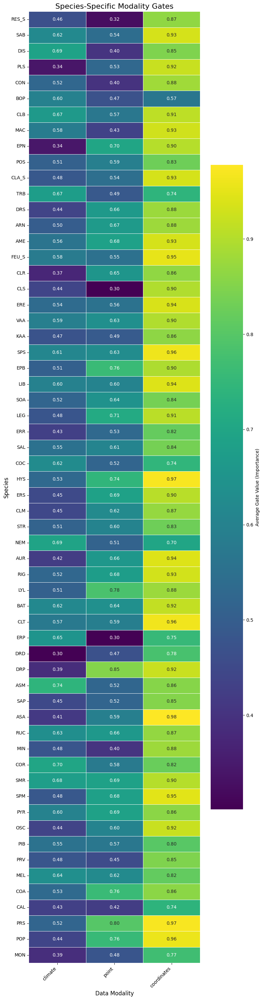

In [30]:
dataloader = DataLoader(val_dataset, batch_size=64, shuffle=False)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
debug_info = model_mixture.get_debug_info(dataloader, device, max_batches=10)

visualize_species_gates(debug_info[0], species_names)

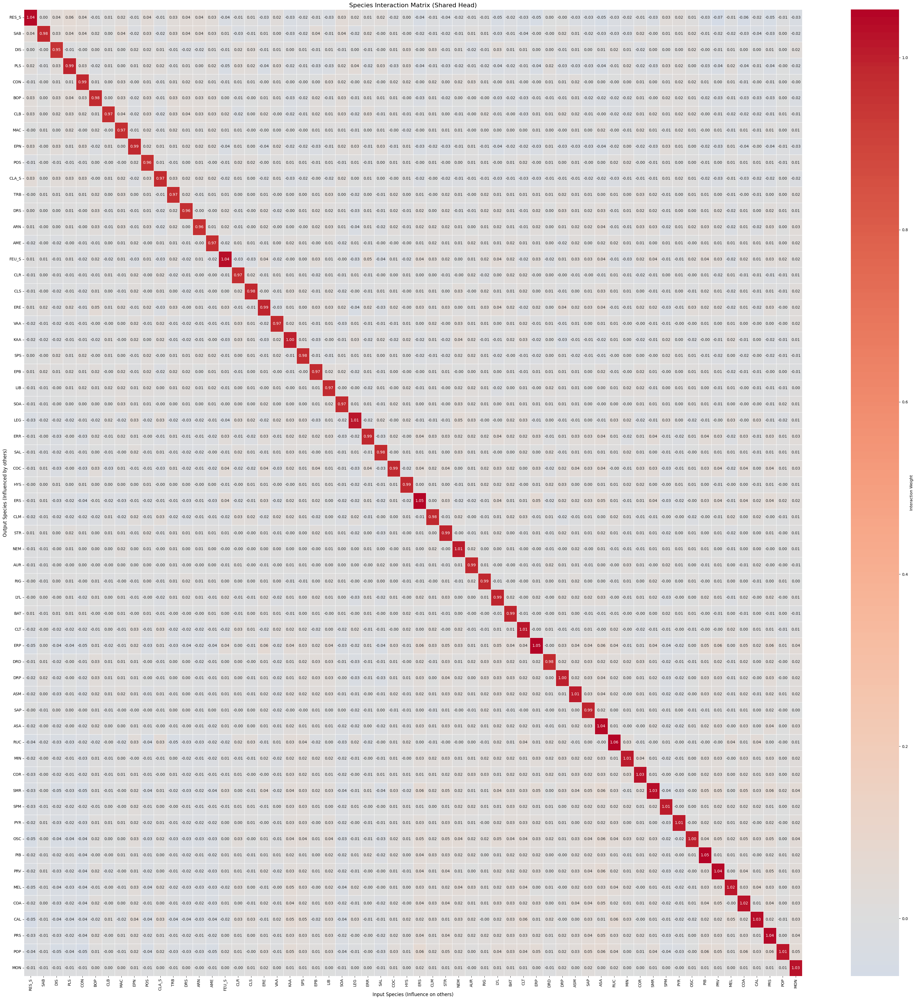

In [33]:
visualize_interaction_matrix(model_mixture, species_names)

In [ ]:
if model.shared_interaction_layer is not None:
    register_grad_hook(model_mixture.shared_interaction_layer, "InteractionLayer")

: 

: 

: 

In [45]:
# Update mixed_results: set config['name'] = config['model_name'] when present
if 'mixed_results' not in globals():
    raise NameError("mixed_results not found in the notebook namespace")

for cfg in mixed_results.get('config', []):
    if isinstance(cfg, dict) and 'model_name' in cfg:
        cfg['name'] = cfg['model_name']

print("mixed_results config names updated where 'model_name' existed.")

mixed_results config names updated where 'model_name' existed.


In [ ]:
combined_indmixed_results = {
    'final_val_metrics': simple_mixture_results['final_val_metrics'] + 
                         simple_mixture_shared_results['final_val_metrics'] + 
                         simple_mixture_ind_results['final_val_metrics'],
    'config': simple_mixture_results['config'] + 
              simple_mixture_shared_results['config'] + 
              simple_mixture_ind_results['config']
}


{'final_val_metrics': [{'per_species': {'PLS': {'precision': 0.9758871701546861,
     'recall': 0.6257292882147024,
     'f1': 0.76253110558123,
     'accuracy': 0.686826066572902,
     'specificity': 0.9367541766109785},
    'CON': {'precision': 0.8804895608351332,
     'recall': 0.4248002778742619,
     'f1': 0.5731021555763823,
     'accuracy': 0.5729020159399906,
     'specificity': 0.8803172314347513},
    'ERE': {'precision': 0.6868464501926252,
     'recall': 0.7979539641943734,
     'f1': 0.738243123336291,
     'accuracy': 0.7925457102672293,
     'specificity': 0.7894152479644707},
    'VAA': {'precision': 0.5800807537012113,
     'recall': 0.8267263427109974,
     'f1': 0.6817822304244662,
     'accuracy': 0.717065166432255,
     'specificity': 0.6535899333826795},
    'NEM': {'precision': 0.3560876209882832,
     'recall': 0.7631004366812227,
     'f1': 0.4855852726641195,
     'accuracy': 0.6528363806844819,
     'specificity': 0.6226865671641791},
    'AUR': {'precision':

/tmp/ipykernel_2541268/3853547588.py:44: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby(['presence_group','model'])[metrics]


Metrics found: ['precision', 'recall', 'f1', 'accuracy', 'specificity']


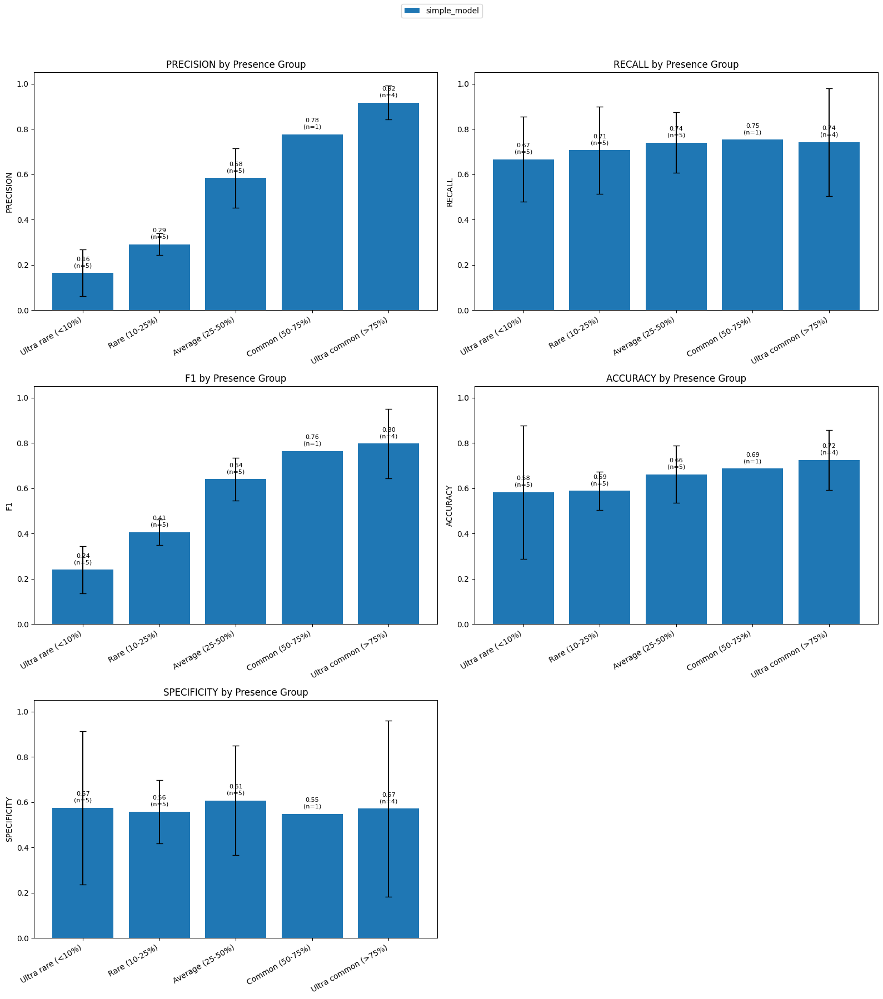

In [112]:
# ----------- USAGE -----------
combined_reg = build_combined_df(simple_mixture_results_latent, filtered_sorted_species)
combined_reg, presence_labels = add_presence_groups(combined_reg)
agg, metrics = summarize_metrics(combined_reg, presence_labels)

print("Metrics found:", metrics)

plot_grouped_bars(agg, presence_labels, metrics)


In [97]:
combined

,species,precision,recall,f1,accuracy,specificity,model,presence_ratio,presence_group
0,CON,0.794075,0.763460,0.778466,0.706751,0.589041,simple_model,0.661451,Common (50-75%)
1,POS,0.604870,0.717409,0.656350,0.573136,0.383279,simple_model,0.535137,Common (50-75%)


In [100]:
combined_reg

,species,precision,recall,f1,accuracy,specificity,model,presence_ratio,presence_group
0,CON,0.674871,1.0,0.805878,0.674871,0.0,hybrid_model,0.661451,Common (50-75%)
1,POS,0.568214,1.0,0.724664,0.568214,0.0,hybrid_model,0.535137,Common (50-75%)


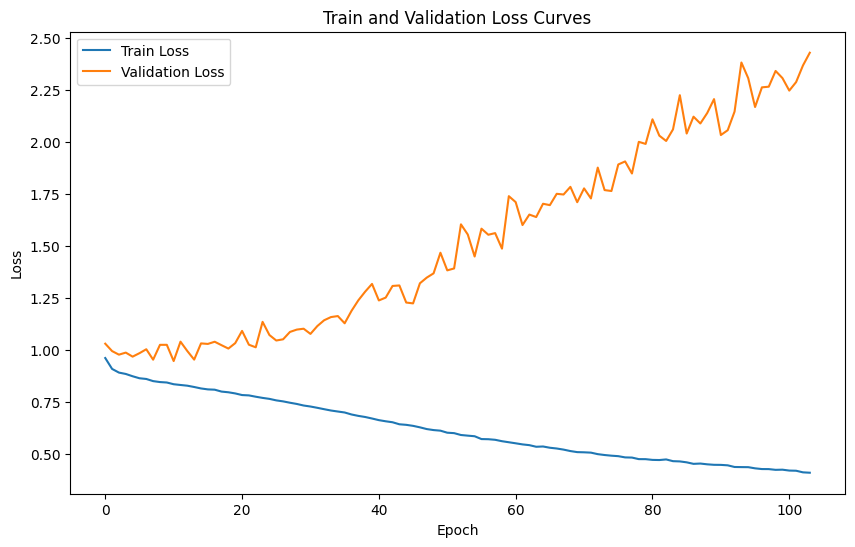

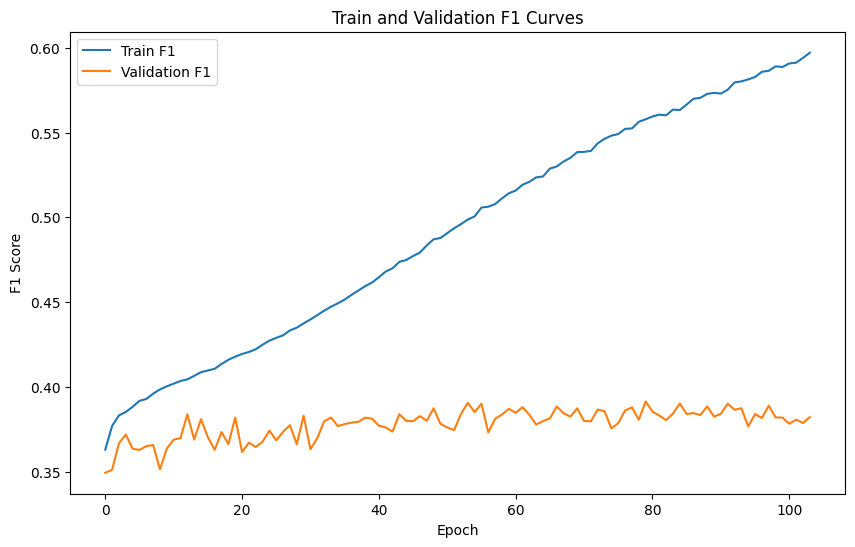

In [19]:
all_train_metrics = simple_mixture_results['all_train_metrics']
all_val_metrics = simple_mixture_results['all_val_metrics']

all_train_metrics = {
    key: [epoch_metrics[key] for epoch_metrics in all_train_metrics]
    for key in all_train_metrics[0].keys()
}
all_val_metrics = {
    key: [epoch_metrics[key] for epoch_metrics in all_val_metrics]
    for key in all_val_metrics[0].keys()
}
#plot train and val loss curves
import matplotlib.pyplot as plt
plt.figure(figsize=(10,6))
plt.plot(all_train_metrics['loss'], label='Train Loss')
plt.plot(all_val_metrics['loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Train and Validation Loss Curves')
plt.legend()
plt.show()

#plot train and val f1 curves
plt.figure(figsize=(10,6))
plt.plot(all_train_metrics['f1'], label='Train F1')
plt.plot(all_val_metrics['f1'], label='Validation F1')
plt.xlabel('Epoch')
plt.ylabel('F1 Score')
plt.title('Train and Validation F1 Curves')
plt.legend()
plt.show()

In [20]:
#print only the first 5  and last five values of train and val f1
print("Train F1 - First 5:", all_train_metrics['f1'][:5])
print("Train F1 - Last 5:", all_train_metrics['f1'][-5:])
print("Validation F1 - First 5:", all_val_metrics['f1'][:5])
print("Validation F1 - Last 5:", all_val_metrics['f1'][-5:])

#print only the first 5  and last five values of train and val loss
print("Train Loss - First 5:", all_train_metrics['loss'][:5])
print("Train Loss - Last 5:", all_train_metrics['loss'][-5:])
print("Validation Loss - First 5:", all_val_metrics['loss'][:5])
print("Validation Loss - Last 5:", all_val_metrics['loss'][-5:])

Train F1 - First 5: [0.3629679307911773, 0.3769380210309372, 0.38317544993757335, 0.3851757108877393, 0.38821095082021023]
Train F1 - Last 5: [0.5886875047802389, 0.5907907876931827, 0.5912328861378485, 0.5940469616878582, 0.5971180414235684]
Validation F1 - First 5: [0.349349861805506, 0.3510376898848825, 0.3666817918967673, 0.37187880571161325, 0.3635072604845119]
Validation F1 - Last 5: [0.3818532712999735, 0.3782630549999969, 0.3806650610312182, 0.3787063025363721, 0.3821610404683268]
Train Loss - First 5: [0.9594429571002691, 0.9070383438309241, 0.8894379984000613, 0.8828396418844561, 0.8718234304166972]
Train Loss - Last 5: [0.42270899094803915, 0.41842198171803746, 0.41762720667305614, 0.4098998894600285, 0.4080739225685932]
Validation Loss - First 5: [1.0283859884311026, 0.992788369514247, 0.9756562792749589, 0.9855680190825623, 0.9661333481459029]
Validation Loss - Last 5: [2.30528129934672, 2.245096952633693, 2.2860834528617113, 2.3658913568903075, 2.4271575029943286]


In [ ]:
from utils.model_preprocess import create_target_species_df_multiple, get_feature_importance_for_species
from utils.splitting import get_train_val_indices_blocked
from utils.model_evaluation import compute_pos_weight, get_pred_100_band_names, RandomFlipRotate
import torchvision.transforms as transforms
import pandas as pd
import numpy as np
from models.mixture_model_fusion_cnn import SimpleMultiInputCNNv2WithMixtureExperts
from models.multi_species_fusion_cnn import training_loop, SimpleMultiInputCNNv2WithLatent, SimpleMultiInputCNNv2WithSpeciesHeads, SimpleMultiInputCNNv2WithSpeciesSpecificClimate
import torch
import os
from utils.dataset import create_dataset

def save_results(metrics_df, results_file="results.csv"):
    """Append results to CSV, creating if it doesn't exist."""
    if os.path.exists(results_file):
        existing_df = pd.read_csv(results_file)
        metrics_df = pd.concat([existing_df, metrics_df], ignore_index=True)
    metrics_df.to_csv(results_file, index=False)
    print(f"Saved results to {results_file}")


def evaluate_fusion_cnn_multi_species(cell_sizes, target_species_arr, processed_species_original_locations, configs, results_file="results.csv"):
    all_results = pd.DataFrame()
    print("Starting evaluation...")

    pred_100_band_names = get_pred_100_band_names()

    target_df = create_target_species_df_multiple(target_species_arr, processed_species_original_locations)
    display(target_df.head())
    if target_df.empty:
        print(f"Warning: No data for {target_species_arr}")
        return all_results
    print(f"Target DataFrame created with {len(target_df)} records for species: {target_species_arr}")

    pos_weights = compute_pos_weight(target_df)
    print(f"Computed pos_weight: {pos_weights}")

    pred_100_indices = range(len(pred_100_band_names))

    for cell_size in cell_sizes:
        print(f"\nCell size: {cell_size} degrees")

        train_indices, val_indices, gdf_with_patches = get_train_val_indices_blocked(
            processed_species_original_locations, 
            cell_size=cell_size,
            n_splits=0.2,
        )

        if len(np.intersect1d(train_indices, val_indices)) > 0:
            raise ValueError("Train and validation indices overlap")
        if max(train_indices) >= len(target_df) or max(val_indices) >= len(target_df):
            raise ValueError(f"Indices out of bounds: max {len(target_df)-1}")

        # Cache for datasets
        dataset_cache = {}

        for config in configs:
            # Generate a key for dataset caching
            cache_key = (
                config.get("use_satelite", True),
                config.get('resize_ratio', 1),
                config.get('add_point_infos', False),
                config.get('use_pretrained_climate_cnn', False)
            )

            if cache_key not in dataset_cache:
                # Determine npy_files based on config
                if config.get("use_satelite", True):
                    npy_files = [
                        {"path": "../scratch/data/npy_data/sentinel2_patches.npy", 'name': 'sentinel2'},
                        {"path": "../scratch/data/npy_data/pred100_patches.npy", 'name': 'pred_100'},
                    ]
                else:
                    npy_files = [{"path": "../scratch/data/npy_data/pred100_patches.npy", 'name': 'pred_100'}]

                training_dataset = create_dataset(
                    npy_files=npy_files,
                    target_df=target_df,
                    processed_species_original_locations=processed_species_original_locations,
                    indices=train_indices,
                    pred_100_indices=pred_100_indices,
                    use_transform=True,
                    include_coords=True,
                    resize_ratio=config.get('resize_ratio', 1),
                    add_point_infos=config.get('add_point_infos', False),
                    feature_importance_only_tabular=config.get('use_pretrained_climate_cnn', False)
                )
                validation_dataset = create_dataset(
                    npy_files=npy_files,
                    target_df=target_df,
                    processed_species_original_locations=processed_species_original_locations,
                    indices=val_indices,
                    pred_100_indices=pred_100_indices,
                    include_coords=True,
                    resize_ratio=config.get('resize_ratio', 1),
                    add_point_infos=config.get('add_point_infos', False),
                    feature_importance_only_tabular=config.get('use_pretrained_climate_cnn', False)
                )

                dataset_cache[cache_key] = (training_dataset, validation_dataset)
            else:
                training_dataset, validation_dataset = dataset_cache[cache_key]

            input_shapes = training_dataset.effective_shapes
            print(f"\nTesting config: {config['name']}")

            # Add pos_weight to config
            config['pos_weight'] = pos_weights
            config['species'] = target_species_arr

            device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
            print("Using device:", device)

            # Choose model
            if config.get('use_independent_heads', False):
                model = SimpleMultiInputCNNv2WithSpeciesHeads(input_shapes, config).to(device)
            elif config.get('use_mixture_model', False):
                model = SimpleMultiInputCNNv2WithMixtureExperts(input_shapes, config).to(device)
            elif config.get('independent_climate_branch', False):
                model = SimpleMultiInputCNNv2WithSpeciesSpecificClimate(input_shapes, config).to(device)
            else:
                model = SimpleMultiInputCNNv2WithLatent(input_shapes, config).to(device)

            trained_model, training_results = training_loop(
                model, training_dataset, validation_dataset, config
            )
            print(model.classifier.get_mixture_statistics())
            # Collect metrics
            metrics_row = {
                'species': target_species_arr,
                'cell_size': str(cell_size),
                'config_name': config['name'],
                'train_positive_ratio': np.sum(training_dataset.targets) / len(training_dataset),
                'val_positive_ratio': np.sum(validation_dataset.targets) / len(validation_dataset)
            }
            metrics_row.update({f"val_{k}": v for k, v in training_results['final_val_metrics']['macro'].items()})

            new_metrics_df = pd.DataFrame([metrics_row])
            save_results(new_metrics_df, results_file)

            all_results = pd.concat([all_results, pd.DataFrame([training_results])], ignore_index=True)

    return all_results


In [19]:

# NEW BASE CONFIG - Apply these changes to ALL following configs
# NEW BASE CONFIG - Apply these changes to ALL following configs
base_config = {
        'use_focal_loss': False,        # Keep OFF
        'use_asymmetric_loss': False,   # Keep OFF
        'use_deeper_cnn': True,
        'print_every': 1,
        'batch_size': 256,
        'hidden_dims': [256, 128, 64],  # CHANGED from [512, 256, 128]
        'learning_rate': 1e-3,          # CHANGED from 1e-3
        'optimizer': 'adamw',
        'weight_decay': 1e-2,           # UNCOMMENTED
        'dropout': 0.5,
        'use_scheduler': True,
        'add_point_infos': True,
        'resize_ratio': 0.2,
        'use_satelite': False,
        'use_pretrained_climate_cnn': False,
        'epochs': 20,  # Reduce from 50
        'early_stopping_patience': 3,  # Reduce from 10
        'early_stopping_warmup': 2,   # Reduce from 5
        'early_stopping_delta': 0.01, # Increase from 0.001 for stricter improvement
        'early_stopping_metric': 'f1', # F1 often stabilizes faster than loss
}

configs = [
    # {
    #     **base_config,  # This injects all the base settings
    #     'name': 'SimpleMultiInputCNNv2WithSpeciesSpecificClimate',
    #     "species_classifier": 'mixture_expert_with_init',
    #     "init_version": "v2",
    #     'use_balanced_sampler': False,
    #     'use_attention': True,
    #     'use_pretrained_climate_cnn': True,
    #     'use_independent_heads': False,
    #     "use_mixture_model": False,
    #     "independent_climate_branch": True,
    #     'species_configs': create_species_configs(species_names, prevalences, loss_type="asymmetric", variant='default'),
    #     'species_head_dims': [256, 128, 64],
    #     'use_spp': False,
    #     'use_satelite': True,
    #     'weight_decay': 1e-2,
    #     'use_latent': False,        # Enable latent variable usage    
    # },
    {
        'name': 'WDecay 1e-2 Dropout 0.1',
        'use_attention': True,
        'use_pretrained_climate_cnn': True,
        'use_spp': False,
        'use_satelite': True,
        'dropout': 0.1,
        **base_config  # This injects all the base settings
    },
    # {
    #     **base_config,  # This injects all the base settings
    #     'name': 'Mixture experts',
    #     "freeze_backbones": False,
    #     "compute_weighted_loss": True,
    #     "scale_loss": True,
    #     "species_classifier": 'mixture_expert_v2',
    #     "init_version": "v2",
    #     'use_balanced_sampler': False,
    #     'use_attention': True,
    #     'use_pretrained_climate_cnn': True,
    #     'use_independent_heads': False,
    #     "use_mixture_model": True,
    #     'species_configs': create_species_configs(species_names, prevalences, loss_type="asymmetric", variant='default'),
    #     'species_head_dims': [256, 128, 64],
    #     'use_spp': False,
    #     'use_satelite': False,
    #     'weight_decay': 0,
    #     'dropout': 0.0,
    #     'use_latent': False,        # Enable latent variable usage   
    #     'mode': 'mixture' 
    # },
    # {
    #     **base_config,  # This injects all the base settings
    #     'name': 'Shared expert',
    #     "freeze_backbones": False,
    #     "compute_weighted_loss": True,
    #     "scale_loss": True,
    #     "species_classifier": 'mixture_expert_v2',
    #     "init_version": "v2",
    #     'use_balanced_sampler': False,
    #     'use_attention': True,
    #     'use_pretrained_climate_cnn': True,
    #     'use_independent_heads': False,
    #     "use_mixture_model": True,
    #     'species_configs': create_species_configs(species_names, prevalences, loss_type="asymmetric", variant='default'),
    #     'species_head_dims': [256, 128, 64],
    #     'use_spp': False,
    #     'use_satelite': False,
    #     'weight_decay': 0,
    #     'dropout': 0.0,
    #     'use_latent': True,        # Enable latent variable usage   
    #     'mode': 'shared' 
    # },
    # {
    #     **base_config,  # This injects all the base settings
    #     'name': 'Species specific expert',
    #     "freeze_backbones": False,
    #     "compute_weighted_loss": True,
    #     "scale_loss": True,
    #     "species_classifier": 'mixture_expert_v2',
    #     "init_version": "v2",
    #     'use_balanced_sampler': False,
    #     'use_attention': True,
    #     'use_pretrained_climate_cnn': True,
    #     'use_independent_heads': False,
    #     "use_mixture_model": True,
    #     'species_configs': create_species_configs(species_names, prevalences, loss_type="asymmetric", variant='default'),
    #     'species_head_dims': [256, 128, 64],
    #     'use_spp': False,
    #     'use_satelite': False,
    #     'weight_decay': 0,
    #     'dropout': 0.0,
    #     'use_latent': True,        # Enable latent variable usage   
    #     'mode': 'specific' 
    # },

    

       
    # {
    #     **base_config,  # This injects all the base settings
    #     'name': 'Common Heads + Species specific',
    #     "species_classifier": 'species_specific',
    #     'use_balanced_sampler': False,
    #     'use_attention': True,
    #     'use_pretrained_climate_cnn': True,
    #     'use_independent_heads': False,
    #     'species_configs': create_species_configs(species_names, prevalences, loss_type="asymmetric", variant='default'),
    #     'species_head_dims': [256, 128, 64],
    #     'use_spp': False,
    #     'use_satelite': True,
    #     'weight_decay': 1e-2,
    #     'use_latent': False,        # Enable latent variable usage    
    # },
  
    
]


#cell_sizes = [0.5, 1, 1.5]
cell_sizes = [1]
#target_species_arr = ['ERP', 'SAB','LEG']  # Add more species
target_species_arr = species_names
results_mixture = evaluate_fusion_cnn_multi_species(cell_sizes, target_species_arr, processed_species_original_locations, configs)

Starting evaluation...


,RES_S,SAB,DIS,PLS,CON,BOP,CLB,MAC,EPN,POS,...,PYR,OSC,PIB,PRV,MEL,COA,CAL,PRS,POP,MON
0,1,1,0,0,1,1,0,1,1,0,...,0,0,0,0,1,0,0,0,0,0
1,1,1,0,1,1,1,1,1,1,1,...,0,0,1,0,0,0,0,0,0,0
2,1,1,0,0,1,1,1,1,0,0,...,0,0,1,0,0,0,0,0,0,0
3,1,1,0,0,1,1,1,1,0,0,...,0,0,1,0,0,0,0,0,0,0
4,1,1,0,0,0,1,1,1,0,0,...,0,0,1,0,0,0,0,0,0,0


Target DataFrame created with 24732 records for species: ['RES_S', 'SAB', 'DIS', 'PLS', 'CON', 'BOP', 'CLB', 'MAC', 'EPN', 'POS', 'CLA_S', 'TRB', 'DRS', 'ARN', 'AME', 'FEU_S', 'CLR', 'CLS', 'ERE', 'VAA', 'KAA', 'SPS', 'EPB', 'LIB', 'SOA', 'LEG', 'ERR', 'SAL', 'COC', 'HYS', 'ERS', 'CLM', 'STR', 'NEM', 'AUR', 'RIG', 'LYL', 'BAT', 'CLT', 'ERP', 'DRD', 'DRP', 'ASM', 'SAP', 'ASA', 'RUC', 'MIN', 'COR', 'SMR', 'SPM', 'PYR', 'OSC', 'PIB', 'PRV', 'MEL', 'COA', 'CAL', 'PRS', 'POP', 'MON']
Computed pos_weight: [0.029170654571166754, 0.2324712214081664, 0.2570266836085098, 0.2610646542931567, 0.5118283513659075, 0.5224376731298723, 0.5998447506303125, 0.6669137965891575, 0.7212053726767894, 0.8686815262554827, 1.0439669421478974, 1.0527888446206402, 1.0682388359248467, 1.0877933479646396, 1.090440368522449, 1.2450980392145559, 1.3066592053709134, 1.3150800336971682, 1.3226897069859853, 1.3778482838175388, 1.6751757706850456, 1.7216903268386465, 1.731912073343939, 1.7993208828502554, 1.831368059528

NameError: name 'SimpleMultiInputCNNv2WithLatent' is not defined

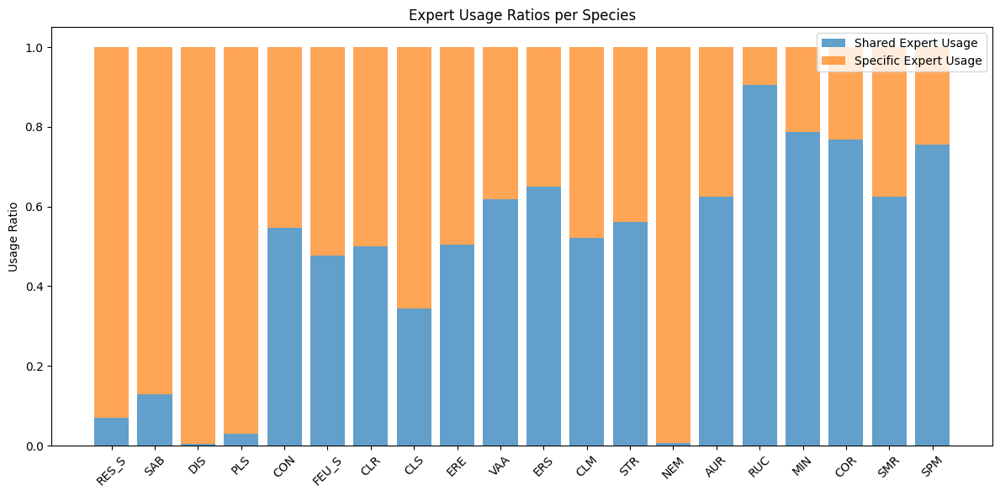

In [26]:
mixture_data = {'species_0': {'shared_expert_usage': 0.06976001709699631, 'specific_expert_usage': 0.9302399754524231, 'preference_ratio': 0.07499141962067826}, 'species_1': {'shared_expert_usage': 0.12883007526397705, 'specific_expert_usage': 0.8711699843406677, 'preference_ratio': 0.14788167189054785}, 'species_2': {'shared_expert_usage': 0.0038021239452064037, 'specific_expert_usage': 0.9961978793144226, 'preference_ratio': 0.003816635214739315}, 'species_3': {'shared_expert_usage': 0.030249424278736115, 'specific_expert_usage': 0.9697505235671997, 'preference_ratio': 0.031192995756820538}, 'species_4': {'shared_expert_usage': 0.5472958087921143, 'specific_expert_usage': 0.45270422101020813, 'preference_ratio': 1.2089478544762555}, 'species_5': {'shared_expert_usage': 0.4768577814102173, 'specific_expert_usage': 0.5231422185897827, 'preference_ratio': 0.9115260733121604}, 'species_6': {'shared_expert_usage': 0.49934524297714233, 'specific_expert_usage': 0.5006548166275024, 'preference_ratio': 0.9973842584137623}, 'species_7': {'shared_expert_usage': 0.3429533541202545, 'specific_expert_usage': 0.6570466756820679, 'preference_ratio': 0.5219619268975401}, 'species_8': {'shared_expert_usage': 0.5043830275535583, 'specific_expert_usage': 0.49561700224876404, 'preference_ratio': 1.0176870750764189}, 'species_9': {'shared_expert_usage': 0.6181714534759521, 'specific_expert_usage': 0.3818284869194031, 'preference_ratio': 1.6189767355327507}, 'species_10': {'shared_expert_usage': 0.6507518887519836, 'specific_expert_usage': 0.34924808144569397, 'preference_ratio': 1.8632940442372374}, 'species_11': {'shared_expert_usage': 0.521210253238678, 'specific_expert_usage': 0.478789746761322, 'preference_ratio': 1.0885994236056782}, 'species_12': {'shared_expert_usage': 0.5615918636322021, 'specific_expert_usage': 0.43840816617012024, 'preference_ratio': 1.2809794482808223}, 'species_13': {'shared_expert_usage': 0.006157625466585159, 'specific_expert_usage': 0.9938424825668335, 'preference_ratio': 0.006195776003380208}, 'species_14': {'shared_expert_usage': 0.6243809461593628, 'specific_expert_usage': 0.3756190836429596, 'preference_ratio': 1.662271585035187}, 'species_15': {'shared_expert_usage': 0.9041838049888611, 'specific_expert_usage': 0.09581616520881653, 'preference_ratio': 9.436650993617022}, 'species_16': {'shared_expert_usage': 0.7876564860343933, 'specific_expert_usage': 0.21234361827373505, 'preference_ratio': 3.709348344651127}, 'species_17': {'shared_expert_usage': 0.7673270106315613, 'specific_expert_usage': 0.2326730638742447, 'preference_ratio': 3.297876277021581}, 'species_18': {'shared_expert_usage': 0.6245731115341187, 'specific_expert_usage': 0.37542688846588135, 'preference_ratio': 1.6636344228032973}, 'species_19': {'shared_expert_usage': 0.755622148513794, 'specific_expert_usage': 0.24437779188156128, 'preference_ratio': 3.092024491160655}}

#plot expert usage ratios
import matplotlib.pyplot as plt 
species_indices = list(range(len(species_names)))
shared_usages = [mixture_data[f'species_{i}']['shared_expert_usage'] for i in species_indices]
specific_usages = [mixture_data[f'species_{i}']['specific_expert_usage'] for i in species_indices]
preference_ratios = [mixture_data[f'species_{i}']['preference_ratio'] for i in species_indices]
plt.figure(figsize=(12,6))
plt.bar(species_indices, shared_usages, label='Shared Expert Usage', alpha=0.7)
plt.bar(species_indices, specific_usages, bottom=shared_usages, label='Specific Expert Usage', alpha=0.7)
plt.xticks(species_indices, species_names, rotation=45)
plt.ylabel('Usage Ratio')
plt.title('Expert Usage Ratios per Species')
plt.legend()
plt.tight_layout()
plt.show()

In [23]:
from utils.model_evaluation import evaluate_xgb_for_species

#target_species_arr = ['ERP', 'SAB','RUI', 'SOA']
target_species_arr = species_names



params = {
    'objective': 'binary:logistic',  # for binary classification
    'booster': 'gbtree',
    'eval_metric': ['logloss', 'aucpr'], # Monitor both during training
    'max_depth': 6,                   # Your good initial guess - controls complexity
    'eta': 0.1,                       # The learning rate - VERY important
    'subsample': 0.8,                 # Randomly sample 80% of data for each tree (prevents overfitting)
    'colsample_bytree': 0.8,          # Randomly sample 80% of features for each tree (prevents overfitting)
    'min_child_weight': 1,            # A smaller value lets the model fit more specific samples
    'tree_method': 'hist',            # Faster training ("hist" for histogram-based)
    'seed': 42                        # For reproducibility
}
model = 'xgb'

# splits = [
#     [0, 6, 7, 1, 2, 8],
#     [30, 31, 32, 24, 25, 26, 18, 19, 20],
#     [34, 35, 28, 29, 22, 23],
#     [15, 16, 17, 9, 10, 11, 3, 4, 5],
#     [13, 14, 15, 7, 8, 9, 1, 2, 3],
#     [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11],
#     [0, 1, 6, 7, 12, 13, 18, 19, 24, 25, 30, 31]
# ]

xgb_results_df = evaluate_xgb_for_species(
    target_species_arr=target_species_arr,
    train_indices = train_indices,
    val_indices = val_indices,
    processed_species=processed_species_original_locations,
    model_params = params
)

In [25]:
results["final_val_metrics"]

[{'per_species': {'RES_S': {'precision': 0.9929017603634299,
    'recall': 0.8494049064853049,
    'f1': 0.9155648645110617,
    'accuracy': 0.8488045007032349,
    'specificity': 0.8322147651006712},
   'SAB': {'precision': 0.9482758620689655,
    'recall': 0.7561869844179652,
    'f1': 0.8414074451810301,
    'accuracy': 0.7812939521800282,
    'specificity': 0.8640483383685801},
   'DIS': {'precision': 0.9183212996389891,
    'recall': 0.5926033779848573,
    'f1': 0.720353982300885,
    'accuracy': 0.6296296296296297,
    'specificity': 0.7824519230769231},
   'PLS': {'precision': 0.9708511465215701,
    'recall': 0.7287047841306884,
    'f1': 0.8325279120146643,
    'accuracy': 0.7644163150492265,
    'specificity': 0.9105011933174224},
   'CON': {'precision': 0.8482280431432974,
    'recall': 0.7648489058700938,
    'f1': 0.8043835616438356,
    'accuracy': 0.7489451476793249,
    'specificity': 0.7159336697909157},
   'FEU_S': {'precision': 0.7439846005774784,
    'recall': 0.90

In [ ]:
results.iloc[0]

train_metrics        {'loss': [0.4175613020794301, 0.37842258735548...
val_metrics          {'loss': [0.41187715881011067, 0.4532973468303...
best_val_metric                                               0.599156
best_epoch                                                           5
final_val_metrics    {'macro': {'accuracy': 0.7175339896858884, 'f1...
stopped_early                                                     True
epochs_completed                                                    13
config               {'use_focal_loss': False, 'use_asymmetric_loss...
Name: 0, dtype: object

In [43]:
results.iloc[0]["config"]

{'use_focal_loss': False,
 'use_asymmetric_loss': False,
 'use_deeper_cnn': True,
 'print_every': 1,
 'batch_size': 256,
 'hidden_dims': [256, 128, 64],
 'learning_rate': 0.001,
 'optimizer': 'adamw',
 'weight_decay': 0.01,
 'dropout': 0.5,
 'use_scheduler': True,
 'add_point_infos': False,
 'resize_ratio': 0.2,
 'use_amp': True,
 'accumulation_steps': 2,
 'use_satelite': True,
 'use_pretrained_climate_cnn': True,
 'epochs': 30,
 'early_stopping_patience': 8,
 'early_stopping_warmup': 5,
 'early_stopping_delta': 0.01,
 'early_stopping_metric': 'f1',
 'name': 'SimpleMultiInputCNNv2WithMixtureExperts + frozen_backbones + weigthed_loss',
 'freeze_backbones': False,
 'compute_weighted_loss': True,
 'scale_loss': True,
 'species_classifier': 'mixture_expert_with_init',
 'init_version': 'v2',
 'use_balanced_sampler': False,
 'use_attention': True,
 'use_independent_heads': False,
 'use_mixture_model': True,
 'species_configs': [{'name': 'RES_S',
   'prevalence': 0.9716561539705645,
   'hidde

In [56]:
[results_mixture.iloc[0]['final_val_metrics']]

[{'macro': {'accuracy': 0.7357829348335678,
   'f1': 0.6137042410196939,
   'precision': 0.5397492844039488,
   'recall': 0.839645597840256,
   'pr_auc': 0.6338389682669747,
   'specificity': 0.6472253991032153,
   'loss': 0.4381084845346563},
  'per_species': {'RES_S': {'accuracy': 0.9226441631504922,
    'f1': 0.9588426041406835,
    'precision': 0.9853883619584722,
    'recall': 0.93368957979111,
    'pr_auc': 0.9962535855760977,
    'specificity': 0.6174496644295302},
   'SAB': {'accuracy': 0.8553680262541022,
    'f1': 0.9084162089951017,
    'precision': 0.8833718244803695,
    'recall': 0.9349220898258478,
    'pr_auc': 0.9677839485369586,
    'specificity': 0.5931520644511581},
   'DIS': {'accuracy': 0.7848101265822784,
    'f1': 0.8705583756345178,
    'precision': 0.8439037725533078,
    'recall': 0.8989516598718695,
    'pr_auc': 0.9174685378988353,
    'specificity': 0.3137019230769231},
   'PLS': {'accuracy': 0.8666197843413034,
    'f1': 0.9177626824685648,
    'precision

/tmp/ipykernel_2553341/3990014131.py:44: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby(['presence_group','model'])[metrics]


Metrics found: ['precision', 'recall', 'f1', 'accuracy', 'specificity', 'pr_auc']


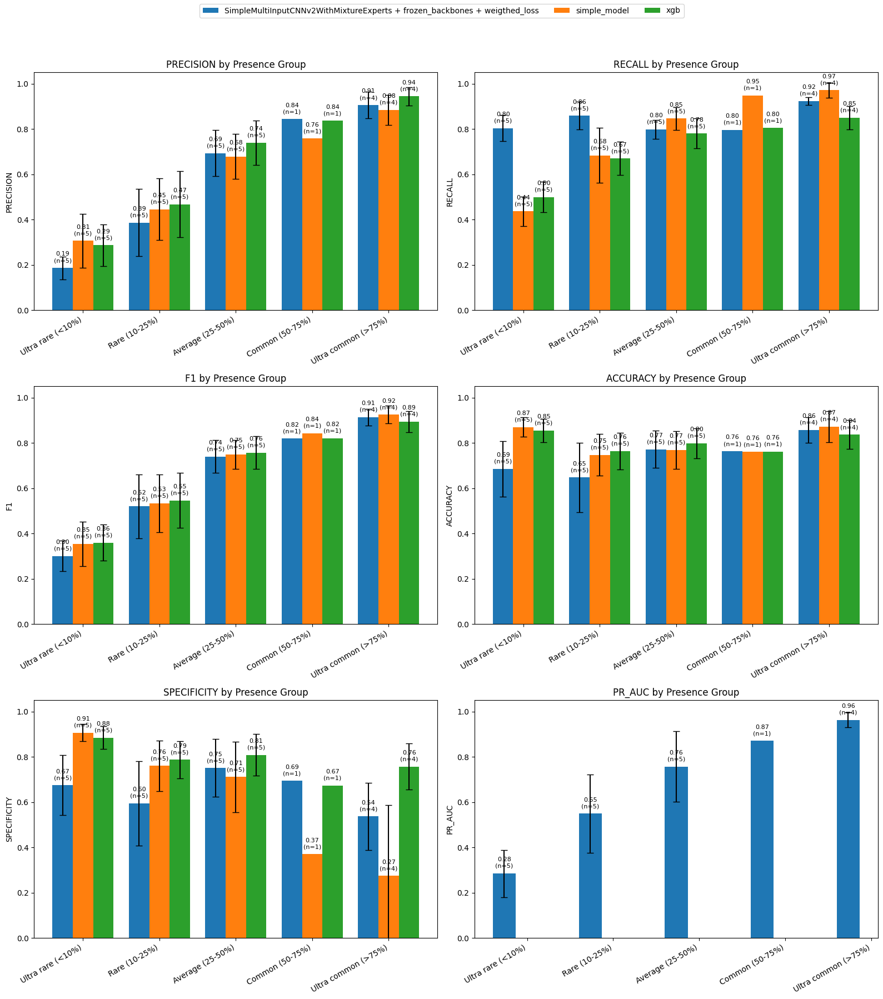

In [57]:
def wrap_xgb_results(xgb_results_df, model_name="xgb"):
    per_species = {}
    for _, row in xgb_results_df.iterrows():
        per_species[row['species']] = {
            "precision": row["val_precision"],
            "recall": row["val_recall"],
            "f1": row["val_f1"],
            "accuracy": row["val_accuracy"],
            "specificity": row["val_specificity"],
            #"auc": row["val_roc_auc"],
        }
    return {
        "config": [{"name": model_name}],
        "final_val_metrics": [{"per_species": per_species}]
    }
wrapped_xgb_results = wrap_xgb_results(xgb_results_df, model_name="xgb")

name = [{"name" : results_mixture.iloc[0]['config']['name']}]
combined_results = {
    "config": results["config"] + wrapped_xgb_results["config"] + name,
    "final_val_metrics": results["final_val_metrics"] + wrapped_xgb_results["final_val_metrics"] + [results_mixture.iloc[0]['final_val_metrics']]
}

combined = build_combined_df(combined_results, filtered_sorted_species)
combined, presence_labels = add_presence_groups(combined)
agg, metrics = summarize_metrics(combined, presence_labels)

print("Metrics found:", metrics)

plot_grouped_bars(agg, presence_labels, metrics)

In [58]:
combined

,species,precision,recall,f1,accuracy,specificity,model,presence_ratio,pr_auc,presence_group
0,RES_S,0.965752,1.000000,0.982578,0.965776,0.020134,simple_model,0.971656,NaN,Ultra common (>75%)
1,SAB,0.894063,0.938588,0.915785,0.867557,0.633434,simple_model,0.811378,NaN,Ultra common (>75%)
2,DIS,0.805725,1.000000,0.892412,0.805907,0.004808,simple_model,0.795528,NaN,Ultra common (>75%)
3,PLS,0.873353,0.947491,0.908913,0.847398,0.437947,simple_model,0.792981,NaN,Ultra common (>75%)
4,CON,0.757492,0.948246,0.842203,0.760197,0.369863,simple_model,0.661451,NaN,Common (50-75%)
5,FEU_S,0.835097,0.877635,0.855838,0.881622,0.884285,simple_model,0.445415,NaN,Average (25-50%)
6,CLR,0.657895,0.851351,0.742224,0.743554,0.661010,simple_model,0.433527,NaN,Average (25-50%)
7,CLS,0.559876,0.885683,0.686064,0.650961,0.473446,simple_model,0.431951,NaN,Average (25-50%)
8,ERE,0.652004,0.852941,0.739058,0.779184,0.736491,simple_model,0.430535,NaN,Average (25-50%)
9,VAA,0.689416,0.762148,0.723960,0.786920,0.801258,simple_model,0.420548,NaN,Average (25-50%)
